In [1]:
#Karl CMB Project
# M1 - Traditional 3D CNN - Training using SWI Data


UsageError: Line magic function `%install_ext` not found.


In [3]:


# Imports
import argparse
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.data as data
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms

import random

import numpy as np
import pdb

import matplotlib.pyplot as plt
import nibabel as nib
import os
import scipy.io
import pylab
# Training settings
#%matplotlib notebook



In [4]:
# Hyperparameters
num_epochs = 200
#num_classes = 2
batch_size = 5 
learning_rate = 1e-3
momentum = 0.9
dr = 0.3
weight_decay = 1e-4


In [5]:
# 0. Loading Data
# 
# loading extracted CMB and non-CMB Regions Of Interest
# 

ROI_total = np.load('isoCMB.npy').item() 
print("Total Number of Subjects (SWI Contrast):",len(ROI_total))

ROI = []
# array to store ROIs

for i in range(len(ROI_total)):
    #print("Sample Pixel Value of 1st CMB for subject N%s at (0,0,0):"%(i+1), ROI_total['N%s'%(i+1)][0][0][0][0])
    
    #indexing: (cmb#, x, y, z)
    
    # merge all subjects' CMB into one array
    for j in range(len(ROI_total['N%s'%(i+1)])):
        ROI.append(np.asarray(ROI_total['N%s'%(i+1)][j]))

#ROI: 74 SWI CMBs. 

#We will partition 74 into 59 train / 15 test. (80:20 = train:test ratio)

NCR_total1 = np.load('NonCMB1.npy').item()
NCR_total2 = np.load('NonCMB2.npy').item()
print("Number of Subjects (Part 1) (SWI Contrast):",len(NCR_total1))
print("Number of Subjects (Part 2) (SWI Contrast):",len(NCR_total2))

Total Number of Subjects (SWI Contrast): 20
Number of Subjects (Part 1) (SWI Contrast): 10
Number of Subjects (Part 2) (SWI Contrast): 10


In [6]:
NCR1 = []

for i in range(len(NCR_total1)):
    #print("Sample Pixel Value of 1st CMB for subject N%s at (0,0,0):"%(i+1), NCR_total['N%s'%(i+1)][0][0][0][0])
    
    #indexing: (cmb#, x, y, z)
    
    # merge all subjects' CMB into one array
    for j in range(len(NCR_total1['N%s'%(i+1)])):
        NCR1.append(np.asarray(NCR_total1['N%s'%(i+1)][j]))

NCR2 = []

for i in range(len(NCR_total2)):
    #print("Sample Pixel Value of 1st CMB for subject N%s at (0,0,0):"%(i+1), NCR_total['N%s'%(i+1)][0][0][0][0])
    
    #indexing: (cmb#, x, y, z)
    # merge all subjects' CMB into one array
    for j in range(len(NCR_total2['N%s'%(i+11)])):
        NCR2.append(np.asarray(NCR_total2['N%s'%(i+11)][j]))   

# NCR: 400 SWI non CMBs. 

# We will partition 400 into 320 train / 80 test. (80:20 = train:test ratio)

NCR = NCR1 + NCR2
# Merge both part 1 and 2 to get all Non CMB Regions.

random.shuffle(ROI)
random.shuffle(NCR)
# shuffle them.

SWI_train = []
# training dataset

SWI_train += ROI[:59]
SWI_train += NCR[:320]
# Train Data: 0~59 = CMB
# Train Data: 60~320 = Non-CMB

print('Number of Items in Train Data: %s' % len(SWI_train))
SWI_test = []
SWI_test += ROI[59:]
SWI_test += NCR[320:]

#print(SWI_train)
SWI_train = np.array(SWI_train)
SWI_train = np.expand_dims(SWI_train, axis=1)
# expanded to fit network architecture of 1 channel. 
print('Shape of Train Data Vector:', SWI_train.shape)
SWI_test = np.array(SWI_test)
SWI_test = np.expand_dims(SWI_test, axis=1)
#print(len(SWI_test))

Number of Items in Train Data: 379
Shape of Train Data Vector: (379, 1, 16, 16, 16)


In [7]:
# # MRI Image Viewer Tool


# def remove_keymap_conflicts(new_keys_set):
#     for prop in plt.rcParams:
#         if prop.startswith('keymap.'):
#             keys = plt.rcParams[prop]
#             remove_list = set(keys) & new_keys_set
#             for key in remove_list:
#                 keys.remove(key)

# def multi_slice_viewer(volume):
#     remove_keymap_conflicts({'j', 'k'})
#     fig, ax = plt.subplots()
#     ax.volume = volume
#     ax.index = volume.shape[0] // 2
#     ax.imshow(volume[ax.index],cmap = 'gray')
#     #for mouse scroll
#     fig.canvas.mpl_connect('scroll_event', onscroll)
#     #for key control
#     #fig.canvas.mpl_connect('key_press_event', process_key)
#     ax.set_ylabel('slice %s' % ax.index)

# # onscroll source: https://matplotlib.org/2.1.2/gallery/animation/image_slices_viewer.html    
# def onscroll(event):
#     fig = event.canvas.figure
#     ax = fig.axes[0]
#     print("%s %s" % (event.button, event.step))
#     if event.button == 'up':
#         previous_slice(ax)
#     else:
#         next_slice(ax)
#     fig.canvas.draw()
#     ax.set_ylabel('slice %s' % ax.index)

# def process_key(event):
#     fig = event.canvas.figure
#     ax = fig.axes[0]
#     if event.key == 'j':
#         previous_slice(ax)
#     elif event.key == 'k':
#         next_slice(ax)
#     fig.canvas.draw()

# def previous_slice(ax):
#     volume = ax.volume
#     ax.index = (ax.index - 1) % volume.shape[0]  # wrap around using %
#     ax.images[0].set_array(volume[ax.index])

# def next_slice(ax):
#     volume = ax.volume
#     ax.index = (ax.index + 1) % volume.shape[0]
#     ax.images[0].set_array(volume[ax.index])


In [8]:
# multi_slice_viewer(SWI_train[24][0])

In [9]:
# Creating labels for training and testing dataset

target_train = []
target_test =[]
count = 0
for i in range(0,59):
    target_train.append(np.array([1]))
    
# create 60 labels for Yes CMB.

for i in range(0,320):
    target_train.append(np.array([0]))

# create 320 labels for No CMB.

for i in range(59,74):
    target_test.append(np.array([1]))
    
# create 14 labels for Yes CMB.

for i in range(320,400):
    target_test.append(np.array([0]))
    
# create 80 labels for No CMB.

target_train = np.array(target_train)
target_test = np.array(target_test)

#print(target_train, '\n')

#print(target_test)

In [10]:

# class CustomDataset(data.Dataset):

#     def __init__(self, list_SWI, targets):
#         'Initialization'
#         self.to_tensor = transforms.ToTensor()
#         self.targets = targets
#         self.list_SWI = list_SWI


#     def __len__(self):
#         'Denotes the total number of samples'
#         return len(self.list_SWI)

#     def __getitem__(self, index):
#         'Generates one sample of data'

#         SWI_image = self.list_SWI[index]
#         SWI_tensor = self.to_Tensor(SWI_image)
#         #print(SWI_tensor.shape)
#         SWI_tensor = SWI_tensor[None,:,:,:]
#         #print(SWI_tensor.shape)
#         target = self.targets[index]
        
        
#         return SWI_tensor, target


In [11]:
#train dataset conversion: np array -> torch tensor -> torch dataset

#train_tensor_x = torch.stack([torch.Tensor(i) for i in SWI_train]) # transform to torch tensors
#train_tensor_y = torch.stack([torch.Tensor(i) for i in target_train])
#print(train_tensor_x.shape)

#train_dataset = data.TensorDataset(train_tensor_x,train_tensor_y) # create your datset



train_dataset = data.TensorDataset(torch.from_numpy(SWI_train), torch.from_numpy(target_train))
# create a custom tensor train dataset from numpy array. 


#train_dataset = CustomDataset(SWI_train, target_train)
train_loader = data.DataLoader(dataset = train_dataset, batch_size = batch_size, shuffle = True)
# batch dataloader 


In [12]:
#test dataset conversion: np array -> torch tensor -> torch dataset

test_dataset = data.TensorDataset(torch.from_numpy(SWI_test), torch.from_numpy(target_test))
# create a custom tensor test dataset from numpy array.

test_loader = data.DataLoader(dataset = test_dataset, batch_size = 1, shuffle = False)
# batch dataloader.
# no shuffling for test dataset.

In [13]:
# 1. Model Architecture
# INPUT: 
# - 1 x 16 x 16 x 16 image
# CONV1: 3d CONV
# MAXPOOL: 3d MP
# CONV2: 3d CONV
# CONV3: 3d CONV
# FC1: Fully Connected Layer
# FC2: Fully Connected Layer

class M1(nn.Module):
    def __init__(self):
        super(M1, self).__init__()
        self.conv1 = nn.Sequential(nn.Conv3d(1,64, (5,5,5),padding = 2),nn.Dropout(dr)) # in_channel, out_channel, kernel
        self.pool = nn.MaxPool3d((2, 2, 2),2) # kernel, stride
        self.conv2 = nn.Sequential(nn.Conv3d(64, 64, (3,3,3), padding = 1), nn.Dropout(dr)) # in_channel, out_channel, kernel
        self.conv3 = nn.Sequential(nn.Conv3d(64, 64, (3,3,3), padding = 1), nn.Dropout(dr)) # in_channel, out_channel, kernel
        self.fc1 = nn.Sequential(nn.Linear(8*8*8*64,150),nn.Dropout(dr))
        self.fc2 = nn.Sequential(nn.Linear(150,1),nn.Dropout(dr))

    def forward(self,x):
#         print('Input Shape: ', x.shape)
        x = F.relu(self.conv1(x))
#         print('Shape after CONV1: ', x.shape)
        # Conv1 Activation: ReLU
        x = self.pool(x)
#         print('Shape after Maxpool: ', x.shape)
        # Followed by Maxpool
     
        x = F.relu(self.conv2(x))
#         print('Shape after CONV2: ', x.shape)
        # Conv2 Activation: ReLU
        
        x = F.relu(self.conv3(x))
#         print('Shape after CONV3: ', x.shape)
        # Conv3 Activation: ReLU
        
        x = x.reshape(x.size(0),-1)
#         print('Shape after flatten: ', x.shape)
        # flatten vector
              
        x = F.relu(self.fc1(x))
        # FC1 Activation: ReLU
#         print('Shape after FC1: ', x.shape)
        x = self.fc2(x)
        # FC2 Activation: None
#         print('Shape after FC2: ', x.shape)
        m = nn.Sigmoid()
#         print('Shape after Sigmoid Output: ', x.shape)

        x = m(x)
        # Output Activation: Sigmoid
        return x

m1 = M1()

In [14]:
# 2. Loss and Optimizer

criterion = nn.BCELoss()
# Binary Cross Entropy Loss

optimizer = optim.SGD(m1.parameters(), lr = learning_rate, weight_decay = weight_decay)
# SGD Optimizer
# Regularization: Weight Decay



In [15]:
# Function for Validation Accuracy (to be used during training as well)

def testAccuracy(test_loader, m1):
    m1.eval()  # eval mode (batchnorm uses moving mean/variance instead of mini-batch mean/variance)
    m1.to(device)
    with torch.no_grad(): # don't compute grads because we're not backpropagating.
        
        correct = 0 # number of correctly guessed cases
        valloss = 0 # validation loss
        total = 0 # total number of cases
        
        # Use Test Dataset to Compute Validation Loss
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            images = images.float()
            labels = labels.float()


            outputs = m1(images)
            predicted = (outputs>0.5).float()

            
            print("target label: ",labels)
            # What the target label is
            
            print("predicted label: ",predicted)
            # What the model predicts the label to be

            # go through the vector of predicted labels
            for i in range(len(predicted)):
                if predicted[i] == labels[i]:
                    correct += 1
                    
            print('number of correct matches: ', correct)
            # number of correct label matches
            total += len(labels)
            
            loss = criterion(outputs, labels)
            # compute loss between target label and predicted output label (unrounded this time)
            
            valloss += loss.item()
            # should this be +=?

        
    
    accruacy = correct/total * 100
    return valloss, accruacy
    #print('Test Accuracy of the model on the test images: {} %'.format(100 * correct / 38))



In [16]:
# 3. Training Loop

device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
m1.to(device)

total_loss = []
total_accuracy = []
valloss =[]
total_step = len(train_loader)
for epoch in range(num_epochs):
    steploss = 0
    for i, (images, labels) in enumerate(train_loader):
        images = images.to(device)
        #print("image",images.shape)
        labels = labels.to(device)
        #print(labels.shape)
        images = images.float()
        labels = labels.float()
        
        outputs = m1(images)
        print("ouput shape: ",outputs.shape)
        print("outputs: ", outputs)
        #pdb.set_trace()
        print('target label:',labels)
        #loss = criterion(outputs, torch.max(labels, 1)[1])
        loss = criterion(outputs, labels)
        steploss += loss.item()
       
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        print ('Epoch [{}/{}], Step [{}/{}], Loss: {:.4f}'.format(epoch+1, num_epochs, i+1, total_step, loss.item()))
        
    total_loss.append(steploss)
    total_accuracy.append(testAccuracy(test_loader, m1)[1])
    
    valloss.append(testAccuracy(test_loader,m1)[0])



ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5018],
        [0.5000],
        [0.5094],
        [0.5037],
        [0.4952]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [1/200], Step [1/76], Loss: 0.7011
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5000],
        [0.5033],
        [0.5061],
        [0.5000],
        [0.4906]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [1/200], Step [2/76], Loss: 0.6932
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4713],
        [0.4901],
        [0.4991],
        [0.5063],
        [0.5000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [1/200], Step [3/76], Loss: 0.6882
ouput shape:  torch.Size([5, 1])
outp

Epoch [1/200], Step [38/76], Loss: 0.6879
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4951],
        [0.4953],
        [0.4954],
        [0.4927],
        [0.4979]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [1/200], Step [39/76], Loss: 0.6838
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5000],
        [0.4715],
        [0.4941],
        [0.4875],
        [0.4953]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [1/200], Step [40/76], Loss: 0.6729
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4816],
        [0.4940],
        [0.5000],
        [0.4544],
        [0.4950]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [1/200], Step [41/76], Loss:

        [0.]], device='cuda:0')
Epoch [1/200], Step [69/76], Loss: 0.7244
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4854],
        [0.5000],
        [0.4857],
        [0.5000],
        [0.4731]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [1/200], Step [70/76], Loss: 0.6713
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4270],
        [0.4866],
        [0.4804],
        [0.4144],
        [0.4234]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [1/200], Step [71/76], Loss: 0.7134
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4858],
        [0.5000],
        [0.4844],
        [0.4838],
        [0.4819]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Ep

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  78
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  79
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  80
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  0
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  0
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  0
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  0
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of c

Epoch [2/200], Step [7/76], Loss: 0.6732
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4872],
        [0.4802],
        [0.4595],
        [0.4867],
        [0.4654]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [2/200], Step [8/76], Loss: 0.6786
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4871],
        [0.4871],
        [0.4871],
        [0.4705],
        [0.4713]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [2/200], Step [9/76], Loss: 0.6552
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4864],
        [0.4821],
        [0.4867],
        [0.4864],
        [0.4867]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [2/200], Step [10/76], Loss: 0.

Epoch [2/200], Step [41/76], Loss: 0.6480
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4798],
        [0.4804],
        [0.4805],
        [0.4429],
        [0.4790]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [2/200], Step [42/76], Loss: 0.6859
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4712],
        [0.4803],
        [0.4804],
        [0.4387],
        [0.4803]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [2/200], Step [43/76], Loss: 0.6850
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4593],
        [0.4803],
        [0.4802],
        [0.4390],
        [0.4444]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [2/200], Step [44/76], Loss:

Epoch [2/200], Step [75/76], Loss: 0.6280
ouput shape:  torch.Size([4, 1])
outputs:  tensor([[0.4740],
        [0.4349],
        [0.4740],
        [0.4463]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [2/200], Step [76/76], Loss: 0.6772
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  0
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  0
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  0
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  0
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  0
target label:  tensor([[1.]], dev

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  11
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  12
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  13
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  14
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  15
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  16
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

outputs:  tensor([[0.4707],
        [0.4348],
        [0.4708],
        [0.4233],
        [0.4136]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [3/200], Step [15/76], Loss: 0.6553
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4705],
        [0.4196],
        [0.4589],
        [0.4706],
        [0.4706]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [3/200], Step [16/76], Loss: 0.6781
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4616],
        [0.4123],
        [0.4705],
        [0.4619],
        [0.4687]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [3/200], Step [17/76], Loss: 0.6786
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4682],
      

Epoch [3/200], Step [48/76], Loss: 0.5811
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4142],
        [0.4485],
        [0.4624],
        [0.4635],
        [0.4635]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [3/200], Step [49/76], Loss: 0.5992
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4630],
        [0.4618],
        [0.4379],
        [0.4627],
        [0.4630]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [3/200], Step [50/76], Loss: 0.6121
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4586],
        [0.4601],
        [0.4332],
        [0.3751],
        [0.4417]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [3/200], Step [51/76], Loss:

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  8
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  9
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  11
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  12
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of c

number of correct matches:  34
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  35
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  36
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  37
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  38
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  39
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  40
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  41
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

Epoch [4/200], Step [21/76], Loss: 0.6568
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4536],
        [0.4305],
        [0.4275],
        [0.4306],
        [0.4539]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [4/200], Step [22/76], Loss: 0.6346
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4428],
        [0.4225],
        [0.4537],
        [0.4535],
        [0.4357]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [4/200], Step [23/76], Loss: 0.6455
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4535],
        [0.4534],
        [0.4244],
        [0.4534],
        [0.4531]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [4/200], Step [24/76], Loss:

Epoch [4/200], Step [55/76], Loss: 0.6075
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4348],
        [0.3820],
        [0.4441],
        [0.4048],
        [0.4441]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [4/200], Step [56/76], Loss: 0.6452
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4349],
        [0.4025],
        [0.4440],
        [0.4440],
        [0.4440]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [4/200], Step [57/76], Loss: 0.6483
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4438],
        [0.4431],
        [0.4438],
        [0.4152],
        [0.4438]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [4/200], Step [58/76], Loss:

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  32
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  33
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  34
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  35
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  36
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  37
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  38
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  61
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  62
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  63
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  64
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  65
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  66
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  67
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [5/200], Step [28/76], Loss: 0.6250
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4235],
        [0.3473],
        [0.3225],
        [0.3585],
        [0.3662]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [1.],
        [1.],
        [1.]], device='cuda:0')
Epoch [5/200], Step [29/76], Loss: 0.9541
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.3864],
        [0.4184],
        [0.4098],
        [0.3882],
        [0.4201]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [5/200], Step [30/76], Loss: 0.5188
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4247],
        [0.4245],
        [0.4244],
        [0.3671],
        [0.4243]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [5/200], Step [31/76], Loss:

Epoch [5/200], Step [62/76], Loss: 0.5167
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4021],
        [0.4069],
        [0.3862],
        [0.4127],
        [0.4127]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [5/200], Step [63/76], Loss: 0.5179
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4118],
        [0.3781],
        [0.3924],
        [0.4047],
        [0.4108]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [5/200], Step [64/76], Loss: 0.6099
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.3925],
        [0.3789],
        [0.4116],
        [0.3827],
        [0.4109]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [5/200], Step [65/76], Loss:

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  57
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  58
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  59
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  60
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  61
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  62
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  63
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

outputs:  tensor([[0.4064],
        [0.3737],
        [0.4075],
        [0.4007],
        [0.4039]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [6/200], Step [2/76], Loss: 0.5084
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4065],
        [0.3797],
        [0.4065],
        [0.4016],
        [0.3923]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [6/200], Step [3/76], Loss: 0.5065
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.3892],
        [0.3930],
        [0.3774],
        [0.3771],
        [0.3996]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [1.],
        [0.]], device='cuda:0')
Epoch [6/200], Step [4/76], Loss: 0.6904
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.3931],
        [

Epoch [6/200], Step [35/76], Loss: 0.4874
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.3761],
        [0.3644],
        [0.3862],
        [0.3754],
        [0.3784]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [6/200], Step [36/76], Loss: 0.5736
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.3873],
        [0.3870],
        [0.3631],
        [0.3609],
        [0.3707]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [6/200], Step [37/76], Loss: 0.5741
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.3868],
        [0.3835],
        [0.3868],
        [0.3780],
        [0.3868]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [6/200], Step [38/76], Loss:

Epoch [6/200], Step [69/76], Loss: 0.4569
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.3665],
        [0.3484],
        [0.3565],
        [0.3650],
        [0.3599]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [1.],
        [0.]], device='cuda:0')
Epoch [6/200], Step [70/76], Loss: 0.6740
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.3703],
        [0.3672],
        [0.3587],
        [0.3888],
        [0.3580]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [6/200], Step [71/76], Loss: 0.6566
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.3957],
        [0.3679],
        [0.3674],
        [0.3505],
        [0.3981]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [6/200], Step [72/76], Loss:

predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  0
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  0
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  0
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  0
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  0
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  0
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  0
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  0
target label:  tensor([[1.]], d

ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.3595],
        [0.4080],
        [0.3595],
        [0.3744],
        [0.3644]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [7/200], Step [9/76], Loss: 0.5420
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.3621],
        [0.3594],
        [0.3586],
        [0.3589],
        [0.3594]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [7/200], Step [10/76], Loss: 0.4458
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4025],
        [0.3581],
        [0.3591],
        [0.3581],
        [0.4105]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [7/200], Step [11/76], Loss: 0.4750
ouput shape:  torch.Size([5, 1])
ou

Epoch [7/200], Step [42/76], Loss: 0.5364
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.3521],
        [0.3291],
        [0.3314],
        [0.3309],
        [0.3319]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [7/200], Step [43/76], Loss: 0.4082
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.3218],
        [0.3347],
        [0.3303],
        [0.3290],
        [0.3297]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [7/200], Step [44/76], Loss: 0.3991
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.3286],
        [0.3256],
        [0.3822],
        [0.3274],
        [0.3250]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [7/200], Step [45/76], Loss:

Epoch [7/200], Step [76/76], Loss: 0.3585
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  0
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  0
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  0
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  0
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  0
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  0
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  0
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tens

number of correct matches:  13
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  14
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  15
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  16
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  17
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  18
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  19
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  20
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.2795],
        [0.3272],
        [0.2783],
        [0.2789],
        [0.2703]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [8/200], Step [16/76], Loss: 0.4826
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.2794],
        [0.3646],
        [0.2962],
        [0.2794],
        [0.2789]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [8/200], Step [17/76], Loss: 0.3574
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.2669],
        [0.2621],
        [0.2753],
        [0.2675],
        [0.2730]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [8/200], Step [18/76], Loss: 0.3133
ouput shape:  torch.Size([5, 1])
o

Epoch [8/200], Step [49/76], Loss: 0.4119
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.2478],
        [0.3465],
        [0.2476],
        [0.2376],
        [0.3744]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [8/200], Step [50/76], Loss: 0.4496
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.3871],
        [0.2348],
        [0.2784],
        [0.2301],
        [0.2358]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [8/200], Step [51/76], Loss: 0.3228
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.2322],
        [0.3543],
        [0.2329],
        [0.2344],
        [0.2379]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [8/200], Step [52/76], Loss:

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  11
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  12
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  13
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  14
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  15
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  16
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  38
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  39
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  40
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  41
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  42
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  43
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  44
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [9/200], Step [22/76], Loss: 0.2206
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4185],
        [0.1795],
        [0.4284],
        [0.1795],
        [0.1797]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [9/200], Step [23/76], Loss: 0.4625
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.2213],
        [0.4517],
        [0.4619],
        [0.1837],
        [0.1819]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [9/200], Step [24/76], Loss: 0.4136
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4821],
        [0.2083],
        [0.1806],
        [0.1806],
        [0.1931]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [9/200], Step [25/76], Loss:

Epoch [9/200], Step [56/76], Loss: 0.2393
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.1385],
        [0.1366],
        [0.1327],
        [0.2042],
        [0.1402]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [9/200], Step [57/76], Loss: 0.1636
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.3548],
        [0.1382],
        [0.1819],
        [0.1297],
        [0.1335]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [9/200], Step [58/76], Loss: 0.3336
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.1909],
        [0.1387],
        [0.1372],
        [0.4598],
        [0.4386]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [9/200], Step [59/76], Loss:

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  36
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  37
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  38
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  39
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  40
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  41
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  42
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  64
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  65
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  66
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  67
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  68
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  69
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  70
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [10/200], Step [29/76], Loss: 0.1003
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.1461],
        [0.0952],
        [0.0952],
        [0.1169],
        [0.0952]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [10/200], Step [30/76], Loss: 0.1165
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.1051],
        [0.1211],
        [0.1634],
        [0.1924],
        [0.0937]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [10/200], Step [31/76], Loss: 0.1461
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0912],
        [0.0911],
        [0.1239],
        [0.1123],
        [0.0915]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [10/200], Step [32/76], L

Epoch [10/200], Step [63/76], Loss: 0.1836
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0827],
        [0.5419],
        [0.0732],
        [0.1286],
        [0.0729]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [10/200], Step [64/76], Loss: 0.1977
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0844],
        [0.0935],
        [0.1683],
        [0.5532],
        [0.0689]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [10/200], Step [65/76], Loss: 0.2068
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5717],
        [0.5138],
        [0.0708],
        [0.0706],
        [0.0693]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [10/200], Step [66/76], L

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  69
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  70
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  71
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  72
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  73
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  74
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  75
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [11/200], Step [2/76], Loss: 0.2155
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0607],
        [0.0639],
        [0.0592],
        [0.0639],
        [0.5985]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [11/200], Step [3/76], Loss: 0.1538
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5515],
        [0.0623],
        [0.5170],
        [0.0570],
        [0.0621]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [11/200], Step [4/76], Loss: 0.3434
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0526],
        [0.2361],
        [0.5146],
        [0.5661],
        [0.0589]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [11/200], Step [5/76], Loss:

Epoch [11/200], Step [36/76], Loss: 0.1779
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0450],
        [0.0488],
        [0.0489],
        [0.5645],
        [0.0445]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [11/200], Step [37/76], Loss: 0.1527
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5508],
        [0.4909],
        [0.0727],
        [0.0476],
        [0.0485]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [11/200], Step [38/76], Loss: 0.2891
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5758],
        [0.0473],
        [0.0403],
        [0.0452],
        [0.5242]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [11/200], Step [39/76], L

Epoch [11/200], Step [70/76], Loss: 0.0371
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0295],
        [0.0364],
        [0.5705],
        [0.5660],
        [0.0368]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [11/200], Step [71/76], Loss: 0.3001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0367],
        [0.5430],
        [0.5749],
        [0.0299],
        [0.0959]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [11/200], Step [72/76], Loss: 0.2666
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0340],
        [0.0365],
        [0.5758],
        [0.0363],
        [0.0359]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [11/200], Step [73/76], L

target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  5
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  8
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  9
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  11
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of co

Epoch [12/200], Step [9/76], Loss: 0.3036
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5267],
        [0.5640],
        [0.0364],
        [0.5618],
        [0.5769]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [12/200], Step [10/76], Loss: 0.5890
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0331],
        [0.0324],
        [0.0331],
        [0.0550],
        [0.4289]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [12/200], Step [11/76], Loss: 0.1434
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0320],
        [0.0323],
        [0.0298],
        [0.3392],
        [0.0315]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [12/200], Step [12/76], Lo

Epoch [12/200], Step [43/76], Loss: 0.1307
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5739],
        [0.0237],
        [0.5756],
        [0.0261],
        [0.5861]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [12/200], Step [44/76], Loss: 0.3995
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5793],
        [0.0252],
        [0.0261],
        [0.0256],
        [0.5919]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [12/200], Step [45/76], Loss: 0.3040
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5876],
        [0.6385],
        [0.0254],
        [0.6116],
        [0.0255]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [12/200], Step [46/76], L

number of correct matches:  1
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  3
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  3
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  4
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  5
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  5
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], d

predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  26
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  27
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  28
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  29
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  30
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  31
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  32
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  32
target label:  tensor([

Epoch [13/200], Step [16/76], Loss: 0.1255
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0192],
        [0.0187],
        [0.0162],
        [0.0344],
        [0.0186]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [13/200], Step [17/76], Loss: 0.0217
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0192],
        [0.0485],
        [0.0735],
        [0.5599],
        [0.0575]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [13/200], Step [18/76], Loss: 0.2051
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0173],
        [0.5906],
        [0.0200],
        [0.0715],
        [0.0186]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [13/200], Step [19/76], L

Epoch [13/200], Step [50/76], Loss: 0.1446
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5799],
        [0.0850],
        [0.5952],
        [0.1278],
        [0.4865]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [13/200], Step [51/76], Loss: 0.4791
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0151],
        [0.5777],
        [0.0234],
        [0.0152],
        [0.3612]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [13/200], Step [52/76], Loss: 0.2102
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6137],
        [0.0145],
        [0.0144],
        [0.0145],
        [0.0139]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [13/200], Step [53/76], L

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  27
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  28
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  29
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  30
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  31
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  32
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  33
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  52
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  53
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  54
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  55
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  56
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  57
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  57
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  58
target label:  tensor([

Epoch [14/200], Step [23/76], Loss: 0.7419
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0135],
        [0.0118],
        [0.4045],
        [0.0115],
        [0.0114]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [14/200], Step [24/76], Loss: 0.1907
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0115],
        [0.0526],
        [0.0122],
        [0.0123],
        [0.0183]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [14/200], Step [25/76], Loss: 0.0217
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0106],
        [0.0119],
        [0.0113],
        [0.0096],
        [0.5702]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [14/200], Step [26/76], L

Epoch [14/200], Step [57/76], Loss: 0.4156
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0102],
        [0.0073],
        [0.0099],
        [0.0100],
        [0.0096]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [14/200], Step [58/76], Loss: 0.0094
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4647],
        [0.5602],
        [0.6094],
        [0.0095],
        [0.6295]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [14/200], Step [59/76], Loss: 0.5687
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0106],
        [0.0106],
        [0.0099],
        [0.0506],
        [0.0099]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [14/200], Step [60/76], L

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  51
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  51
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  52
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  53
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  54
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  55
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  56
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  77
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  78
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  79
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  80
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  81
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  82
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  83
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [15/200], Step [30/76], Loss: 0.2003
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0080],
        [0.0083],
        [0.2753],
        [0.0070],
        [0.0169]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [15/200], Step [31/76], Loss: 0.2661
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0084],
        [0.0089],
        [0.0088],
        [0.0089],
        [0.0074]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [15/200], Step [32/76], Loss: 0.0085
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0088],
        [0.6664],
        [0.3179],
        [0.1492],
        [0.6583]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [15/200], Step [33/76], L

Epoch [15/200], Step [64/76], Loss: 0.0184
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6267],
        [0.0071],
        [0.0733],
        [0.5494],
        [0.0588]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [15/200], Step [65/76], Loss: 0.3457
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6101],
        [0.0341],
        [0.0495],
        [0.6039],
        [0.0071]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [15/200], Step [66/76], Loss: 0.3077
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0070],
        [0.6470],
        [0.0070],
        [0.0625],
        [0.0068]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [15/200], Step [67/76], L

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  72
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  73
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  74
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  75
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  76
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  77
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  78
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6099],
        [0.0065],
        [0.0065],
        [0.0061],
        [0.0065]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [16/200], Step [4/76], Loss: 0.1934
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0064],
        [0.0064],
        [0.0100],
        [0.6066],
        [0.0054]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [16/200], Step [5/76], Loss: 0.1923
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0063],
        [0.0046],
        [0.5351],
        [0.0057],
        [0.0188]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [16/200], Step [6/76], Loss: 0.1322
ouput shape:  torch.Size([5, 1])
o

Epoch [16/200], Step [37/76], Loss: 0.2994
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0592],
        [0.0058],
        [0.0060],
        [0.0056],
        [0.6539]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [16/200], Step [38/76], Loss: 0.1007
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0317],
        [0.0054],
        [0.1075],
        [0.0118],
        [0.0057]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [16/200], Step [39/76], Loss: 0.0338
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5972],
        [0.6111],
        [0.6214],
        [0.0055],
        [0.0055]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [16/200], Step [40/76], L

Epoch [16/200], Step [71/76], Loss: 0.2164
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0050],
        [0.6299],
        [0.6082],
        [0.0052],
        [0.0862]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [16/200], Step [72/76], Loss: 0.2120
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0052],
        [0.0145],
        [0.0283],
        [0.0051],
        [0.0049]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [16/200], Step [73/76], Loss: 0.0117
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.1094],
        [0.0050],
        [0.0038],
        [0.0050],
        [0.0046]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [16/200], Step [74/76], L

target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  8
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  9
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  11
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  12
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of 

ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0063],
        [0.0049],
        [0.2600],
        [0.5988],
        [0.0229]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [1.],
        [0.]], device='cuda:0')
Epoch [17/200], Step [11/76], Loss: 0.3788
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6037],
        [0.6037],
        [0.0156],
        [0.6301],
        [0.0053]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [17/200], Step [12/76], Loss: 0.3827
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0053],
        [0.0053],
        [0.1225],
        [0.3858],
        [0.1175]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [17/200], Step [13/76], Loss: 0.1508
ouput shape:  torch.Size([5, 1]

Epoch [17/200], Step [44/76], Loss: 0.0121
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6018],
        [0.0195],
        [0.1178],
        [0.0046],
        [0.6135]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [17/200], Step [45/76], Loss: 0.3216
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0140],
        [0.0113],
        [0.0045],
        [0.0044],
        [0.5957]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [17/200], Step [46/76], Loss: 0.1105
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0044],
        [0.0058],
        [0.5865],
        [0.0045],
        [0.0045]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [17/200], Step [47/76], L

target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  8
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  9
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  11
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  12
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of c

number of correct matches:  33
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  34
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  35
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  35
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  36
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  37
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  38
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  39
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

Epoch [18/200], Step [17/76], Loss: 0.0042
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0031],
        [0.0199],
        [0.0033],
        [0.6076],
        [0.0025]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [18/200], Step [18/76], Loss: 0.1055
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6389],
        [0.0033],
        [0.0036],
        [0.6627],
        [0.0033]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [18/200], Step [19/76], Loss: 0.4231
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0074],
        [0.0036],
        [0.0034],
        [0.6132],
        [0.0027]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [18/200], Step [20/76], L

Epoch [18/200], Step [51/76], Loss: 0.2253
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0078],
        [0.0037],
        [0.0036],
        [0.2220],
        [0.0036]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [18/200], Step [52/76], Loss: 0.0539
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5342],
        [0.0034],
        [0.6314],
        [0.0028],
        [0.6377]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [18/200], Step [53/76], Loss: 0.4491
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0036],
        [0.6174],
        [0.0035],
        [0.0036],
        [0.0032]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [18/200], Step [54/76], L

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  31
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  32
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  33
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  34
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  35
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  35
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  36
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  55
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  56
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  57
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  57
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  58
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  59
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  60
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

outputs:  tensor([[0.1435],
        [0.5331],
        [0.0029],
        [0.5956],
        [0.0022]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [19/200], Step [24/76], Loss: 0.2615
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0030],
        [0.0044],
        [0.0027],
        [0.0021],
        [0.0030]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [19/200], Step [25/76], Loss: 0.0030
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0020],
        [0.0029],
        [0.0028],
        [0.0029],
        [0.0029]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [19/200], Step [26/76], Loss: 0.0027
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6125],
   

Epoch [19/200], Step [57/76], Loss: 0.0027
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0058],
        [0.6493],
        [0.6657],
        [0.0027],
        [0.0027]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [19/200], Step [58/76], Loss: 0.1700
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0027],
        [0.6467],
        [0.0018],
        [0.6058],
        [0.0026]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [19/200], Step [59/76], Loss: 0.3956
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0022],
        [0.0212],
        [0.0026],
        [0.0025],
        [0.0019]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [19/200], Step [60/76], L

number of correct matches:  50
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  51
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  52
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  53
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  54
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  55
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  56
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  57
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  77
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  78
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  79
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  80
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  81
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  82
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  83
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  84
target label:  tensor([

Epoch [20/200], Step [30/76], Loss: 0.2146
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6193],
        [0.6777],
        [0.0017],
        [0.0024],
        [0.6308]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [20/200], Step [31/76], Loss: 0.3737
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0022],
        [0.0024],
        [0.0024],
        [0.6128],
        [0.0112]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [20/200], Step [32/76], Loss: 0.1934
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0024],
        [0.0211],
        [0.0024],
        [0.0024],
        [0.0023]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [20/200], Step [33/76], L

Epoch [20/200], Step [64/76], Loss: 0.0757
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0064],
        [0.0016],
        [0.0020],
        [0.6178],
        [0.5160]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [1.]], device='cuda:0')
Epoch [20/200], Step [65/76], Loss: 0.2306
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0021],
        [0.0014],
        [0.6484],
        [0.0018],
        [0.0266]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [20/200], Step [66/76], Loss: 0.0931
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0021],
        [0.0019],
        [0.0021],
        [0.0021],
        [0.0019]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [20/200], Step [67/76], L

number of correct matches:  71
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  72
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  73
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  74
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  75
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  76
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  77
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  78
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

Epoch [21/200], Step [3/76], Loss: 0.2953
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0055],
        [0.0151],
        [0.6738],
        [0.6404],
        [0.1375]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [1.],
        [0.]], device='cuda:0')
Epoch [21/200], Step [4/76], Loss: 0.2018
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6289],
        [0.0023],
        [0.0023],
        [0.0361],
        [0.0023]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [21/200], Step [5/76], Loss: 0.2070
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0023],
        [0.0023],
        [0.1215],
        [0.0830],
        [0.6377]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [21/200], Step [6/76], Loss:

Epoch [21/200], Step [37/76], Loss: 0.2127
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.1220],
        [0.0018],
        [0.0020],
        [0.0020],
        [0.0020]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [21/200], Step [38/76], Loss: 0.0276
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0015],
        [0.0018],
        [0.6658],
        [0.6432],
        [0.0019]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [1.],
        [0.]], device='cuda:0')
Epoch [21/200], Step [39/76], Loss: 0.1707
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0020],
        [0.6410],
        [0.6374],
        [0.6041],
        [0.6247]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [1.],
        [1.],
        [1.]], device='cuda:0')
Epoch [21/200], Step [40/76], L

Epoch [21/200], Step [71/76], Loss: 0.1550
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0018],
        [0.0018],
        [0.3523],
        [0.6502],
        [0.0013]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [21/200], Step [72/76], Loss: 0.2979
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0017],
        [0.0012],
        [0.0036],
        [0.0229],
        [0.0013]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [21/200], Step [73/76], Loss: 0.0062
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.1238],
        [0.0012],
        [0.0016],
        [0.0015],
        [0.0489]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [21/200], Step [74/76], L

number of correct matches:  8
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  9
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  11
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  12
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  13
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  14
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  15
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0

Epoch [22/200], Step [10/76], Loss: 0.0032
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0696],
        [0.0016],
        [0.6215],
        [0.0017],
        [0.0017]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [22/200], Step [11/76], Loss: 0.1105
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0114],
        [0.0014],
        [0.0955],
        [0.1045],
        [0.0017]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [22/200], Step [12/76], Loss: 0.0451
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0015],
        [0.0015],
        [0.0244],
        [0.0012],
        [0.0016]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [22/200], Step [13/76], L

Epoch [22/200], Step [46/76], Loss: 0.3752
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6349],
        [0.0014],
        [0.0017],
        [0.0017],
        [0.0018]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [22/200], Step [47/76], Loss: 0.0922
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0013],
        [0.1868],
        [0.0018],
        [0.1057],
        [0.0017]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [22/200], Step [48/76], Loss: 0.0647
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.7061],
        [0.5930],
        [0.0022],
        [0.0017],
        [0.0117]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [22/200], Step [49/76], L

target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  14
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  15
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  16
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  17
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  18
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  19
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  20
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  40
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  41
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  42
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  43
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  44
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  45
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  45
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [23/200], Step [19/76], Loss: 0.1934
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0014],
        [0.0016],
        [0.6188],
        [0.6681],
        [0.6664]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [23/200], Step [20/76], Loss: 0.5367
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0022],
        [0.0016],
        [0.0015],
        [0.0066],
        [0.6346]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [23/200], Step [21/76], Loss: 0.0933
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0016],
        [0.0086],
        [0.6427],
        [0.0016],
        [0.6179]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [23/200], Step [22/76], L

Epoch [23/200], Step [53/76], Loss: 0.2395
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0014],
        [0.6625],
        [0.0013],
        [0.0009],
        [0.0012]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [23/200], Step [54/76], Loss: 0.0833
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0013],
        [0.0013],
        [0.6337],
        [0.6040],
        [0.0014]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [23/200], Step [55/76], Loss: 0.2773
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0014],
        [0.0010],
        [0.0013],
        [0.0166],
        [0.0012]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [23/200], Step [56/76], L

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  35
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  36
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  37
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  38
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  39
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  40
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  41
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  59
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  60
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  61
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  62
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  63
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  64
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  65
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  66
target label:  tensor([

Epoch [24/200], Step [26/76], Loss: 0.3806
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0060],
        [0.0012],
        [0.0011],
        [0.0055],
        [0.0008]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [24/200], Step [27/76], Loss: 0.0029
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6486],
        [0.0011],
        [0.0012],
        [0.6592],
        [0.0012]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [24/200], Step [28/76], Loss: 0.4251
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6436],
        [0.0011],
        [0.0011],
        [0.6293],
        [0.6452]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [24/200], Step [29/76], L

Epoch [24/200], Step [60/76], Loss: 0.1259
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0007],
        [0.0009],
        [0.0563],
        [0.0012],
        [0.0018]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [24/200], Step [61/76], Loss: 0.0125
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0011],
        [0.0314],
        [0.0011],
        [0.0110],
        [0.0008]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [24/200], Step [62/76], Loss: 0.0092
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6482],
        [0.0021],
        [0.0011],
        [0.0052],
        [0.0011]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [24/200], Step [63/76], L

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  57
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  58
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  59
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  60
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  61
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  62
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  63
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  85
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  86
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  87
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  88
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6021],
        [0.4944],
        [0.0010],
        [0.6306],
        [0.0010]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [25/200], Step [1/76], Loss: 0.3350
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6230],
        [0.0511],
        [0.6310],
        [0.0479],
        [0.0139]], device='cuda:0', grad_fn=<Sigmoi

Epoch [25/200], Step [33/76], Loss: 0.2746
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0010],
        [0.1067],
        [0.0006],
        [0.0007],
        [0.0010]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [25/200], Step [34/76], Loss: 0.4483
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0012],
        [0.0010],
        [0.0011],
        [0.5847],
        [0.6213]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [1.]], device='cuda:0')
Epoch [25/200], Step [35/76], Loss: 0.2032
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5972],
        [0.0012],
        [0.0029],
        [0.1714],
        [0.6069]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [25/200], Step [36/76], L

Epoch [25/200], Step [67/76], Loss: 0.0008
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0009],
        [0.0085],
        [0.0009],
        [0.0007],
        [0.0009]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [25/200], Step [68/76], Loss: 0.0024
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0008],
        [0.0008],
        [0.6404],
        [0.6471],
        [0.0009]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [1.],
        [0.]], device='cuda:0')
Epoch [25/200], Step [69/76], Loss: 0.1767
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0008],
        [0.0009],
        [0.5244],
        [0.0009],
        [0.0020]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [25/200], Step [70/76], L

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  84
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  85
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  86
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  87
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  88
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  89
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  1
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number o

Epoch [26/200], Step [6/76], Loss: 0.2099
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6237],
        [0.0007],
        [0.0009],
        [0.0009],
        [0.3747]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [26/200], Step [7/76], Loss: 0.1888
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0009],
        [0.6006],
        [0.0008],
        [0.0008],
        [0.0006]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [26/200], Step [8/76], Loss: 0.1842
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6453],
        [0.0012],
        [0.0554],
        [0.0008],
        [0.0023]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [26/200], Step [9/76], Loss:

Epoch [26/200], Step [40/76], Loss: 0.2628
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0007],
        [0.0008],
        [0.0007],
        [0.0009],
        [0.0009]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [26/200], Step [41/76], Loss: 0.0008
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0009],
        [0.6391],
        [0.6706],
        [0.0008],
        [0.0009]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [26/200], Step [42/76], Loss: 0.3122
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6648],
        [0.0007],
        [0.0009],
        [0.6694],
        [0.0006]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [26/200], Step [43/76], L

Epoch [26/200], Step [74/76], Loss: 0.1751
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0312],
        [0.0006],
        [0.0007],
        [0.0007],
        [0.0007]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [26/200], Step [75/76], Loss: 0.0069
ouput shape:  torch.Size([4, 1])
outputs:  tensor([[0.0015],
        [0.0007],
        [0.0007],
        [0.0007]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [26/200], Step [76/76], Loss: 0.0009
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  1
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  1
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='c

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  15
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  16
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  17
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  18
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  19
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  20
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  21
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [27/200], Step [13/76], Loss: 0.8865
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5313],
        [0.6044],
        [0.0079],
        [0.0470],
        [0.0009]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [27/200], Step [14/76], Loss: 0.2386
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0009],
        [0.0026],
        [0.0008],
        [0.0115],
        [0.6485]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [27/200], Step [15/76], Loss: 0.2123
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6191],
        [0.0008],
        [0.0009],
        [0.0009],
        [0.0069]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [27/200], Step [16/76], L

Epoch [27/200], Step [47/76], Loss: 0.0012
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0008],
        [0.6291],
        [0.0008],
        [0.1383],
        [0.0177]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [27/200], Step [48/76], Loss: 0.1264
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0008],
        [0.0008],
        [0.0641],
        [0.6810],
        [0.0008]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [27/200], Step [49/76], Loss: 0.0906
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6572],
        [0.0032],
        [0.6171],
        [0.0008],
        [0.0080]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [27/200], Step [50/76], L

predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  17
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  18
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  19
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  20
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  21
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  22
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  23
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  24
target label:  tensor([

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  43
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  44
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  45
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  45
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  46
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  47
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  48
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [28/200], Step [20/76], Loss: 0.1027
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0006],
        [0.0007],
        [0.0006],
        [0.0006],
        [0.0007]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [28/200], Step [21/76], Loss: 0.0006
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0007],
        [0.7227],
        [0.0007],
        [0.0028],
        [0.0005]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [28/200], Step [22/76], Loss: 0.2574
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0007],
        [0.0007],
        [0.0006],
        [0.0143],
        [0.0041]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [28/200], Step [23/76], L

Epoch [28/200], Step [54/76], Loss: 0.3209
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0007],
        [0.3060],
        [0.0007],
        [0.0007],
        [0.0402]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [28/200], Step [55/76], Loss: 0.0817
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0006],
        [0.6581],
        [0.0005],
        [0.0007],
        [0.0243]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [28/200], Step [56/76], Loss: 0.2199
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0006],
        [0.6589],
        [0.0007],
        [0.6243],
        [0.0007]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [28/200], Step [57/76], L

predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  41
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  42
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  43
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  44
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  45
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  45
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  46
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  47
target label:  tensor([

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  66
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  67
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  68
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  69
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  70
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  71
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  72
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [29/200], Step [27/76], Loss: 0.0006
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5763],
        [0.0009],
        [0.0006],
        [0.0023],
        [0.0006]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [29/200], Step [28/76], Loss: 0.1111
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6706],
        [0.0042],
        [0.4498],
        [0.0006],
        [0.0006]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [29/200], Step [29/76], Loss: 0.2005
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0547],
        [0.0006],
        [0.0006],
        [0.0006],
        [0.0006]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [29/200], Step [30/76], L

Epoch [29/200], Step [61/76], Loss: 0.0974
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0006],
        [0.0006],
        [0.6532],
        [0.0006],
        [0.0006]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [29/200], Step [62/76], Loss: 0.2123
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6633],
        [0.2299],
        [0.0006],
        [0.0006],
        [0.0522]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [29/200], Step [63/76], Loss: 0.2810
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0252],
        [0.5866],
        [0.0005],
        [0.0321],
        [0.0006]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [29/200], Step [64/76], L

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  61
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  62
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  63
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  64
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  65
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  66
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  67
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6600],
        [0.0020],
        [0.0005],
        [0.0005],
        [0.0005]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [30/200], Step [1/76], Loss: 0.2165
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0004],
        [0.0003],
        [0.0127],
        [0.0010],
        [0.0018]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [30/200], Step [2/76], Loss: 0.0033
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0005],
        [0.0005],
        [0.0038],
        [0.0005],
        [0.0002]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [30/200], Step [3/76], Loss: 0.0011
ouput shape:  torch.Size([5, 1])
o

Epoch [30/200], Step [34/76], Loss: 0.0005
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0006],
        [0.0007],
        [0.0326],
        [0.1204],
        [0.0005]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [30/200], Step [35/76], Loss: 0.0326
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0005],
        [0.0004],
        [0.0005],
        [0.0017],
        [0.0004]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [30/200], Step [36/76], Loss: 0.0007
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0005],
        [0.0014],
        [0.0005],
        [0.0005],
        [0.5994]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [30/200], Step [37/76], L

Epoch [30/200], Step [68/76], Loss: 0.0990
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0005],
        [0.0005],
        [0.0005],
        [0.0005],
        [0.6989]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [30/200], Step [69/76], Loss: 0.2405
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0005],
        [0.0003],
        [0.5990],
        [0.0005],
        [0.0005]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [30/200], Step [70/76], Loss: 0.1831
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0005],
        [0.0005],
        [0.0005],
        [0.0107],
        [0.0005]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [30/200], Step [71/76], L

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  89
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  90
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  91
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  1
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  3
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  4
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of c

Epoch [31/200], Step [7/76], Loss: 0.1289
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0004],
        [0.0005],
        [0.5518],
        [0.0004],
        [0.0005]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [31/200], Step [8/76], Loss: 0.1193
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0005],
        [0.0017],
        [0.0014],
        [0.6457],
        [0.0127]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [31/200], Step [9/76], Loss: 0.0907
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0004],
        [0.0011],
        [0.6347],
        [0.2294],
        [0.0005]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [1.],
        [0.]], device='cuda:0')
Epoch [31/200], Step [10/76], Loss

Epoch [31/200], Step [41/76], Loss: 0.4394
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0008],
        [0.0390],
        [0.0003],
        [0.6210],
        [0.6220]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [31/200], Step [42/76], Loss: 0.2980
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0004],
        [0.6403],
        [0.0032],
        [0.0004],
        [0.0004]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [31/200], Step [43/76], Loss: 0.0900
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0003],
        [0.6786],
        [0.0004],
        [0.0004],
        [0.0004]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [31/200], Step [44/76], L

Epoch [31/200], Step [75/76], Loss: 0.0007
ouput shape:  torch.Size([4, 1])
outputs:  tensor([[0.6660],
        [0.0013],
        [0.0004],
        [0.0009]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [31/200], Step [76/76], Loss: 0.2748
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  1
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  3
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  4
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  5
target label:  tensor([[1.]], d

predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  24
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  25
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  26
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  27
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  27
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  28
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  29
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  30
target label:  tensor([

Epoch [32/200], Step [14/76], Loss: 0.0909
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0019],
        [0.0003],
        [0.0004],
        [0.0027],
        [0.1062]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [32/200], Step [15/76], Loss: 0.0235
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0004],
        [0.0087],
        [0.3985],
        [0.0004],
        [0.0004]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [32/200], Step [16/76], Loss: 0.1036
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5490],
        [0.0004],
        [0.0004],
        [0.0004],
        [0.0004]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [32/200], Step [17/76], L

Epoch [32/200], Step [48/76], Loss: 0.1863
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0123],
        [0.0004],
        [0.6375],
        [0.0004],
        [0.0004]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [32/200], Step [49/76], Loss: 0.0928
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6967],
        [0.0003],
        [0.0004],
        [0.0004],
        [0.0004]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [32/200], Step [50/76], Loss: 0.0726
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0004],
        [0.0004],
        [0.0003],
        [0.0003],
        [0.0004]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [32/200], Step [51/76], L

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  21
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  22
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  23
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  24
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  25
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  26
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  27
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number 

predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  46
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  47
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  48
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  49
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  50
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  50
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  51
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  52
target label:  tensor([

Epoch [33/200], Step [21/76], Loss: 0.0034
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0002],
        [0.0004],
        [0.0919],
        [0.0003],
        [0.2825]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [33/200], Step [22/76], Loss: 0.0859
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.3851],
        [0.0003],
        [0.0003],
        [0.0003],
        [0.0003]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [33/200], Step [23/76], Loss: 0.0975
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0002],
        [0.0003],
        [0.0008],
        [0.0003],
        [0.0003]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [33/200], Step [24/76], L

Epoch [33/200], Step [55/76], Loss: 0.1734
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0004],
        [0.7348],
        [0.0105],
        [0.0004],
        [0.0003]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [33/200], Step [56/76], Loss: 0.0639
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6377],
        [0.0004],
        [0.6158],
        [0.7041],
        [0.0259]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [33/200], Step [57/76], Loss: 0.5489
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6499],
        [0.0063],
        [0.6806],
        [0.6639],
        [0.4425]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [33/200], Step [58/76], L

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  45
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  45
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  46
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  47
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  48
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  49
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  50
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  70
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  71
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  72
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  73
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  74
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  75
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  76
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [34/200], Step [28/76], Loss: 0.0003
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0267],
        [0.6688],
        [0.0003],
        [0.6843],
        [0.0003]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [34/200], Step [29/76], Loss: 0.1619
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0006],
        [0.0659],
        [0.6065],
        [0.0187],
        [0.6647]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [34/200], Step [30/76], Loss: 0.3361
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0003],
        [0.0053],
        [0.0007],
        [0.0984],
        [0.0003]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [34/200], Step [31/76], L

Epoch [34/200], Step [62/76], Loss: 0.0029
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0212],
        [0.3235],
        [0.0002],
        [0.0003],
        [0.0003]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [34/200], Step [63/76], Loss: 0.0826
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0484],
        [0.0003],
        [0.0003],
        [0.0001],
        [0.0003]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [34/200], Step [64/76], Loss: 0.0101
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4171],
        [0.0044],
        [0.5811],
        [0.0156],
        [0.0003]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [34/200], Step [65/76], L

predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  67
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  68
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  69
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  70
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  71
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  72
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  73
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  74
target label:  tensor([

Epoch [35/200], Step [1/76], Loss: 0.0004
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0003],
        [0.0005],
        [0.0003],
        [0.0592],
        [0.0003]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [35/200], Step [2/76], Loss: 0.0125
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6158],
        [0.0003],
        [0.0002],
        [0.0019],
        [0.0003]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [35/200], Step [3/76], Loss: 0.0975
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0017],
        [0.0003],
        [0.6208],
        [0.0003],
        [0.0003]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [35/200], Step [4/76], Loss:

Epoch [35/200], Step [35/76], Loss: 0.0158
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5950],
        [0.0035],
        [0.0003],
        [0.0003],
        [0.0003]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [35/200], Step [36/76], Loss: 0.1047
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0003],
        [0.6674],
        [0.0002],
        [0.6764],
        [0.0003]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [35/200], Step [37/76], Loss: 0.3067
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0003],
        [0.0003],
        [0.0026],
        [0.0009],
        [0.0003]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [35/200], Step [38/76], L

Epoch [35/200], Step [69/76], Loss: 0.2358
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6459],
        [0.0002],
        [0.0001],
        [0.6164],
        [0.0002]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [35/200], Step [70/76], Loss: 0.2792
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5973],
        [0.6381],
        [0.0038],
        [0.6378],
        [0.0002]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [35/200], Step [71/76], Loss: 0.2837
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0003],
        [0.0003],
        [0.0008],
        [0.0002],
        [0.5319]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [35/200], Step [72/76], L

target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  3
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  4
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  5
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  8
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  9
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of corr

Epoch [36/200], Step [8/76], Loss: 0.0235
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6282],
        [0.0001],
        [0.0003],
        [0.6423],
        [0.0031]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [36/200], Step [9/76], Loss: 0.2993
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6702],
        [0.6746],
        [0.0003],
        [0.0003],
        [0.0002]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [36/200], Step [10/76], Loss: 0.3007
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0516],
        [0.0003],
        [0.0027],
        [0.0003],
        [0.6038]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [36/200], Step [11/76], Los

Epoch [36/200], Step [42/76], Loss: 0.0045
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6977],
        [0.0002],
        [0.0002],
        [0.0003],
        [0.6092]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [36/200], Step [43/76], Loss: 0.1713
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.1412],
        [0.0003],
        [0.7311],
        [0.0011],
        [0.0004]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [36/200], Step [44/76], Loss: 0.0935
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0006],
        [0.1574],
        [0.6081],
        [0.0003],
        [0.0003]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [36/200], Step [45/76], L

Epoch [36/200], Step [76/76], Loss: 0.4032
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  1
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  3
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  4
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  5
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  ten

predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  27
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  28
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  29
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  30
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  31
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  32
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  33
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  34
target label:  tensor([

ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0002],
        [0.0008],
        [0.0023],
        [0.0002],
        [0.5735]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [37/200], Step [16/76], Loss: 0.1119
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5655],
        [0.0168],
        [0.6105],
        [0.0002],
        [0.0002]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [37/200], Step [17/76], Loss: 0.2689
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0002],
        [0.0002],
        [0.6162],
        [0.6900],
        [0.4835]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [1.],
        [1.]], device='cuda:0')
Epoch [37/200], Step [18/76], Loss: 0.3165
ouput shape:  torch.Size([5, 1]

Epoch [37/200], Step [49/76], Loss: 0.0954
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6626],
        [0.0341],
        [0.0002],
        [0.5585],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [37/200], Step [50/76], Loss: 0.2058
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0074],
        [0.5036],
        [0.0002],
        [0.0075],
        [0.0047]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [37/200], Step [51/76], Loss: 0.1441
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5651],
        [0.0005],
        [0.0002],
        [0.0058],
        [0.0002]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [37/200], Step [52/76], L

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  25
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  26
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  27
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  27
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  28
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  29
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  30
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  49
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  50
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  50
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  51
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  52
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  53
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  54
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  55
target label:  tensor([

Epoch [38/200], Step [22/76], Loss: 0.0777
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.3039],
        [0.0002],
        [0.0030],
        [0.0814],
        [0.0107]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [38/200], Step [23/76], Loss: 0.2580
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6773],
        [0.0002],
        [0.0002],
        [0.0002],
        [0.0002]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [38/200], Step [24/76], Loss: 0.2264
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0030],
        [0.0002],
        [0.0058],
        [0.1311],
        [0.0002]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [38/200], Step [25/76], L

Epoch [38/200], Step [56/76], Loss: 0.2890
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0516],
        [0.0002],
        [0.0002],
        [0.6790],
        [0.0002]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [38/200], Step [57/76], Loss: 0.0881
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.7061],
        [0.0002],
        [0.0002],
        [0.0041],
        [0.6712]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [38/200], Step [58/76], Loss: 0.1502
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0002],
        [0.0002],
        [0.0085],
        [0.0002],
        [0.0192]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [38/200], Step [59/76], L

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  47
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  48
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  49
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  50
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  51
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  52
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  53
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  74
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  75
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  76
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  77
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  78
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  79
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  80
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [39/200], Step [29/76], Loss: 0.0058
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0004],
        [0.0002],
        [0.0002],
        [0.0469],
        [0.0002]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [39/200], Step [30/76], Loss: 0.0098
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0002],
        [0.1646],
        [0.0014],
        [0.4524],
        [0.0002]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [39/200], Step [31/76], Loss: 0.4816
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0002],
        [0.6452],
        [0.0002],
        [0.0002],
        [0.0002]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [39/200], Step [32/76], L

Epoch [39/200], Step [63/76], Loss: 0.0951
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6572],
        [0.0001],
        [0.0002],
        [0.0006],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [39/200], Step [64/76], Loss: 0.0842
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0002],
        [0.0001],
        [0.0002],
        [0.6634],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [39/200], Step [65/76], Loss: 0.0822
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5852],
        [0.0002],
        [0.0013],
        [0.0770],
        [0.0002]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [39/200], Step [66/76], L

number of correct matches:  71
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  72
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  73
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  74
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  75
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  76
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  77
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  78
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

outputs:  tensor([[0.0003],
        [0.0002],
        [0.6549],
        [0.6048],
        [0.0002]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [1.],
        [0.]], device='cuda:0')
Epoch [40/200], Step [3/76], Loss: 0.1854
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6298],
        [0.0002],
        [0.0001],
        [0.0001],
        [0.0002]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [40/200], Step [4/76], Loss: 0.0926
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0008],
        [0.0101],
        [0.0002],
        [0.0003]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [40/200], Step [5/76], Loss: 0.0023
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0035],
      

Epoch [40/200], Step [36/76], Loss: 0.0786
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6135],
        [0.0001],
        [0.0019],
        [0.0291],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [40/200], Step [37/76], Loss: 0.1040
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5507],
        [0.0002],
        [0.5907],
        [0.0022],
        [0.0005]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [40/200], Step [38/76], Loss: 0.2985
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0002],
        [0.0001],
        [0.0003],
        [0.0069],
        [0.0015]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [40/200], Step [39/76], L

Epoch [40/200], Step [70/76], Loss: 0.2804
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6598],
        [0.0014],
        [0.0002],
        [0.0002],
        [0.0002]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [40/200], Step [71/76], Loss: 0.2160
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6684],
        [0.1030],
        [0.0008],
        [0.6872],
        [0.0015]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [40/200], Step [72/76], Loss: 0.1778
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.7056],
        [0.0395],
        [0.0003],
        [0.6250],
        [0.0002]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [40/200], Step [73/76], L

number of correct matches:  6
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  8
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  9
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  11
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  12
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  13
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]

outputs:  tensor([[0.0002],
        [0.0001],
        [0.0001],
        [0.0003],
        [0.0002]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [41/200], Step [10/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0002],
        [0.0001],
        [0.0001],
        [0.1536],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [41/200], Step [11/76], Loss: 0.0335
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.6008],
        [0.4571],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [1.],
        [0.]], device='cuda:0')
Epoch [41/200], Step [12/76], Loss: 0.2585
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0002],
   

Epoch [41/200], Step [43/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5957],
        [0.0002],
        [0.6367],
        [0.0002],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [41/200], Step [44/76], Loss: 0.1940
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.0002],
        [0.0022],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [41/200], Step [45/76], Loss: 0.0006
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0002],
        [0.0002],
        [0.0092],
        [0.6335],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [41/200], Step [46/76], L

number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  3
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  4
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  5
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  8
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  9
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], d

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  29
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  30
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  31
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  32
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  33
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  34
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  35
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number 

Epoch [42/200], Step [16/76], Loss: 0.0953
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0030],
        [0.0494],
        [0.0269],
        [0.1101]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [42/200], Step [17/76], Loss: 0.0396
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0002],
        [0.0002],
        [0.0001],
        [0.0001],
        [0.7314]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [42/200], Step [18/76], Loss: 0.0627
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0002],
        [0.0011],
        [0.0001],
        [0.0002]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [42/200], Step [19/76], L

Epoch [42/200], Step [50/76], Loss: 0.4028
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.6811],
        [0.0001],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [42/200], Step [51/76], Loss: 0.0769
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0008],
        [0.0001],
        [0.0009],
        [0.0001],
        [0.6875]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [42/200], Step [52/76], Loss: 0.2330
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6427],
        [0.6305],
        [0.0001],
        [0.0001],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [42/200], Step [53/76], L

number of correct matches:  27
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  28
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  29
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  30
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  31
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  32
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  33
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  34
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  53
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  54
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  55
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  56
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  57
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  58
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  58
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  59
target label:  tensor([

Epoch [43/200], Step [23/76], Loss: 0.0701
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.7002],
        [0.0001],
        [0.5991],
        [0.0003],
        [0.7132]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [43/200], Step [24/76], Loss: 0.4236
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6715],
        [0.6644],
        [0.0022],
        [0.0006],
        [0.5502]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [43/200], Step [25/76], Loss: 0.4180
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.3448],
        [0.6434],
        [0.0001],
        [0.0001],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [43/200], Step [26/76], L

Epoch [43/200], Step [57/76], Loss: 0.0930
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0069],
        [0.0007],
        [0.0488],
        [0.0029],
        [0.6140]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [43/200], Step [58/76], Loss: 0.2025
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0351],
        [0.0013],
        [0.0001],
        [0.0001],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [43/200], Step [59/76], Loss: 0.0075
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.0001],
        [0.0001],
        [0.5688]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [43/200], Step [60/76], L

number of correct matches:  51
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  52
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  53
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  54
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  55
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  56
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  57
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  58
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

number of correct matches:  78
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  79
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  80
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  81
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  82
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  83
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  84
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  85
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

Epoch [44/200], Step [30/76], Loss: 0.3044
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0026],
        [0.0001],
        [0.6882],
        [0.7006],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [1.],
        [0.]], device='cuda:0')
Epoch [44/200], Step [31/76], Loss: 0.1464
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.6852],
        [0.0001],
        [0.0002],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [44/200], Step [32/76], Loss: 0.2312
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.6593],
        [0.0001],
        [0.6992]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [1.]], device='cuda:0')
Epoch [44/200], Step [33/76], L

Epoch [44/200], Step [64/76], Loss: 0.1333
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.6057],
        [0.6285],
        [0.0010]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [44/200], Step [65/76], Loss: 0.3844
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.0001],
        [0.0001],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [44/200], Step [66/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.5364],
        [0.0001],
        [0.5084],
        [0.0044]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [44/200], Step [67/76], L

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  75
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  76
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  77
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  78
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  79
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  80
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  81
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [45/200], Step [3/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0044],
        [0.0001],
        [0.5262],
        [0.0001],
        [0.0016]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [45/200], Step [4/76], Loss: 0.1296
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4079],
        [0.7387],
        [0.5870],
        [0.5695],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [1.],
        [1.],
        [0.]], device='cuda:0')
Epoch [45/200], Step [5/76], Loss: 0.3845
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4225],
        [0.0001],
        [0.0001],
        [0.0001],
        [0.6419]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [45/200], Step [6/76], Loss:

Epoch [45/200], Step [37/76], Loss: 0.0655
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.6435],
        [0.0001],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [45/200], Step [38/76], Loss: 0.2064
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.7065],
        [0.0001],
        [0.0001],
        [0.0001],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [45/200], Step [39/76], Loss: 0.0696
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.0001],
        [0.5452],
        [0.0002]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [45/200], Step [40/76], L

Epoch [45/200], Step [70/76], Loss: 0.2097
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.6100],
        [0.0001],
        [0.0009]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [45/200], Step [71/76], Loss: 0.0991
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0166],
        [0.0001],
        [0.0005],
        [0.0713]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [45/200], Step [72/76], Loss: 0.0183
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.0002],
        [0.0001],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [45/200], Step [73/76], L

predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  8
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  9
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  11
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  12
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  13
target label:  tensor([[1.]

outputs:  tensor([[0.0001],
        [0.0001],
        [0.0001],
        [0.0001],
        [0.5869]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [46/200], Step [10/76], Loss: 0.1769
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0006],
        [0.0001],
        [0.2246],
        [0.0001],
        [0.6153]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [46/200], Step [11/76], Loss: 0.2421
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5566],
        [0.0518],
        [0.0001],
        [0.0001],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [46/200], Step [12/76], Loss: 0.1733
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
   

Epoch [46/200], Step [43/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.0001],
        [0.0001],
        [0.4845]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [46/200], Step [44/76], Loss: 0.1326
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4896],
        [0.6931],
        [0.0223],
        [0.0001],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [46/200], Step [45/76], Loss: 0.2207
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0002],
        [0.0001],
        [0.0001],
        [0.0001],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [46/200], Step [46/76], L

number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  3
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  4
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  5
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  8
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  9
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], d

predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  29
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  30
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  31
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  32
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  33
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  34
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  35
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  35
target label:  tensor([

Epoch [47/200], Step [16/76], Loss: 0.0711
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.0001],
        [0.6606],
        [0.6691]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [47/200], Step [17/76], Loss: 0.3042
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0032],
        [0.0001],
        [0.0001],
        [0.0001],
        [0.0789]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [47/200], Step [18/76], Loss: 0.0171
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.5712],
        [0.7058],
        [0.0382],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [47/200], Step [19/76], L

Epoch [47/200], Step [50/76], Loss: 0.0003
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.6448],
        [0.0001],
        [0.0001],
        [0.6467]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [47/200], Step [51/76], Loss: 0.2959
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.5810],
        [0.0001],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [47/200], Step [52/76], Loss: 0.1741
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5146],
        [0.0001],
        [0.0001],
        [0.6282],
        [0.0006]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [47/200], Step [53/76], L

number of correct matches:  27
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  28
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  29
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  30
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  31
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  32
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  33
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  34
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  53
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  54
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  55
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  56
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  57
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  58
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  58
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  59
target label:  tensor([

Epoch [48/200], Step [23/76], Loss: 0.0836
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.8241],
        [0.0001],
        [0.0001],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [48/200], Step [24/76], Loss: 0.0388
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.0004],
        [0.0001],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [48/200], Step [25/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.7906],
        [0.0001],
        [0.0001],
        [0.0003],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [48/200], Step [26/76], L

Epoch [48/200], Step [57/76], Loss: 0.2295
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.0001],
        [0.0004],
        [0.0083]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [48/200], Step [58/76], Loss: 0.0018
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.6253],
        [0.0001],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [48/200], Step [59/76], Loss: 0.0940
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0021],
        [0.6474],
        [0.0005],
        [0.0005],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [48/200], Step [60/76], L

number of correct matches:  51
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  52
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  53
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  54
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  55
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  56
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  57
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  58
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

number of correct matches:  78
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  79
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  80
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  81
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  82
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  83
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  84
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  85
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

Epoch [49/200], Step [30/76], Loss: 0.0005
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.5306],
        [0.4733],
        [0.0000],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [49/200], Step [31/76], Loss: 0.2550
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.0022],
        [0.0001],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [49/200], Step [32/76], Loss: 0.0005
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6061],
        [0.0009],
        [0.0001],
        [0.0001],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [49/200], Step [33/76], L

Epoch [49/200], Step [64/76], Loss: 0.0609
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.0001],
        [0.0001],
        [0.6528]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [49/200], Step [65/76], Loss: 0.2116
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6783],
        [0.0781],
        [0.0017],
        [0.0052],
        [0.0292]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [49/200], Step [66/76], Loss: 0.1012
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.5104],
        [0.0002],
        [0.6543],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [49/200], Step [67/76], L

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  75
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  76
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  77
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  78
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  79
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  80
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  81
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [50/200], Step [3/76], Loss: 0.2111
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.7338],
        [0.0001],
        [0.0576],
        [0.0001],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [50/200], Step [4/76], Loss: 0.0738
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.0001],
        [0.0001],
        [0.6506]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [50/200], Step [5/76], Loss: 0.2103
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.7399],
        [0.0001],
        [0.0001],
        [0.0001],
        [0.6244]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [50/200], Step [6/76], Loss:

Epoch [50/200], Step [37/76], Loss: 0.1513
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0000],
        [0.0001],
        [0.0001],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [50/200], Step [38/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6231],
        [0.0001],
        [0.6678],
        [0.0001],
        [0.6253]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [1.],
        [0.],
        [1.]], device='cuda:0')
Epoch [50/200], Step [39/76], Loss: 0.2693
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0000],
        [0.0001],
        [0.7606],
        [0.7228]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [1.]], device='cuda:0')
Epoch [50/200], Step [40/76], L

Epoch [50/200], Step [71/76], Loss: 0.0889
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.1295],
        [0.0001],
        [0.0152]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [50/200], Step [72/76], Loss: 0.0309
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.5761],
        [0.0003],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [50/200], Step [73/76], Loss: 0.1718
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0003],
        [0.0001],
        [0.0001],
        [0.6167],
        [0.0003]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [50/200], Step [74/76], L

number of correct matches:  9
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  11
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  12
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  13
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  13
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  14
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  15
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[

Epoch [51/200], Step [10/76], Loss: 0.0657
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.0001],
        [0.0001],
        [0.5928]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [51/200], Step [11/76], Loss: 0.1798
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5442],
        [0.0001],
        [0.0000],
        [0.0004],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [51/200], Step [12/76], Loss: 0.1572
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.0032],
        [0.0001],
        [0.4533]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [51/200], Step [13/76], L

Epoch [51/200], Step [44/76], Loss: 0.0011
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.0001],
        [0.0024],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [51/200], Step [45/76], Loss: 0.0005
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.5971],
        [0.5799],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [51/200], Step [46/76], Loss: 0.3553
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6714],
        [0.0001],
        [0.0000],
        [0.5583],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [51/200], Step [47/76], L

target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  8
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  9
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  11
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  12
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of c

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  33
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  34
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  35
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  35
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  36
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  37
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  38
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [52/200], Step [17/76], Loss: 0.0832
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0003],
        [0.7533],
        [0.0001],
        [0.6404]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [1.]], device='cuda:0')
Epoch [52/200], Step [18/76], Loss: 0.1459
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4899],
        [0.5115],
        [0.5667],
        [0.6862],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [52/200], Step [19/76], Loss: 0.6678
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0000],
        [0.5419],
        [0.4924],
        [0.5637]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [52/200], Step [20/76], L

Epoch [52/200], Step [51/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5918],
        [0.0000],
        [0.0001],
        [0.0000],
        [0.0040]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [52/200], Step [52/76], Loss: 0.1800
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0018],
        [0.2419],
        [0.0501],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [52/200], Step [53/76], Loss: 0.0660
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4545],
        [0.0001],
        [0.6245],
        [0.5062],
        [0.5253]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [52/200], Step [54/76], L

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  31
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  32
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  33
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  34
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  35
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  35
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  36
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  56
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  57
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  58
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  58
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  59
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  60
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  61
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  62
target label:  tensor([

Epoch [53/200], Step [24/76], Loss: 0.2004
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.7884],
        [0.6650],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [53/200], Step [25/76], Loss: 0.2663
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.7115],
        [0.0001],
        [0.7129],
        [0.6593],
        [0.0037]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [53/200], Step [26/76], Loss: 0.3519
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5803],
        [0.0001],
        [0.0001],
        [0.0001],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [53/200], Step [27/76], L

Epoch [53/200], Step [58/76], Loss: 0.0003
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0001],
        [0.0000],
        [0.0001],
        [0.6853]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [53/200], Step [59/76], Loss: 0.0756
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.5464],
        [0.6828],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [53/200], Step [60/76], Loss: 0.2345
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.5417],
        [0.0001],
        [0.6427],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [53/200], Step [61/76], L

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  54
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  55
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  56
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  57
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  57
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  58
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  58
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  80
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  81
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  82
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  83
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  84
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  85
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  86
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number 

Epoch [54/200], Step [31/76], Loss: 0.3856
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.4559],
        [0.0001],
        [0.0001],
        [0.4383]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [54/200], Step [32/76], Loss: 0.2725
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.0000],
        [0.0001],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [54/200], Step [33/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0001],
        [0.0001],
        [0.0011],
        [0.6704]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [54/200], Step [34/76], L

Epoch [54/200], Step [65/76], Loss: 0.2297
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.6416],
        [0.0008],
        [0.0000],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [54/200], Step [66/76], Loss: 0.0890
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.2779],
        [0.0001],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [54/200], Step [67/76], Loss: 0.2562
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.8293],
        [0.0001],
        [0.3292],
        [0.0020]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [54/200], Step [68/76], L

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  79
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  80
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  81
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  82
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  83
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  84
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  85
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0004],
        [0.0001],
        [0.0001],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [55/200], Step [5/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0001],
        [0.0000],
        [0.0001],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [55/200], Step [6/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6737],
        [0.0001],
        [0.0001],
        [0.0001],
        [0.0024]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [55/200], Step [7/76], Loss: 0.0795
ouput shape:  torch.Size([5, 1])
o

Epoch [55/200], Step [38/76], Loss: 0.0010
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.5041],
        [0.0000],
        [0.0001],
        [0.0002]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [55/200], Step [39/76], Loss: 0.1403
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0000],
        [0.0000],
        [0.6327],
        [0.6362]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [1.]], device='cuda:0')
Epoch [55/200], Step [40/76], Loss: 0.1820
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.7285],
        [0.0002],
        [0.0001],
        [0.5904],
        [0.0226]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [55/200], Step [41/76], L

Epoch [55/200], Step [72/76], Loss: 0.3292
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0022],
        [0.0000],
        [0.4142],
        [0.2788],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [55/200], Step [73/76], Loss: 0.1728
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0002],
        [0.0007],
        [0.4939],
        [0.0000],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [55/200], Step [74/76], Loss: 0.1413
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [55/200], Step [75/76], L

number of correct matches:  12
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  12
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  13
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  14
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  15
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  16
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  17
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  18
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0081],
        [0.4053],
        [0.4594],
        [0.3577],
        [0.0004]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [56/200], Step [12/76], Loss: 0.3498
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6269],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [56/200], Step [13/76], Loss: 0.0934
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.0181],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [56/200], Step [14/76], Loss: 0.0037
ouput shape:  torch.Size([5, 1]

Epoch [56/200], Step [45/76], Loss: 0.0538
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0056],
        [0.0129],
        [0.0001],
        [0.7982]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [56/200], Step [46/76], Loss: 0.0488
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.0375],
        [0.0003],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [56/200], Step [47/76], Loss: 0.0077
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4110],
        [0.0113],
        [0.0000],
        [0.0000],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [56/200], Step [48/76], L

target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  11
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  12
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  13
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  14
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  15
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  16
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  36
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  37
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  38
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  39
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  40
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  41
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  42
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [57/200], Step [18/76], Loss: 0.0861
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.7122],
        [0.2918],
        [0.7381],
        [0.0002],
        [0.8975]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [1.],
        [0.],
        [1.]], device='cuda:0')
Epoch [57/200], Step [19/76], Loss: 0.2193
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5732],
        [0.6292],
        [0.0001],
        [0.7712],
        [0.6667]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [57/200], Step [20/76], Loss: 0.5347
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0006],
        [0.0000],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [57/200], Step [21/76], L

Epoch [57/200], Step [52/76], Loss: 0.0620
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.6912],
        [0.0000],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [57/200], Step [53/76], Loss: 0.0739
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.0000],
        [0.0002],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [57/200], Step [54/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6531],
        [0.0000],
        [0.0270],
        [0.0049],
        [0.0072]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [57/200], Step [55/76], L

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  36
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  36
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  37
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  38
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  39
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  40
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  41
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

number of correct matches:  60
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  61
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  62
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  63
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  64
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  65
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  66
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  67
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

Epoch [58/200], Step [25/76], Loss: 0.0010
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.5744],
        [0.0000],
        [0.5970],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [58/200], Step [26/76], Loss: 0.2741
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.8875],
        [0.0000],
        [0.7824],
        [0.5465],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [58/200], Step [27/76], Loss: 0.2311
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5103],
        [0.0000],
        [0.0005],
        [0.0000],
        [0.6697]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [58/200], Step [28/76], L

Epoch [58/200], Step [59/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [58/200], Step [60/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0073],
        [0.6071],
        [0.6861],
        [0.0301],
        [0.6849]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [58/200], Step [61/76], Loss: 0.4148
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0004],
        [0.0000],
        [0.0002],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [58/200], Step [62/76], L

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  59
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  60
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  61
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  62
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  63
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  64
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  65
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  87
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  88
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  89
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  90
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  91
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  92
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0014],
        [0.0000],
        [0.0000],
        [0.0006]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.]

Epoch [59/200], Step [32/76], Loss: 0.0738
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [59/200], Step [33/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [59/200], Step [34/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.0004],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [59/200], Step [35/76], L

Epoch [59/200], Step [66/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5954],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [59/200], Step [67/76], Loss: 0.1810
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.5053],
        [0.0004],
        [0.5442],
        [0.0017]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [59/200], Step [68/76], Loss: 0.2983
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0006],
        [0.0000],
        [0.0000],
        [0.0001],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [59/200], Step [69/76], L

number of correct matches:  82
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  83
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  84
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  85
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  86
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  87
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  88
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  89
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.8177],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [60/200], Step [6/76], Loss: 0.0403
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.7770],
        [0.7194],
        [0.6202],
        [0.0087],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [60/200], Step [7/76], Loss: 0.2136
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0272],
        [0.0000],
        [0.4665],
        [0.7919],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [60/200], Step [8/76], Loss: 0.1778
ouput shape:  torch.Size([5, 1])
o

Epoch [60/200], Step [39/76], Loss: 0.2120
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.3297],
        [0.0000],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [60/200], Step [40/76], Loss: 0.2220
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.0000],
        [0.2545],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [60/200], Step [41/76], Loss: 0.0588
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0032],
        [0.0046],
        [0.0000],
        [0.0000],
        [0.0010]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [60/200], Step [42/76], L

outputs:  tensor([[0.0008],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [60/200], Step [73/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.8456],
        [0.6354],
        [0.0000],
        [0.8277]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [1.],
        [0.],
        [1.]], device='cuda:0')
Epoch [60/200], Step [74/76], Loss: 0.1621
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.0014],
        [0.0000],
        [0.7238]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [60/200], Step [75/76], Loss: 0.2576
ouput shape:  torch.Size([4, 1])
outputs:  tensor([[0.0001],
   

predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  14
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  15
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  16
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  17
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  18
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  19
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  20
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  21
target label:  tensor([

outputs:  tensor([[0.0000],
        [0.0053],
        [0.0765],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [61/200], Step [12/76], Loss: 0.0170
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4352],
        [0.0000],
        [0.0001],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [61/200], Step [13/76], Loss: 0.1143
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.7854],
        [0.0000],
        [0.0003],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [61/200], Step [14/76], Loss: 0.0484
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0018],
   

Epoch [61/200], Step [45/76], Loss: 0.1340
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.7703],
        [0.0000],
        [0.0000],
        [0.3461],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [61/200], Step [46/76], Loss: 0.1372
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [61/200], Step [47/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.7958],
        [0.4671],
        [0.5069],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [61/200], Step [48/76], L

target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  11
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  12
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  13
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  14
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  15
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  16
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  37
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  38
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  39
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  40
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  41
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  42
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  43
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  44
target label:  tensor([

Epoch [62/200], Step [18/76], Loss: 0.1438
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.4896],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [62/200], Step [19/76], Loss: 0.1429
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.0001],
        [0.0039],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [62/200], Step [20/76], Loss: 0.0008
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.4236],
        [0.9098],
        [0.0092],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [62/200], Step [21/76], L

Epoch [62/200], Step [52/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.8985],
        [0.0000],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [62/200], Step [53/76], Loss: 0.0214
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0304],
        [0.0087],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [62/200], Step [54/76], Loss: 0.0079
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5477],
        [0.5915],
        [0.0001],
        [0.0001],
        [0.6865]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [62/200], Step [55/76], L

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  36
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  36
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  37
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  38
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  39
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  40
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  41
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  61
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  62
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  63
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  64
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  65
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  66
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  67
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [63/200], Step [25/76], Loss: 0.0413
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0004]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [63/200], Step [26/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0053],
        [0.0000],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [63/200], Step [27/76], Loss: 0.0011
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.1508],
        [0.0000],
        [0.1541],
        [0.6268],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [63/200], Step [28/76], L

Epoch [63/200], Step [59/76], Loss: 0.0665
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.0000],
        [0.0003],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [63/200], Step [60/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.5021],
        [0.0000],
        [0.4749]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [63/200], Step [61/76], Loss: 0.2884
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.8107],
        [0.0000],
        [0.7789],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [63/200], Step [62/76], L

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  58
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  59
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  60
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  61
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  62
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  63
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  64
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  86
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  87
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  88
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  89
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  90
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  91
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.0000],
        [0.0010],
        [0.0096]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.]

Epoch [64/200], Step [32/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0892],
        [0.0000],
        [0.0077],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [64/200], Step [33/76], Loss: 0.0202
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.0000],
        [0.0034],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [64/200], Step [34/76], Loss: 0.0007
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.8666],
        [0.0000],
        [0.0000],
        [0.0002],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [64/200], Step [35/76], L

Epoch [64/200], Step [66/76], Loss: 0.1427
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.0000],
        [0.8669],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [64/200], Step [67/76], Loss: 0.0286
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.8171],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [64/200], Step [68/76], Loss: 0.0404
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4091],
        [0.0000],
        [0.8947],
        [0.0000],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [64/200], Step [69/76], L

predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  83
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  84
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  85
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  86
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  87
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  88
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  89
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  90
target label:  tensor([

ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.9118],
        [0.0126],
        [0.0125],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [65/200], Step [6/76], Loss: 0.0235
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.0011],
        [0.0000],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [65/200], Step [7/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.0000],
        [0.0002],
        [0.9038]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [65/200], Step [8/76], Loss: 0.0203
ouput shape:  torch.Size([5, 1])
o

Epoch [65/200], Step [39/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0013],
        [0.0000],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [65/200], Step [40/76], Loss: 0.0003
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0048],
        [0.0000],
        [0.9189],
        [0.7346],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [1.],
        [0.]], device='cuda:0')
Epoch [65/200], Step [41/76], Loss: 0.0796
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.8316],
        [0.3064],
        [0.0000],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [65/200], Step [42/76], L

Epoch [65/200], Step [73/76], Loss: 0.3222
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0250],
        [0.0000],
        [0.0000],
        [0.0002],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [65/200], Step [74/76], Loss: 0.0051
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0003],
        [0.0000],
        [0.7254],
        [0.0002],
        [0.9585]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [1.]], device='cuda:0')
Epoch [65/200], Step [75/76], Loss: 0.0728
ouput shape:  torch.Size([4, 1])
outputs:  tensor([[0.7919],
        [0.0001],
        [0.0000],
        [0.5682]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [65/200], Step [76/76], Loss: 0.2683
target label:  tenso

number of correct matches:  16
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  17
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  18
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  19
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  20
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  21
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  22
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  23
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0002],
        [0.4746],
        [0.0003],
        [0.0008]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [66/200], Step [13/76], Loss: 0.1290
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0101],
        [0.0000],
        [0.4748],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [66/200], Step [14/76], Loss: 0.1309
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.7992],
        [0.0000],
        [0.3738]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [66/200], Step [15/76], Loss: 0.1385
ouput shape:  torch.Size([5, 1]

Epoch [66/200], Step [46/76], Loss: 0.4025
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.8459],
        [0.7945],
        [0.0000],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [66/200], Step [47/76], Loss: 0.0795
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0010],
        [0.0000],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [66/200], Step [48/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.8364],
        [0.0000],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [66/200], Step [49/76], L

target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  13
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  14
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  15
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  16
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  17
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  18
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  19
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  41
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  42
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  43
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  44
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  45
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  46
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  47
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [67/200], Step [19/76], Loss: 0.0578
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4321],
        [0.3155],
        [0.0000],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [67/200], Step [20/76], Loss: 0.2437
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.3436]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [67/200], Step [21/76], Loss: 0.0842
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.0056],
        [0.3280],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [67/200], Step [22/76], L

Epoch [67/200], Step [53/76], Loss: 0.0596
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.9124],
        [0.8481],
        [0.5007],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [1.],
        [1.],
        [0.]], device='cuda:0')
Epoch [67/200], Step [54/76], Loss: 0.1897
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.9064],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [67/200], Step [55/76], Loss: 0.0197
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [67/200], Step [56/76], L

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  39
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  40
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  41
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  42
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  43
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  44
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  45
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  67
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  68
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  69
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  70
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  71
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  72
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  73
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [68/200], Step [26/76], Loss: 0.0834
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.4359],
        [0.0002],
        [0.0782],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [68/200], Step [27/76], Loss: 0.1308
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0012],
        [0.0000],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [68/200], Step [28/76], Loss: 0.0003
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.0009],
        [0.0002],
        [0.9669]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [68/200], Step [29/76], L

Epoch [68/200], Step [60/76], Loss: 0.0921
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.4699],
        [0.0126],
        [0.0000],
        [0.0000],
        [0.0003]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [68/200], Step [61/76], Loss: 0.1295
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.8160],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.7224]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [68/200], Step [62/76], Loss: 0.1057
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.3113e-05],
        [8.0198e-06],
        [3.6359e-02],
        [2.3113e-05],
        [6.9223e-03]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [68/2

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  60
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  61
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  62
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  63
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  64
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  65
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  66
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  88
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  89
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  90
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  91
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [69/200], Step [1/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.7754],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<Sigmoi

Epoch [69/200], Step [33/76], Loss: 0.0293
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.3690],
        [0.0000],
        [0.6556]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [69/200], Step [34/76], Loss: 0.1766
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.6607e-01],
        [1.0361e-05],
        [8.7030e-06],
        [2.0361e-05],
        [1.9490e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [69/200], Step [35/76], Loss: 0.0533
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0020],
        [0.0000],
        [0.8868],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [69/2

Epoch [69/200], Step [67/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.0011],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [69/200], Step [68/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5518],
        [0.0021],
        [0.0003],
        [0.9093],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [69/200], Step [69/76], Loss: 0.1384
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.0356e-05],
        [1.9358e-05],
        [4.6717e-01],
        [1.0254e-04],
        [8.8571e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [69/2

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  86
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  87
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  88
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  89
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  90
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  91
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  1
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number o

Epoch [70/200], Step [6/76], Loss: 0.0444
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0012],
        [0.9545],
        [0.0000],
        [0.8844]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [1.]], device='cuda:0')
Epoch [70/200], Step [7/76], Loss: 0.0341
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.0790e-01],
        [2.2821e-05],
        [2.5421e-04],
        [9.4445e-01],
        [9.5741e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [70/200], Step [8/76], Loss: 0.2576
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.9334],
        [0.0000],
        [0.4957],
        [0.0079],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [70/200]

Epoch [70/200], Step [40/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5454],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.3991]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [70/200], Step [41/76], Loss: 0.2231
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.3095],
        [0.2574],
        [0.3253],
        [0.6776],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [70/200], Step [42/76], Loss: 0.2901
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.5282e-06],
        [3.5795e-03],
        [1.1713e-05],
        [1.8192e-05],
        [8.6357e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [70/2

Epoch [70/200], Step [74/76], Loss: 0.1045
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.8227],
        [0.6301],
        [0.0000],
        [0.5136]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [70/200], Step [75/76], Loss: 0.2755
ouput shape:  torch.Size([4, 1])
outputs:  tensor([[0.9380],
        [0.0000],
        [0.0079],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [70/200], Step [76/76], Loss: 0.0180
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  1
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='c

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  20
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  21
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  22
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  23
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  24
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  25
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  26
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [71/200], Step [13/76], Loss: 0.2186
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.1085e-06],
        [8.6802e-06],
        [1.9168e-05],
        [4.6114e-01],
        [1.5114e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [71/200], Step [14/76], Loss: 0.1237
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.0218e-05],
        [1.8888e-05],
        [8.8478e-06],
        [8.6268e-05],
        [6.5012e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [71/200], Step [15/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.7983],
        [0.0000],
        [0.0000],
        [0.3367],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='

Epoch [71/200], Step [47/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.1603],
        [0.0000],
        [0.0001],
        [0.0017],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [71/200], Step [48/76], Loss: 0.0353
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.7221],
        [0.0000],
        [0.0089],
        [0.0022],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [71/200], Step [49/76], Loss: 0.0674
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.8445],
        [0.9186],
        [0.0011],
        [0.0000],
        [0.7737]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [71/200], Step [50/76], L

predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  16
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  17
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  18
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  19
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  20
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  21
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  22
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  23
target label:  tensor([

predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  43
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  44
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  45
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  45
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  46
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  47
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  48
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  49
target label:  tensor([

Epoch [72/200], Step [20/76], Loss: 0.1577
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5382],
        [0.7456],
        [0.0883],
        [0.0000],
        [0.0003]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [72/200], Step [21/76], Loss: 0.2012
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.6624e-06],
        [1.8255e-05],
        [1.3269e-05],
        [1.6937e-05],
        [1.7779e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [72/200], Step [22/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5936],
        [0.0000],
        [0.3741],
        [0.9211],
        [0.0002]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [72/2

Epoch [72/200], Step [54/76], Loss: 0.0030
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.0603],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [72/200], Step [55/76], Loss: 0.0125
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.9110],
        [0.0000],
        [0.0000],
        [0.0184],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [72/200], Step [56/76], Loss: 0.0224
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.5843],
        [0.0004],
        [0.0001],
        [0.6130],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [72/200], Step [57/76], L

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  42
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  43
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  44
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  45
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  46
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  47
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  48
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  70
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  71
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  72
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  73
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  74
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  75
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  76
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [73/200], Step [27/76], Loss: 0.0316
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.2669],
        [0.9661],
        [0.6667],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [1.],
        [0.]], device='cuda:0')
Epoch [73/200], Step [28/76], Loss: 0.1501
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.2893e-05],
        [1.3205e-05],
        [8.5140e-06],
        [6.6844e-01],
        [9.6346e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [1.]], device='cuda:0')
Epoch [73/200], Step [29/76], Loss: 0.0880
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.0000],
        [0.0004],
        [0.1702]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [73/2

Epoch [73/200], Step [61/76], Loss: 0.1144
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.4336]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [73/200], Step [62/76], Loss: 0.1137
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.2289],
        [0.0441],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [73/200], Step [63/76], Loss: 0.0610
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.2204],
        [0.0000],
        [0.0000],
        [0.0148]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [73/200], Step [64/76], L

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  66
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  67
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  68
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  69
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  70
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  71
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  72
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [74/200], Step [1/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.0733e-06],
        [1.5539e-05],
        [1.5497e-05],
        [4.6775e-05],
        [1.5539e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [74/200], Step [2/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.4717e-05],
        [7.9075e-05],
        [3.6522e-06],
        [5.6655e-05],
        [2.0650e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [74/200], Step [3/76], Loss: 0

Epoch [74/200], Step [34/76], Loss: 0.0012
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.8946],
        [0.0000],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [74/200], Step [35/76], Loss: 0.0223
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.5292e-05],
        [1.3975e-05],
        [6.7652e-06],
        [6.7096e-06],
        [1.7395e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [74/200], Step [36/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.6004e-05],
        [1.3024e-01],
        [5.4441e-06],
        [1.3944e-05],
        [1.3806e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='

Epoch [74/200], Step [68/76], Loss: 0.0010
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.9464],
        [0.9310],
        [0.0000],
        [0.0000],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [74/200], Step [69/76], Loss: 0.0253
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.2670e-01],
        [4.8273e-06],
        [9.8597e-01],
        [2.0822e-05],
        [8.6615e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [1.]], device='cuda:0')
Epoch [74/200], Step [70/76], Loss: 0.1107
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.1064],
        [0.0000],
        [0.6118],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [74/2

number of correct matches:  90
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  91
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  92
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  1
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  3
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  4
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  5
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]]

Epoch [75/200], Step [7/76], Loss: 0.0319
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0001],
        [0.0000],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [75/200], Step [8/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.2686e-05],
        [9.6754e-02],
        [1.4129e-05],
        [8.2695e-06],
        [5.0352e-03]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [75/200], Step [9/76], Loss: 0.0214
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.2085e-01],
        [1.5982e-05],
        [5.4575e-06],
        [5.5694e-01],
        [1.3985e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cud

Epoch [75/200], Step [41/76], Loss: 0.0893
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.4048e-05],
        [4.1599e-06],
        [4.2366e-06],
        [4.7415e-05],
        [1.5383e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [75/200], Step [42/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.5382e-05],
        [1.5382e-05],
        [1.2710e-05],
        [6.9713e-06],
        [7.2512e-02]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [75/200], Step [43/76], Loss: 0.0151
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.8559e-01],
        [9.8449e-06],
        [1.4289e-03],
        [1.2214e-05],
        [6.5894e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
   

Epoch [75/200], Step [75/76], Loss: 0.2696
ouput shape:  torch.Size([4, 1])
outputs:  tensor([[0.0003],
        [0.9534],
        [0.0000],
        [0.0011]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [75/200], Step [76/76], Loss: 0.0123
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  1
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  3
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  4
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  5
target label:  tensor([[1.]], d

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  23
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  24
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  25
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  26
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  27
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  28
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  29
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [76/200], Step [14/76], Loss: 0.0776
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.0000],
        [0.3559],
        [0.0003]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [76/200], Step [15/76], Loss: 0.0880
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.3679e-06],
        [1.4612e-05],
        [3.9850e-05],
        [1.3419e-05],
        [1.4612e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [76/200], Step [16/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0193],
        [0.8353],
        [0.8695],
        [0.0004],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [76/2

Epoch [76/200], Step [48/76], Loss: 0.1433
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.4464e-05],
        [9.5485e-01],
        [7.1441e-06],
        [1.4464e-05],
        [3.6749e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [76/200], Step [49/76], Loss: 0.2095
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0017],
        [0.4876],
        [0.0122],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [76/200], Step [50/76], Loss: 0.1365
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.3153e-05],
        [9.5906e-01],
        [9.9345e-01],
        [5.9503e-05],
        [8.7291e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [1.],
        [0.],
        [0.]], device='

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  20
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  21
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  22
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  23
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  24
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  25
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  26
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  47
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  48
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  49
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  50
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  51
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  52
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  53
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  54
target label:  tensor([

Epoch [77/200], Step [21/76], Loss: 0.0452
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.0008],
        [0.0000],
        [0.4488],
        [0.9160]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [77/200], Step [22/76], Loss: 0.1369
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6153],
        [0.1075],
        [0.0000],
        [0.0000],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [77/200], Step [23/76], Loss: 0.1199
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.1056e-05],
        [9.4464e-06],
        [1.2485e-05],
        [1.4260e-05],
        [1.3579e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [77/2

Epoch [77/200], Step [55/76], Loss: 0.0065
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.7481e-05],
        [3.3484e-05],
        [1.3489e-05],
        [8.9069e-06],
        [5.3580e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [77/200], Step [56/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.6641],
        [0.0000],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [77/200], Step [57/76], Loss: 0.0819
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.2994e-04],
        [1.2383e-05],
        [4.7714e-06],
        [6.7080e-06],
        [1.3726e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  46
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  47
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  48
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  49
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  50
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  51
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  52
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  74
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  75
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  76
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  77
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  78
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  79
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  80
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [78/200], Step [28/76], Loss: 0.0507
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.1479e-05],
        [1.1064e-05],
        [9.3054e-02],
        [6.1297e-06],
        [3.5095e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [78/200], Step [29/76], Loss: 0.1060
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.2030e-06],
        [3.4551e-03],
        [1.2324e-05],
        [8.6455e-01],
        [1.1335e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [78/200], Step [30/76], Loss: 0.0298
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.4298e-01],
        [9.2245e-01],
        [1.0238e-05],
        [1.1157e-05],
        [4.4914e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [0.],
        [0.],
   

Epoch [78/200], Step [62/76], Loss: 0.0511
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.6773],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.9629]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [78/200], Step [63/76], Loss: 0.0855
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0058],
        [0.7819],
        [0.0000],
        [0.9664],
        [0.9325]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [1.],
        [1.]], device='cuda:0')
Epoch [78/200], Step [64/76], Loss: 0.0712
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.1133e-06],
        [7.3724e-06],
        [4.6410e-03],
        [1.0866e-05],
        [9.1868e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [78/2

predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  67
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  68
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  69
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  70
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  71
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  72
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  73
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  74
target label:  tensor([

ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.0926e-06],
        [1.2161e-05],
        [1.3320e-05],
        [9.1996e-01],
        [7.9077e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [79/200], Step [2/76], Loss: 0.0167
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [79/200], Step [3/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.2221e-01],
        [1.0061e-05],
        [4.1625e-04],
        [9.3359e-06],
        [1.3345e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [79/200], Step [4/76], Loss: 0

Epoch [79/200], Step [35/76], Loss: 0.3250
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0002],
        [0.0000],
        [0.0000],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [79/200], Step [36/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.2385e-05],
        [6.9115e-06],
        [1.6477e-05],
        [1.2193e-05],
        [5.7439e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [79/200], Step [37/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.6856e-06],
        [4.9983e-01],
        [7.3128e-06],
        [8.7219e-06],
        [9.6104e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='

Epoch [79/200], Step [69/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.4586e-06],
        [6.4486e-06],
        [1.1118e-05],
        [1.2096e-05],
        [9.1633e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [79/200], Step [70/76], Loss: 0.0175
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.0778e-01],
        [2.7412e-06],
        [1.2127e-05],
        [1.0929e-05],
        [1.9369e-03]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [79/200], Step [71/76], Loss: 0.0470
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.2463],
        [0.0000],
        [0.0000],
        [0.7746],
        [0.5682]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [1.]], device='

predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  3
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  4
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  5
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  8
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  9
target label:  tensor([[1.]], d

ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.0884e-05],
        [5.9972e-02],
        [6.6345e-02],
        [1.0521e-05],
        [3.1618e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [80/200], Step [9/76], Loss: 0.0261
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.6749],
        [0.0000],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [80/200], Step [10/76], Loss: 0.0787
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0066],
        [0.7382],
        [0.0000],
        [0.0000],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [80/200], Step [11/76], Loss: 0.0620
ouput shape:

Epoch [80/200], Step [42/76], Loss: 0.1722
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.5810e-05],
        [9.8030e-01],
        [7.6339e-06],
        [1.0289e-05],
        [7.7680e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [80/200], Step [43/76], Loss: 0.0040
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.3918e-05],
        [1.1005e-05],
        [1.1056e-05],
        [1.3977e-06],
        [9.3842e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [80/200], Step [44/76], Loss: 0.0127
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.1071e-05],
        [5.8645e-04],
        [4.0852e-01],
        [1.1071e-05],
        [1.9288e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
   

Epoch [80/200], Step [76/76], Loss: 0.0748
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  1
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  3
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  3
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  4
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  5
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[1.]], device='cuda:0')
predicted label:  ten

predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  26
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  27
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  28
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  29
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  30
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  31
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  32
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  33
target label:  tensor([

Epoch [81/200], Step [15/76], Loss: 0.0054
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.5808e-03],
        [4.8692e-06],
        [9.8874e-01],
        [1.0723e-05],
        [1.1321e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [81/200], Step [16/76], Loss: 0.0034
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0010],
        [0.0004],
        [0.8633],
        [0.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [81/200], Step [17/76], Loss: 0.0297
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.0228e-06],
        [1.0428e-05],
        [4.3246e-06],
        [1.1363e-05],
        [1.1999e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='

Epoch [81/200], Step [49/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.8794e-02],
        [5.0622e-06],
        [1.1073e-05],
        [1.1073e-05],
        [4.2933e-03]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [81/200], Step [50/76], Loss: 0.0047
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.6984e-01],
        [5.9260e-04],
        [1.0349e-05],
        [9.9826e-06],
        [8.6340e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [81/200], Step [51/76], Loss: 0.0062
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.8627e-06],
        [1.0961e-05],
        [1.8004e-05],
        [8.5922e-05],
        [4.8140e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
   

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  24
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  25
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  26
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  27
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  28
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  29
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  30
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  52
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  53
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  54
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  55
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  56
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  57
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  58
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [82/200], Step [22/76], Loss: 0.0007
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0000],
        [0.0777],
        [0.0014],
        [0.0000],
        [0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [82/200], Step [23/76], Loss: 0.0165
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.3116e-02],
        [8.3622e-06],
        [1.8586e-04],
        [9.6800e-01],
        [8.7725e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [82/200], Step [24/76], Loss: 0.0239
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.0592e-05],
        [9.0072e-06],
        [6.2625e-04],
        [9.8120e-01],
        [1.0167e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='

Epoch [82/200], Step [56/76], Loss: 0.0572
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.4869e-05],
        [6.8140e-04],
        [7.6429e-06],
        [6.9632e-01],
        [5.6083e-03]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [82/200], Step [57/76], Loss: 0.0737
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.6260e-02],
        [3.1957e-06],
        [1.0039e-05],
        [6.4677e-05],
        [9.2345e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [82/200], Step [58/76], Loss: 0.0074
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.7465e-02],
        [9.9883e-06],
        [1.0019e-05],
        [6.1235e-01],
        [1.0019e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
   

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  49
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  50
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  51
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  52
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  53
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  54
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  55
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  77
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  78
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  79
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  80
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  81
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  82
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  83
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [83/200], Step [29/76], Loss: 0.0126
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.1577e-06],
        [1.4070e-05],
        [8.4597e-06],
        [9.7551e-06],
        [9.0502e-02]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [83/200], Step [30/76], Loss: 0.0190
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.7372e-01],
        [9.6930e-06],
        [6.5803e-01],
        [9.7192e-01],
        [7.1369e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [1.],
        [1.],
        [0.]], device='cuda:0')
Epoch [83/200], Step [31/76], Loss: 0.0947
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.8055e-06],
        [9.5317e-03],
        [7.7584e-01],
        [7.9905e-06],
        [1.6433e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
   

target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [83/200], Step [63/76], Loss: 0.0033
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.5800e-06],
        [7.1901e-06],
        [9.5800e-06],
        [8.6180e-01],
        [1.0394e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [83/200], Step [64/76], Loss: 0.0298
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.5323e-06],
        [3.5710e-05],
        [1.1973e-01],
        [2.7770e-02],
        [9.5737e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [83/200], Step [65/76], Loss: 0.0311
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.4071e-02],
        [1.2877e-04],
        [2.1793e-01],
        [7.5431e-06],
        [2.7195e-01]], device='cuda:0'

number of correct matches:  70
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  71
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  72
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  73
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  74
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  75
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  76
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  77
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

outputs:  tensor([[4.7927e-02],
        [5.2287e-06],
        [6.4493e-06],
        [8.5387e-06],
        [9.4571e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [84/200], Step [2/76], Loss: 0.0210
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.5852e-02],
        [5.9478e-01],
        [9.2116e-06],
        [2.4794e-06],
        [8.5317e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [84/200], Step [3/76], Loss: 0.1112
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.4724e-06],
        [9.3024e-01],
        [3.4493e-01],
        [2.2478e-05],
        [3.7571e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [84/200], Step [4/76], Loss: 0.1933
ouput s

Epoch [84/200], Step [35/76], Loss: 0.0555
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.2284e-06],
        [9.8368e-01],
        [1.9481e-05],
        [5.5302e-04],
        [9.1333e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [84/200], Step [36/76], Loss: 0.0034
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.3666e-05],
        [4.4749e-01],
        [7.3756e-06],
        [2.1775e-06],
        [4.3140e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [84/200], Step [37/76], Loss: 0.1187
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.4212e-06],
        [9.0719e-06],
        [9.0719e-06],
        [8.6138e-06],
        [7.3938e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
   

Epoch [84/200], Step [69/76], Loss: 0.1636
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.3970e-06],
        [8.7559e-06],
        [7.5408e-02],
        [9.7414e-01],
        [2.9398e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [84/200], Step [70/76], Loss: 0.0209
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.6424e-05],
        [7.8280e-06],
        [6.4449e-01],
        [6.8612e-06],
        [7.2873e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [84/200], Step [71/76], Loss: 0.0879
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.6221e-06],
        [8.8221e-06],
        [3.8883e-01],
        [1.9380e-04],
        [8.8221e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
   

target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  3
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  4
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  5
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  8
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  9
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of corr

ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.8403e-06],
        [7.6027e-06],
        [1.4987e-04],
        [2.0098e-03],
        [5.1351e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [85/200], Step [9/76], Loss: 0.0004
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.0123e-06],
        [9.9250e-06],
        [8.5674e-01],
        [5.1087e-01],
        [7.1397e-03]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [1.],
        [0.]], device='cuda:0')
Epoch [85/200], Step [10/76], Loss: 0.1667
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.3301e-06],
        [1.0795e-02],
        [3.0941e-03],
        [1.6975e-05],
        [8.5725e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [85/200],

Epoch [85/200], Step [42/76], Loss: 0.0642
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.1000e-05],
        [2.6862e-05],
        [8.9354e-01],
        [4.4410e-05],
        [8.0980e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [85/200], Step [43/76], Loss: 0.0225
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.9311e-06],
        [1.0422e-05],
        [8.3982e-01],
        [2.3032e-06],
        [9.8681e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [1.]], device='cuda:0')
Epoch [85/200], Step [44/76], Loss: 0.0376
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.9706e-06],
        [8.9706e-06],
        [9.2392e-04],
        [5.9487e-03],
        [8.9706e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
   

Epoch [85/200], Step [76/76], Loss: 0.0000
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  1
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  3
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  4
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  5
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  ten

predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  27
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  28
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  29
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  30
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  31
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  32
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  33
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  34
target label:  tensor([

ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.5384e-06],
        [8.1935e-06],
        [7.9123e-06],
        [6.9786e-01],
        [7.4150e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [86/200], Step [16/76], Loss: 0.2394
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.9099e-06],
        [7.3543e-06],
        [7.6774e-06],
        [1.5549e-05],
        [2.6728e-04]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [86/200], Step [17/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.8366e-01],
        [3.9547e-02],
        [1.7886e-06],
        [4.4248e-02],
        [7.6763e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [86/200]

Epoch [86/200], Step [49/76], Loss: 0.1047
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.2348e-06],
        [6.9785e-06],
        [2.5026e-06],
        [7.7745e-06],
        [5.3049e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [86/200], Step [50/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.5789e-06],
        [3.6057e-06],
        [3.3048e-06],
        [2.4183e-05],
        [9.8237e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [86/200], Step [51/76], Loss: 0.0036
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.9678e-06],
        [3.8780e-06],
        [6.4753e-06],
        [7.9412e-06],
        [8.1046e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
   

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  24
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  25
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  26
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  27
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  28
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  29
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  30
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  51
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  52
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  53
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  54
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  55
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  56
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  57
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [87/200], Step [22/76], Loss: 0.2635
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.4967e-05],
        [8.1355e-06],
        [7.6279e-06],
        [8.1355e-06],
        [4.0033e-04]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [87/200], Step [23/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.1333e-06],
        [8.1333e-06],
        [7.1651e-06],
        [8.0892e-06],
        [8.0693e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [87/200], Step [24/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.3879e-06],
        [8.1332e-06],
        [2.3274e-06],
        [7.2882e-06],
        [8.1332e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
   

Epoch [87/200], Step [56/76], Loss: 0.0537
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.4941e-06],
        [2.5764e-02],
        [2.7867e-01],
        [3.7691e-06],
        [9.9271e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [87/200], Step [57/76], Loss: 0.0720
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9376e-01],
        [6.8466e-06],
        [2.1968e-05],
        [1.1723e-05],
        [9.8689e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [87/200], Step [58/76], Loss: 0.0039
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.8148e-01],
        [2.6847e-06],
        [3.3107e-06],
        [6.8364e-06],
        [7.5482e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
   

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  49
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  50
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  51
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  52
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  53
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  54
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  55
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  77
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  78
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  79
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  80
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  81
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  82
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  83
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [88/200], Step [29/76], Loss: 0.0351
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.8752e-01],
        [5.9746e-03],
        [1.9242e-05],
        [4.2850e-01],
        [7.0049e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [88/200], Step [30/76], Loss: 0.1370
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.3198e-06],
        [9.9039e-01],
        [3.6704e-06],
        [7.8041e-06],
        [7.2230e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [88/200], Step [31/76], Loss: 0.0019
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.5011e-06],
        [3.3924e-05],
        [5.0483e-06],
        [7.5581e-06],
        [2.8123e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
   

Epoch [88/200], Step [63/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.7607e-04],
        [5.2013e-03],
        [2.9094e-03],
        [6.5839e-06],
        [1.3415e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [88/200], Step [64/76], Loss: 0.0017
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.2736e-06],
        [9.3604e-01],
        [6.9648e-06],
        [3.5976e-04],
        [3.8916e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [88/200], Step [65/76], Loss: 0.0133
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.0500e-01],
        [6.9792e-06],
        [9.8726e-01],
        [3.2655e-05],
        [6.7836e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
   

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  73
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  74
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  75
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  76
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  77
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  78
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  79
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [89/200], Step [2/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.7164e-01],
        [7.4077e-01],
        [6.8789e-01],
        [3.1250e-06],
        [5.7448e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [89/200], Step [3/76], Loss: 0.3723
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.8112e-04],
        [5.9785e-06],
        [6.5422e-06],
        [4.7277e-06],
        [2.3980e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [89/200], Step [4/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.5291e-06],
        [5.2219e-06],
        [6.5887e-06],
        [2.8242e-01],
        [1.2631e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
      

Epoch [89/200], Step [36/76], Loss: 0.0993
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.8643e-03],
        [2.3739e-01],
        [6.3168e-06],
        [7.7190e-07],
        [6.3168e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [89/200], Step [37/76], Loss: 0.0548
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.6335e-06],
        [5.6805e-06],
        [8.3421e-06],
        [1.4795e-05],
        [6.2280e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [89/200], Step [38/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.9618e-06],
        [6.2278e-06],
        [6.2278e-06],
        [1.8902e-06],
        [1.4613e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
   

Epoch [89/200], Step [70/76], Loss: 0.1109
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.6693e-06],
        [9.9331e-01],
        [3.0572e-06],
        [7.2931e-01],
        [2.0226e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [89/200], Step [71/76], Loss: 0.0645
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.4555e-01],
        [9.9512e-01],
        [9.6864e-01],
        [5.8244e-06],
        [7.3247e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [89/200], Step [72/76], Loss: 0.0186
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.0139e-01],
        [1.2111e-05],
        [7.2399e-06],
        [2.3712e-06],
        [9.8719e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
   

predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  8
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  9
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  11
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  12
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  13
target label:  tensor([[1.]

ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.5614e-06],
        [9.9916e-01],
        [9.8756e-01],
        [1.5486e-04],
        [2.1054e-03]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [90/200], Step [10/76], Loss: 0.0031
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.9358e-06],
        [6.7874e-06],
        [6.9097e-06],
        [6.9358e-06],
        [2.1793e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [90/200], Step [11/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.9357e-06],
        [3.3399e-05],
        [2.4076e-04],
        [6.3186e-06],
        [6.0273e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [90/200]

Epoch [90/200], Step [43/76], Loss: 0.1440
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.7348e-01],
        [6.3994e-06],
        [5.0653e-06],
        [6.5167e-06],
        [5.7255e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [90/200], Step [44/76], Loss: 0.0271
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.5385e-06],
        [6.0836e-06],
        [5.1148e-06],
        [6.5385e-06],
        [9.2630e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [90/200], Step [45/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.7924e-04],
        [7.3856e-01],
        [3.1093e-06],
        [3.7283e-06],
        [6.5384e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
   

predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  3
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  4
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  5
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  8
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  9
target label:  tensor([[1.]], d

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  29
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  30
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  31
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  32
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  33
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  34
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  35
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [91/200], Step [16/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.6545e-04],
        [1.4893e-05],
        [6.4713e-06],
        [6.4713e-06],
        [5.0376e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [91/200], Step [17/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9338e-01],
        [5.8285e-02],
        [9.9095e-01],
        [3.2884e-05],
        [5.8873e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [91/200], Step [18/76], Loss: 0.0152
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.3309e-06],
        [2.2080e-05],
        [9.5815e-01],
        [6.3598e-06],
        [5.8092e-06]], device='cuda:0'

Epoch [91/200], Step [49/76], Loss: 0.3588
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.8447e-06],
        [3.9333e-06],
        [1.7945e-04],
        [5.7171e-06],
        [1.9060e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [91/200], Step [50/76], Loss: 0.0423
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.3512e-03],
        [7.4931e-04],
        [1.3254e-01],
        [5.7980e-06],
        [5.1915e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [91/200], Step [51/76], Loss: 0.0293
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.1015e-07],
        [4.4564e-06],
        [1.4249e-06],
        [8.6316e-07],
        [1.4269e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
   

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  24
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  25
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  26
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  27
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  28
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  29
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  30
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  51
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  52
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  53
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  54
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  55
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  56
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  57
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [92/200], Step [22/76], Loss: 0.1113
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.0762e-05],
        [2.7018e-06],
        [3.9220e-06],
        [2.9716e-06],
        [1.2379e-04]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [92/200], Step [23/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.2949e-06],
        [4.4425e-06],
        [5.1240e-06],
        [5.1913e-06],
        [6.2589e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [92/200], Step [24/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9401e-01],
        [1.2363e-05],
        [1.9312e-06],
        [9.9259e-01],
        [2.9790e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [1.],
   

Epoch [92/200], Step [56/76], Loss: 0.0641
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.0209e-05],
        [6.6121e-01],
        [5.3904e-06],
        [4.2843e-06],
        [4.2482e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [92/200], Step [57/76], Loss: 0.0827
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.4618e-06],
        [7.2799e-01],
        [3.4536e-04],
        [4.2838e-06],
        [3.9408e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [92/200], Step [58/76], Loss: 0.0636
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.1721e-05],
        [4.7957e-05],
        [9.9332e-01],
        [3.3791e-06],
        [1.4428e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
   

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  50
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  51
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  52
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  53
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  54
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  55
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  56
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  78
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  79
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  80
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  81
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  82
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  83
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  84
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [93/200], Step [29/76], Loss: 0.0071
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.8427e-06],
        [2.4270e-05],
        [2.6480e-06],
        [4.6349e-06],
        [5.1195e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [93/200], Step [30/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.5327e-05],
        [5.8426e-06],
        [9.9769e-01],
        [8.2456e-01],
        [7.8164e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [1.],
        [0.]], device='cuda:0')
Epoch [93/200], Step [31/76], Loss: 0.0391
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.7627e-01],
        [2.9673e-01],
        [5.7155e-06],
        [4.2490e-06],
        [9.9311e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
   

Epoch [93/200], Step [63/76], Loss: 0.0017
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.1375e-01],
        [4.4171e-02],
        [4.6131e-06],
        [3.2026e-06],
        [8.2636e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [93/200], Step [64/76], Loss: 0.1225
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.9863e-06],
        [9.9835e-01],
        [5.1562e-06],
        [4.9455e-06],
        [4.8423e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [93/200], Step [65/76], Loss: 0.0003
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.1562e-06],
        [3.4644e-06],
        [4.4067e-06],
        [5.1562e-06],
        [4.6919e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
   

number of correct matches:  74
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  75
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  76
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  77
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  78
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  79
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  80
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  81
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.9613e-06],
        [1.6803e-06],
        [2.2390e-06],
        [4.9613e-06],
        [4.0588e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [94/200], Step [3/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.0281e-04],
        [8.3550e-01],
        [3.7374e-06],
        [7.2321e-02],
        [9.9839e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [94/200], Step [4/76], Loss: 0.0513
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.8773e-03],
        [4.7495e-06],
        [4.7813e-06],
        [4.6644e-06],
        [1.3538e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [94/200], 

Epoch [94/200], Step [36/76], Loss: 0.0054
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.2662e-03],
        [9.8690e-01],
        [5.2427e-06],
        [1.4114e-01],
        [3.0811e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [94/200], Step [37/76], Loss: 0.0335
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.6933e-06],
        [4.1895e-06],
        [4.7245e-06],
        [6.7859e-05],
        [2.2421e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [94/200], Step [38/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.1486e-06],
        [5.1486e-06],
        [5.1486e-06],
        [3.5107e-06],
        [7.8916e-02]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
   

Epoch [94/200], Step [70/76], Loss: 0.0003
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.6964e-06],
        [1.0894e-06],
        [1.1604e-01],
        [8.9114e-01],
        [4.4243e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [94/200], Step [71/76], Loss: 0.0477
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.3779e-06],
        [5.0593e-06],
        [1.0410e-03],
        [4.5644e-06],
        [2.0174e-04]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [94/200], Step [72/76], Loss: 0.0003
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.4567e-02],
        [2.4993e-04],
        [4.9434e-06],
        [3.8778e-06],
        [4.8266e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
   

predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  8
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  9
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  11
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  12
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  13
target label:  tensor([[1.]

ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.6972e-01],
        [8.9781e-05],
        [1.2805e-06],
        [8.3529e-01],
        [1.8388e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [95/200], Step [10/76], Loss: 0.0422
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.4518e-06],
        [4.9668e-06],
        [9.9053e-01],
        [4.9704e-07],
        [4.9668e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [95/200], Step [11/76], Loss: 0.0019
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.7525e-06],
        [4.7548e-01],
        [4.9671e-06],
        [4.3922e-06],
        [1.5713e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [95/200]

Epoch [95/200], Step [43/76], Loss: 0.0018
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.0056e-06],
        [5.0056e-06],
        [4.3287e-06],
        [4.5073e-01],
        [5.0056e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [95/200], Step [44/76], Loss: 0.1594
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.6217e-01],
        [9.5792e-05],
        [5.1380e-06],
        [9.4136e-01],
        [1.7760e-02]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [95/200], Step [45/76], Loss: 0.0234
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.1573e-06],
        [9.9608e-01],
        [8.2443e-02],
        [2.0567e-06],
        [4.6453e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
   

predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  3
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  4
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  5
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  8
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  9
target label:  tensor([[1.]], d

number of correct matches:  29
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  30
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  31
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  32
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  33
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  34
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  35
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  36
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

Epoch [96/200], Step [16/76], Loss: 0.0307
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.5703e-06],
        [3.5894e-06],
        [4.1796e-06],
        [8.0740e-01],
        [1.7928e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [96/200], Step [17/76], Loss: 0.0823
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.9195e-05],
        [4.5440e-06],
        [3.1154e-06],
        [1.9231e-02],
        [4.1385e-04]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [96/200], Step [18/76], Loss: 0.0040
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.4906e-06],
        [3.4382e-06],
        [7.8140e-07],
        [4.5290e-06],
        [4.5110e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
   

Epoch [96/200], Step [50/76], Loss: 0.0014
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.0844e-06],
        [9.9358e-01],
        [4.5196e-06],
        [4.5196e-06],
        [4.5196e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [96/200], Step [51/76], Loss: 0.0013
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.6907e-01],
        [9.2450e-06],
        [3.8407e-06],
        [4.0840e-06],
        [3.3912e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [96/200], Step [52/76], Loss: 0.0891
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9010e-01],
        [1.4694e-04],
        [1.2922e-06],
        [2.4811e-04],
        [2.9025e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
   

predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  28
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  29
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  30
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  31
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  32
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  33
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  34
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  35
target label:  tensor([

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  55
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  56
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  57
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  58
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  59
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  60
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  61
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [97/200], Step [23/76], Loss: 0.0167
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.2733e-06],
        [3.3516e-06],
        [4.2733e-06],
        [2.1550e-01],
        [8.4235e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [97/200], Step [24/76], Loss: 0.0829
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.1415e-06],
        [7.3329e-07],
        [4.2456e-06],
        [9.9229e-01],
        [4.2659e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [97/200], Step [25/76], Loss: 0.0015
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.0001],
        [0.8247],
        [0.0009],
        [0.9955],
        [0.0003]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [1.],
        [0.]], device='

Epoch [97/200], Step [57/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.5211e-01],
        [6.9473e-06],
        [9.9381e-01],
        [3.7522e-06],
        [3.8328e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [97/200], Step [58/76], Loss: 0.0111
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.6568e-01],
        [8.8526e-01],
        [2.8740e-02],
        [8.7194e-07],
        [3.4329e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [97/200], Step [59/76], Loss: 0.0372
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.2153e-06],
        [4.2153e-06],
        [8.9162e-06],
        [3.3842e-06],
        [3.5797e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
   

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  54
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  55
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  56
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  57
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  58
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  59
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  60
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  82
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  83
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  84
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  85
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  86
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  87
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  88
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [98/200], Step [30/76], Loss: 0.0379
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.9524e-06],
        [2.5734e-06],
        [4.1331e-06],
        [3.5266e-06],
        [9.8777e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [98/200], Step [31/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.1329e-06],
        [1.4305e-06],
        [4.1329e-06],
        [1.1449e-06],
        [3.6788e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [98/200], Step [32/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.7895e-06],
        [3.7150e-06],
        [6.5244e-03],
        [6.3319e-01],
        [5.2167e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
   

Epoch [98/200], Step [64/76], Loss: 0.1139
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.0423e-07],
        [4.0511e-06],
        [8.0983e-07],
        [1.7169e-04],
        [3.6553e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [98/200], Step [65/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.9345e-01],
        [9.9569e-01],
        [7.0382e-06],
        [3.1785e-06],
        [1.7209e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [98/200], Step [66/76], Loss: 0.0703
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.2332e-02],
        [3.6961e-06],
        [8.9111e-07],
        [3.3842e-06],
        [3.7298e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
   

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  77
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  78
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  79
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  80
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  81
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  82
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  83
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [99/200], Step [3/76], Loss: 0.0332
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.0164e-06],
        [1.1662e-06],
        [4.0164e-06],
        [3.7322e-06],
        [4.0164e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [99/200], Step [4/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.7805e-06],
        [1.4597e-06],
        [1.4812e-01],
        [2.1352e-06],
        [9.4017e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [99/200], Step [5/76], Loss: 0.0444
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.7645e-01],
        [9.7762e-01],
        [1.4936e-06],
        [9.7824e-01],
        [1.4127e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [0.],
        [1.],
      

Epoch [99/200], Step [37/76], Loss: 0.0821
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.3261e-06],
        [3.7886e-06],
        [9.9808e-01],
        [2.7926e-06],
        [7.6373e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [99/200], Step [38/76], Loss: 0.0004
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.6243e-06],
        [2.9616e-06],
        [3.1115e-06],
        [9.8581e-01],
        [1.2964e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [99/200], Step [39/76], Loss: 0.0029
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.8983e-02],
        [1.5590e-06],
        [1.0483e-06],
        [9.7990e-06],
        [3.8625e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
   

Epoch [99/200], Step [71/76], Loss: 0.0092
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.4422e-06],
        [3.7934e-06],
        [3.7934e-06],
        [1.2028e-01],
        [3.7934e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [99/200], Step [72/76], Loss: 0.0256
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.3431e-04],
        [4.5361e-02],
        [3.7361e-06],
        [1.1927e-05],
        [3.7483e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [99/200], Step [73/76], Loss: 0.0093
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.0276e-04],
        [1.6846e-06],
        [9.8376e-01],
        [2.5147e-06],
        [9.9615e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
   

target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  1
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  3
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  4
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  5
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of corr

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  91
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  92
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  93
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  94
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9472e-01],
        [7.2995e-07],
        [1.2417e-03],
        [3.7494e-06],
        [3.6033e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [100/200], Step [1/76], Loss: 0.0013
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.6095e-06],
        [2.9235e-05],
        [4.2166e-05],
        [2.8544e-03],
        [6.133

target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [100/200], Step [27/76], Loss: 0.0030
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.9061e-06],
        [3.4572e-06],
        [9.4457e-01],
        [6.9069e-06],
        [4.6419e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [100/200], Step [28/76], Loss: 0.1362
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9728e-01],
        [3.7015e-01],
        [2.3678e-01],
        [3.8270e-06],
        [3.8270e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [100/200], Step [29/76], Loss: 0.1470
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.0342e-06],
        [3.7044e-06],
        [2.4747e-01],
        [3.3322e-06],
        [9.7118e-01]], device='cuda

Epoch [100/200], Step [66/76], Loss: 0.0038
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.9347e-03],
        [3.2322e-06],
        [3.5565e-06],
        [3.5501e-06],
        [2.7091e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [100/200], Step [67/76], Loss: 0.0008
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.4568e-06],
        [3.5623e-06],
        [3.6054e-02],
        [2.7845e-06],
        [9.9524e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [100/200], Step [68/76], Loss: 0.0083
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.4602e-02],
        [3.5189e-06],
        [2.4975e-06],
        [2.9748e-06],
        [1.5073e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  85
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  86
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  87
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  88
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  89
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  90
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  91
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  92
target label:  tensor([

Epoch [101/200], Step [5/76], Loss: 0.0085
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.7956e-07],
        [3.3140e-06],
        [3.6213e-06],
        [3.2346e-06],
        [3.5306e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [101/200], Step [6/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.3893e-06],
        [3.5111e-06],
        [9.0990e-01],
        [3.6365e-06],
        [3.6561e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [101/200], Step [7/76], Loss: 0.0189
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.1943e-06],
        [4.4012e-07],
        [3.6525e-06],
        [3.6743e-06],
        [3.6743e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
   

Epoch [101/200], Step [39/76], Loss: 0.0136
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.2188e-06],
        [4.3237e-01],
        [2.2879e-04],
        [3.5850e-06],
        [6.8800e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [101/200], Step [40/76], Loss: 0.1133
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.8673e-06],
        [6.2127e-07],
        [3.5039e-06],
        [2.5842e-06],
        [1.4965e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [101/200], Step [41/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.2162e-06],
        [9.9985e-01],
        [6.9518e-01],
        [3.5039e-06],
        [1.2766e-04]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [1.],
        [0.],


Epoch [101/200], Step [73/76], Loss: 0.2794
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.5436e-06],
        [9.9228e-01],
        [3.3856e-06],
        [3.5436e-06],
        [1.0270e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [101/200], Step [74/76], Loss: 0.0016
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.1729e-06],
        [7.0967e-04],
        [9.5621e-01],
        [1.1574e-03],
        [3.3834e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [101/200], Step [75/76], Loss: 0.0093
ouput shape:  torch.Size([4, 1])
outputs:  tensor([[8.9368e-07],
        [8.7936e-05],
        [3.6079e-06],
        [9.9486e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoc

number of correct matches:  17
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  18
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  19
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  20
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  21
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  22
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  23
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  24
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9901e-01],
        [1.0395e-05],
        [2.8552e-05],
        [9.7882e-07],
        [5.7687e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [102/200], Step [13/76], Loss: 0.1102
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.5270e-06],
        [3.3322e-06],
        [1.0134e-06],
        [4.5855e-07],
        [3.6783e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [102/200], Step [14/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.3762e-06],
        [9.9039e-01],
        [3.7645e-06],
        [3.6529e-06],
        [3.5433e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [102/2

Epoch [102/200], Step [46/76], Loss: 0.0452
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.7056e-02],
        [2.4930e-03],
        [9.6057e-01],
        [3.1575e-06],
        [9.9470e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [1.]], device='cuda:0')
Epoch [102/200], Step [47/76], Loss: 0.0192
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.2676e-06],
        [3.2676e-06],
        [2.7038e-06],
        [6.4086e-07],
        [2.8972e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [102/200], Step [48/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9456e-01],
        [9.4528e-01],
        [2.9636e-06],
        [9.1070e-01],
        [6.0028e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [0.],
        [1.],


target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  13
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  14
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  15
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  16
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  17
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  18
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  19
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  40
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  41
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  42
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  43
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  44
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  45
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  46
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  47
target label:  tensor([

Epoch [103/200], Step [19/76], Loss: 0.0026
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.1177e-06],
        [3.3133e-06],
        [3.9223e-06],
        [2.1697e-06],
        [8.5949e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [103/200], Step [20/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9900e-01],
        [3.0706e-06],
        [3.0478e-06],
        [3.0394e-06],
        [3.3794e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [103/200], Step [21/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.3801e-06],
        [3.3794e-06],
        [3.3794e-06],
        [8.3514e-04],
        [3.3794e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [103/200], Step [53/76], Loss: 0.0179
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.2136e-06],
        [3.2136e-06],
        [3.2136e-06],
        [2.1217e-06],
        [1.0618e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [103/200], Step [54/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.8754e-06],
        [3.0074e-06],
        [3.1943e-06],
        [3.2136e-06],
        [2.8525e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [103/200], Step [55/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.6984e-07],
        [3.0762e-06],
        [2.1323e-06],
        [2.0905e-06],
        [5.7328e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  39
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  40
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  41
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  42
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  43
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  44
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  45
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  67
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  68
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  69
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  70
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  71
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  72
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  73
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [104/200], Step [26/76], Loss: 0.0004
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.0111e-06],
        [2.5318e-06],
        [9.9537e-01],
        [2.7933e-06],
        [3.0004e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [104/200], Step [27/76], Loss: 0.0009
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.9939e-06],
        [2.0744e-04],
        [2.8067e-06],
        [5.3443e-07],
        [3.0010e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [104/200], Step [28/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.1351e-07],
        [1.3791e-03],
        [2.6994e-07],
        [4.5162e-04],
        [2.2034e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [104/200], Step [60/76], Loss: 0.0053
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.8046e-01],
        [1.0032e-05],
        [3.3080e-06],
        [1.9496e-01],
        [3.0497e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [104/200], Step [61/76], Loss: 0.1391
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.3708e-01],
        [2.7253e-06],
        [3.0173e-06],
        [2.6675e-06],
        [5.1443e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [104/200], Step [62/76], Loss: 0.2027
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.8823e-06],
        [2.5959e-06],
        [4.6662e-07],
        [2.8823e-06],
        [2.8823e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  64
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  65
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  66
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  67
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  68
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  69
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  70
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  92
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  93
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  94
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  95
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.0422e-06],
        [2.7071e-06],
        [1.1428e-06],
        [3.0190e-06],
        [9.9952e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [105/200], Step [1/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.6398e-05],
        [9.1484e-08],
        [2.8091e-06],
        [2.4415e-06],
        [2.790

Epoch [105/200], Step [33/76], Loss: 0.0603
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.0948e-06],
        [2.8743e-06],
        [2.5391e-06],
        [1.8368e-06],
        [2.6012e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [105/200], Step [34/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.8004e-06],
        [2.8675e-06],
        [1.4710e-04],
        [6.7807e-05],
        [4.4234e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [105/200], Step [35/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.3655e-06],
        [9.2344e-07],
        [9.5580e-07],
        [2.6321e-06],
        [8.8792e-02]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [105/200], Step [67/76], Loss: 0.0028
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.5583e-07],
        [8.6884e-05],
        [2.8361e-06],
        [9.2875e-01],
        [9.7088e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [1.]], device='cuda:0')
Epoch [105/200], Step [68/76], Loss: 0.0207
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.8521e-06],
        [1.7877e-03],
        [9.7128e-01],
        [2.9999e-07],
        [9.7356e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [1.]], device='cuda:0')
Epoch [105/200], Step [69/76], Loss: 0.0115
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.7774e-06],
        [2.8824e-06],
        [2.8824e-06],
        [6.3986e-01],
        [2.6061e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  90
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  91
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  92
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  93
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  94
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  95
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  1
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number o

Epoch [106/200], Step [6/76], Loss: 0.0786
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.8606e-06],
        [5.7058e-06],
        [2.8606e-06],
        [2.5538e-06],
        [1.2934e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [106/200], Step [7/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.8606e-06],
        [2.5662e-06],
        [2.8606e-06],
        [6.9262e-05],
        [2.8350e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [106/200], Step [8/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.7508e-01],
        [2.7965e-06],
        [7.3587e-05],
        [2.8605e-06],
        [7.2941e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
   

Epoch [106/200], Step [40/76], Loss: 0.1946
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.2970e-02],
        [9.9703e-01],
        [1.5089e-05],
        [2.5526e-06],
        [9.1236e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [106/200], Step [41/76], Loss: 0.0032
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.3340e-06],
        [4.4304e-06],
        [2.2397e-06],
        [1.2281e-05],
        [2.4446e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [106/200], Step [42/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.7671e-06],
        [2.7014e-06],
        [4.8916e-08],
        [5.2119e-07],
        [5.4876e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [106/200], Step [73/76], Loss: 0.0482
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.1298e-06],
        [2.3085e-06],
        [2.6326e-06],
        [2.0714e-01],
        [9.5096e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [106/200], Step [74/76], Loss: 0.0565
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.6516e-04],
        [2.0767e-06],
        [2.6889e-06],
        [5.5271e-05],
        [9.9931e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [106/200], Step [75/76], Loss: 0.0003
ouput shape:  torch.Size([4, 1])
outputs:  tensor([[2.4150e-06],
        [2.7714e-01],
        [2.5573e-06],
        [9.9856e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoc

predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  16
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  17
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  18
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  19
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  20
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  21
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  22
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  23
target label:  tensor([

ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.6499e-06],
        [1.9756e-06],
        [2.2815e-06],
        [1.4334e-06],
        [2.7119e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [107/200], Step [13/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.9890e-06],
        [2.7119e-06],
        [2.7119e-06],
        [2.4259e-06],
        [4.7341e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [107/200], Step [14/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.1194e-08],
        [8.1633e-04],
        [9.4616e-06],
        [2.6853e-06],
        [5.7618e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [107/2

Epoch [107/200], Step [46/76], Loss: 0.0102
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.5405e-06],
        [2.3087e-06],
        [9.8679e-01],
        [2.5405e-06],
        [2.5405e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [107/200], Step [47/76], Loss: 0.0027
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.8953e-07],
        [2.4840e-06],
        [2.2427e-06],
        [2.5422e-06],
        [9.7786e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [107/200], Step [48/76], Loss: 0.0045
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.3966e-07],
        [5.6438e-07],
        [2.4938e-06],
        [2.5155e-06],
        [2.1867e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  13
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  14
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  15
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  16
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  17
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  18
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  19
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  40
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  41
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  42
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  43
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  44
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  45
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  46
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [108/200], Step [19/76], Loss: 0.0281
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.5472e-06],
        [1.9903e-06],
        [2.5705e-06],
        [6.6680e-02],
        [2.3212e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [108/200], Step [20/76], Loss: 0.0138
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.1352e-05],
        [2.7034e-04],
        [6.2497e-07],
        [1.1144e-02],
        [2.5384e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [108/200], Step [21/76], Loss: 0.0023
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.5142e-06],
        [2.3999e-06],
        [9.9713e-01],
        [4.2427e-06],
        [2.5228e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],


Epoch [108/200], Step [53/76], Loss: 0.0003
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.3004e-06],
        [9.9696e-01],
        [2.5008e-06],
        [4.3408e-02],
        [4.7507e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [108/200], Step [54/76], Loss: 0.0095
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.4918e-06],
        [9.7376e-01],
        [2.4918e-06],
        [2.1977e-06],
        [3.5188e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [108/200], Step [55/76], Loss: 0.0053
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.8391e-06],
        [9.9651e-01],
        [9.7565e-03],
        [2.3757e-06],
        [2.4956e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],


number of correct matches:  38
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  39
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  40
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  41
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  42
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  43
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  44
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  45
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

number of correct matches:  66
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  67
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  68
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  69
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  70
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  71
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  72
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  73
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

Epoch [109/200], Step [26/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.1229e-01],
        [2.4205e-06],
        [6.1099e-07],
        [2.4205e-06],
        [2.4205e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [109/200], Step [27/76], Loss: 0.0477
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.3862e-06],
        [1.2902e-04],
        [2.2852e-06],
        [2.3643e-06],
        [4.6820e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [109/200], Step [28/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.0288e-06],
        [9.4181e-01],
        [2.2017e-06],
        [9.5739e-01],
        [9.0452e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [1.],


Epoch [109/200], Step [60/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.0655e-06],
        [4.9774e-07],
        [6.3193e-06],
        [9.6850e-01],
        [2.0365e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [109/200], Step [61/76], Loss: 0.0064
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.7923e-04],
        [8.7336e-04],
        [1.6593e-06],
        [6.2380e-06],
        [2.2301e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [109/200], Step [62/76], Loss: 0.0003
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.2282e-06],
        [2.2282e-06],
        [8.5784e-07],
        [2.2186e-06],
        [9.0606e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  64
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  65
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  66
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  67
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  68
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  69
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  70
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

number of correct matches:  91
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  92
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  93
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  94
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  95
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.9770e-04],
        [2.3260e-06],
        [2.2134e-06],
        [1.7362e-06],
        [6.8456e-04]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [110/200], Step [1/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.1702e-06],
        [7.4134e-02],
        [2.0893e-06],
     

Epoch [110/200], Step [32/76], Loss: 0.0015
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.2635e-06],
        [7.3599e-05],
        [1.8213e-01],
        [8.8752e-01],
        [9.9767e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [1.]], device='cuda:0')
Epoch [110/200], Step [33/76], Loss: 0.0646
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.2782e-06],
        [4.0545e-06],
        [1.8516e-04],
        [1.2691e-06],
        [2.0319e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [110/200], Step [34/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.5390e-05],
        [2.5825e-05],
        [6.1338e-02],
        [1.3702e-06],
        [7.8802e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [110/200], Step [66/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.2676e-07],
        [2.4909e-04],
        [5.1272e-03],
        [5.4623e-07],
        [6.6426e-02]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [110/200], Step [67/76], Loss: 0.0148
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.1053e-06],
        [3.7803e-07],
        [1.7639e-06],
        [1.4181e-06],
        [2.1831e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [110/200], Step [68/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.6462e-07],
        [2.1720e-06],
        [2.1831e-06],
        [2.1831e-06],
        [2.1831e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


number of correct matches:  86
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  87
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  88
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  89
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  90
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  91
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  92
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  93
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.8338e-06],
        [8.2846e-07],
        [9.6022e-01],
        [1.2626e-07],
        [1.7285e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [111/200], Step [6/76], Loss: 0.0081
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.3466e-06],
        [9.8502e-01],
        [9.9996e-01],
        [8.8050e-07],
        [8.1084e-02]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [111/200], Step [7/76], Loss: 0.0199
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.7390e-07],
        [1.8929e-06],
        [2.0020e-06],
        [9.9659e-01],
        [2.6527e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [111/200

Epoch [111/200], Step [39/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.6687e-06],
        [3.2821e-06],
        [2.1655e-06],
        [2.1655e-06],
        [1.1813e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [111/200], Step [40/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.1328e-01],
        [6.2370e-05],
        [4.7634e-07],
        [1.1249e-06],
        [5.8288e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [111/200], Step [41/76], Loss: 0.0480
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.5447e-01],
        [2.0818e-06],
        [4.4479e-07],
        [9.7309e-01],
        [1.4933e-04]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [1.],


Epoch [111/200], Step [73/76], Loss: 0.0020
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.8124e-06],
        [9.9125e-01],
        [2.0433e-07],
        [9.9845e-01],
        [2.0370e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [111/200], Step [74/76], Loss: 0.0021
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.0380e-06],
        [9.9776e-01],
        [4.2801e-06],
        [4.5503e-04],
        [2.9570e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [111/200], Step [75/76], Loss: 0.0005
ouput shape:  torch.Size([4, 1])
outputs:  tensor([[2.0376e-06],
        [2.9494e-07],
        [1.8129e-08],
        [2.0376e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoc

predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  17
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  18
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  19
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  20
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  21
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  22
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  23
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  24
target label:  tensor([

ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.0375e-06],
        [3.0750e-07],
        [2.3540e-06],
        [1.5218e-06],
        [9.9825e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [112/200], Step [13/76], Loss: 0.0004
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9820e-01],
        [9.0239e-01],
        [1.7202e-06],
        [6.8226e-07],
        [5.7723e-03]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [112/200], Step [14/76], Loss: 0.0221
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.9917e-06],
        [9.9994e-01],
        [9.3346e-01],
        [2.0500e-06],
        [1.9424e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [112/2

Epoch [112/200], Step [46/76], Loss: 0.0242
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.7823e-06],
        [4.3022e-07],
        [2.9311e-07],
        [1.3425e-06],
        [1.5257e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [112/200], Step [47/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.9509e-06],
        [9.6472e-01],
        [1.9327e-06],
        [1.8191e-06],
        [4.4319e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [112/200], Step [48/76], Loss: 0.0072
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.1890e-04],
        [2.9768e-07],
        [1.9547e-06],
        [1.1584e-05],
        [1.2002e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  14
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  15
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  16
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  17
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  18
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  19
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  20
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  42
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  43
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  44
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  45
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  46
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  47
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  48
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [113/200], Step [19/76], Loss: 0.0227
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.8808e-01],
        [9.2787e-01],
        [1.9940e-06],
        [1.9870e-06],
        [9.9954e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [113/200], Step [20/76], Loss: 0.1133
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.9592e-06],
        [1.3863e-05],
        [1.8636e-06],
        [3.3421e-07],
        [1.9544e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [113/200], Step [21/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.0485e-04],
        [1.7893e-06],
        [5.4297e-06],
        [1.8880e-06],
        [5.6501e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [113/200], Step [53/76], Loss: 0.0066
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.4431e-02],
        [5.1047e-07],
        [7.6407e-07],
        [2.3127e-05],
        [5.2552e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [113/200], Step [54/76], Loss: 0.0133
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.5331e-06],
        [1.8389e-06],
        [5.4228e-02],
        [2.1830e-07],
        [1.9061e-04]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [113/200], Step [55/76], Loss: 0.0112
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9783e-01],
        [1.8308e-06],
        [9.9818e-01],
        [9.8779e-01],
        [1.2007e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [1.],
        [1.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  40
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  41
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  42
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  43
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  44
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  45
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  46
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  68
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  69
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  70
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  71
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  72
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  73
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  74
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [114/200], Step [26/76], Loss: 0.0581
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9841e-01],
        [1.4741e-06],
        [4.8670e-07],
        [9.9917e-01],
        [1.7862e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [114/200], Step [27/76], Loss: 0.0005
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.8450e-06],
        [3.9203e-07],
        [7.2916e-07],
        [2.2878e-03],
        [1.3024e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [114/200], Step [28/76], Loss: 0.0284
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9046e-01],
        [1.9037e-06],
        [3.6014e-02],
        [8.2607e-02],
        [1.4602e-04]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],


Epoch [114/200], Step [60/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.8395e-06],
        [9.8178e-01],
        [9.8868e-01],
        [1.8219e-06],
        [2.9049e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [114/200], Step [61/76], Loss: 0.0060
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.8040e-06],
        [9.9962e-01],
        [1.8427e-06],
        [2.9347e-07],
        [9.6087e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [114/200], Step [62/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.9345e-06],
        [1.8428e-06],
        [1.1620e-06],
        [1.4792e-01],
        [1.5669e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  64
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  65
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  66
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  67
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  68
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  69
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  70
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  92
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  93
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  94
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  95
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.0869e-06],
        [1.7560e-06],
        [1.2984e-06],
        [2.2685e-05],
        [1.7560e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [115/200], Step [1/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.5108e-01],
        [1.1393e-04],
        [9.9252e-01],
        [9.9813e-01],
        [3.607

Epoch [115/200], Step [33/76], Loss: 0.0437
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.1335e-06],
        [9.9963e-01],
        [1.7388e-06],
        [1.7220e-06],
        [9.9974e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [115/200], Step [34/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.5279e-06],
        [1.2878e-08],
        [1.1954e-06],
        [2.5311e-07],
        [9.9898e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [115/200], Step [35/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.2844e-06],
        [1.2911e-04],
        [2.3263e-05],
        [1.6055e-06],
        [1.6214e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


outputs:  tensor([[1.9643e-05],
        [9.9995e-01],
        [1.6532e-06],
        [5.6500e-07],
        [1.3198e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [115/200], Step [67/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.3998e-06],
        [4.4225e-08],
        [1.3746e-06],
        [9.9913e-01],
        [1.2644e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [115/200], Step [68/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.7801e-07],
        [1.2115e-06],
        [3.3848e-05],
        [1.0527e-06],
        [5.8422e-02]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [115/200], Step [69/76], Loss: 0.0120
o

number of correct matches:  87
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  88
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  89
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  90
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  91
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  92
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  93
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  94
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

        [0.]], device='cuda:0')
Epoch [116/200], Step [6/76], Loss: 0.0023
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.7142e-06],
        [1.3126e-06],
        [8.3531e-02],
        [9.9580e-01],
        [2.1847e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [116/200], Step [7/76], Loss: 0.0676
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.7341e-06],
        [3.4984e-07],
        [1.7341e-06],
        [9.8343e-01],
        [8.5307e-02]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [116/200], Step [8/76], Loss: 0.0212
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.5631e-05],
        [7.0396e-05],
        [9.9890e-01],
        [1.2364e-06],
        [1.6666e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],

Epoch [116/200], Step [39/76], Loss: 0.0140
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.9208e-01],
        [1.4861e-06],
        [1.3049e-01],
        [1.3113e-06],
        [1.6035e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [116/200], Step [40/76], Loss: 0.0508
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.8598e-06],
        [1.6700e-06],
        [1.2389e-06],
        [1.9651e-01],
        [5.5073e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [116/200], Step [41/76], Loss: 0.1631
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.0541e-03],
        [1.2526e-06],
        [8.2936e-08],
        [7.7533e-07],
        [1.5223e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [116/200], Step [73/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.2423e-05],
        [1.4702e-06],
        [9.9997e-01],
        [1.5103e-06],
        [1.1963e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [116/200], Step [74/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.9411e-07],
        [1.5871e-06],
        [9.9851e-01],
        [1.2372e-06],
        [9.9903e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [1.]], device='cuda:0')
Epoch [116/200], Step [75/76], Loss: 0.0005
ouput shape:  torch.Size([4, 1])
outputs:  tensor([[9.9856e-01],
        [1.1669e-06],
        [1.8765e-06],
        [3.7933e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoc

number of correct matches:  17
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  18
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  19
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  20
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  21
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  22
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  23
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  24
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.1534e-06],
        [1.5271e-06],
        [1.4501e-06],
        [1.2618e-06],
        [1.5271e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [117/200], Step [13/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.4699e-06],
        [1.5083e-07],
        [9.4375e-01],
        [1.3732e-09],
        [1.1286e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [117/200], Step [14/76], Loss: 0.0116
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.5741e-06],
        [2.8488e-02],
        [9.9210e-01],
        [8.7926e-07],
        [1.4621e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [117/2

Epoch [117/200], Step [46/76], Loss: 0.0182
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.3673e-06],
        [1.9999e-05],
        [9.9989e-01],
        [1.1945e-06],
        [5.5762e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [117/200], Step [47/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.5570e-06],
        [1.1339e-06],
        [1.0612e-06],
        [1.3035e-06],
        [1.3903e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [117/200], Step [48/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.3655e-06],
        [9.9032e-01],
        [1.5410e-06],
        [1.5570e-06],
        [1.2666e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],


number of correct matches:  13
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  13
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  14
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  15
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  16
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  17
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  18
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  19
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  40
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  41
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  42
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  43
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  44
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  45
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  46
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  47
target label:  tensor([

Epoch [118/200], Step [19/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.6510e-08],
        [1.4743e-06],
        [1.2908e-06],
        [6.4304e-07],
        [1.4382e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [118/200], Step [20/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.8253e-01],
        [1.4743e-06],
        [1.4019e-06],
        [4.9537e-07],
        [9.8510e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [118/200], Step [21/76], Loss: 0.0065
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.2191e-06],
        [3.1072e-07],
        [1.2794e-06],
        [7.2008e-08],
        [1.0018e-04]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [118/200], Step [53/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9969e-01],
        [1.3496e-06],
        [1.3207e-06],
        [5.4405e-06],
        [6.3209e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [118/200], Step [54/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.2266e-06],
        [9.7509e-07],
        [4.6899e-07],
        [1.3496e-06],
        [1.0752e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [118/200], Step [55/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.3496e-06],
        [1.0995e-03],
        [4.7902e-07],
        [1.3354e-06],
        [1.4368e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  40
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  41
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  42
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  43
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  44
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  45
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  46
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  67
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  68
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  69
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  70
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  71
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  72
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  73
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  74
target label:  tensor([

Epoch [119/200], Step [26/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.1857e-09],
        [3.2421e-06],
        [1.2167e-06],
        [7.0716e-07],
        [1.4257e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [119/200], Step [27/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.3027e-06],
        [1.3910e-06],
        [9.2775e-01],
        [1.3041e-06],
        [3.7853e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [119/200], Step [28/76], Loss: 0.0150
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.2784e-06],
        [1.3792e-06],
        [1.4021e-06],
        [5.1148e-08],
        [1.4332e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [119/200], Step [60/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.4512e-06],
        [1.4512e-06],
        [2.5904e-07],
        [2.1583e-06],
        [9.3231e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [119/200], Step [61/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.9944e-07],
        [5.0085e-05],
        [1.2110e-06],
        [1.4512e-06],
        [1.4512e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [119/200], Step [62/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.2644e-07],
        [1.3441e-01],
        [5.0082e-07],
        [6.2944e-09],
        [2.2146e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


number of correct matches:  62
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  63
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  64
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  65
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  66
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  67
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  68
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  69
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

number of correct matches:  90
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  91
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  92
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  93
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  94
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.1892e-06],
        [9.9998e-01],
        [2.1184e-07],
        [1.1598e-06],
        [2.6253e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [120/200], Step [1/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.3367e-07],
        [9.7702e-01],
        [9.7508e-06],
     

Epoch [120/200], Step [32/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9825e-01],
        [3.2715e-01],
        [1.2142e-06],
        [2.9847e-07],
        [9.9907e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [120/200], Step [33/76], Loss: 0.0798
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.8889e-01],
        [2.7354e-05],
        [2.6701e-02],
        [1.1128e-06],
        [5.4547e-04]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [120/200], Step [34/76], Loss: 0.0474
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.1765e-02],
        [8.8258e-01],
        [2.3313e-07],
        [1.1997e-07],
        [8.8642e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],


Epoch [120/200], Step [66/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.3135e-06],
        [1.6355e-07],
        [1.3461e-06],
        [1.1787e-06],
        [1.0275e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [120/200], Step [67/76], Loss: 0.0217
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.1969e-08],
        [1.3355e-06],
        [9.6352e-01],
        [1.3355e-06],
        [4.6598e-04]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [120/200], Step [68/76], Loss: 0.0075
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.3384e-06],
        [1.3384e-06],
        [1.2335e-06],
        [1.1192e-06],
        [1.0664e-03]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  86
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  87
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  88
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  89
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  90
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  91
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  92
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  93
target label:  tensor([

ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.2589e-06],
        [5.5073e-04],
        [1.9734e-07],
        [9.7281e-01],
        [1.4473e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [121/200], Step [6/76], Loss: 0.0056
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.1393e-07],
        [2.3984e-04],
        [1.3266e-06],
        [3.5539e-07],
        [1.1327e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [121/200], Step [7/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.3264e-06],
        [1.3264e-06],
        [1.3264e-06],
        [1.0925e-07],
        [1.3264e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [121/200

Epoch [121/200], Step [39/76], Loss: 0.0143
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.7584e-03],
        [1.3422e-06],
        [7.2439e-07],
        [1.7340e-06],
        [1.8955e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [121/200], Step [40/76], Loss: 0.0020
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.1014e-07],
        [1.0282e-06],
        [2.8052e-07],
        [1.3356e-06],
        [1.3030e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [121/200], Step [41/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.9337e-07],
        [1.1087e-06],
        [1.0837e-06],
        [1.3356e-06],
        [1.1151e-03]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [121/200], Step [73/76], Loss: 0.0214
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.3148e-06],
        [2.3400e-05],
        [1.3148e-06],
        [1.3148e-06],
        [2.7080e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [121/200], Step [74/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.5472e-05],
        [8.3264e-07],
        [1.6039e-07],
        [3.1447e-07],
        [1.3147e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [121/200], Step [75/76], Loss: 0.0000
ouput shape:  torch.Size([4, 1])
outputs:  tensor([[6.3215e-09],
        [9.9109e-01],
        [4.4198e-02],
        [1.0354e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoc

predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  17
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  18
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  19
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  20
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  21
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  22
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  23
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  24
target label:  tensor([

ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.0452e-03],
        [1.0605e-06],
        [9.2874e-01],
        [9.0855e-07],
        [5.7831e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [122/200], Step [13/76], Loss: 0.0162
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.1943e-06],
        [9.6987e-01],
        [1.2965e-06],
        [2.3004e-01],
        [1.0216e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [122/200], Step [14/76], Loss: 0.0584
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.8426e-04],
        [1.4166e-07],
        [1.2770e-06],
        [1.1181e-06],
        [1.2140e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [122/2

Epoch [122/200], Step [46/76], Loss: 0.0009
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.3517e-01],
        [9.8932e-01],
        [2.1095e-06],
        [1.3687e-06],
        [1.1185e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [122/200], Step [47/76], Loss: 0.0156
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.1731e-06],
        [1.0247e-01],
        [7.3467e-07],
        [9.9873e-01],
        [4.4091e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [122/200], Step [48/76], Loss: 0.1382
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.0579e-06],
        [9.8697e-01],
        [1.1792e-06],
        [1.1792e-06],
        [9.1474e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],


number of correct matches:  13
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  14
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  15
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  16
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  17
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  18
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  19
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  20
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  41
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  42
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  43
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  44
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  45
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  46
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  47
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  48
target label:  tensor([

Epoch [123/200], Step [19/76], Loss: 0.0018
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.1509e-06],
        [1.0763e-06],
        [1.2137e-06],
        [1.2017e-06],
        [6.8867e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [123/200], Step [20/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.0608e-06],
        [9.9998e-01],
        [9.3064e-07],
        [1.1838e-06],
        [1.2015e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [123/200], Step [21/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.5421e-01],
        [2.3910e-07],
        [1.0537e-06],
        [1.2137e-06],
        [9.4019e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [123/200], Step [53/76], Loss: 0.0005
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.2003e-06],
        [7.5102e-07],
        [1.0959e-01],
        [1.0639e-06],
        [1.1559e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [123/200], Step [54/76], Loss: 0.0232
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.6406e-07],
        [1.1885e-06],
        [1.1437e-06],
        [1.1104e-06],
        [7.0940e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [123/200], Step [55/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.1891e-06],
        [8.0738e-05],
        [8.1870e-09],
        [1.5924e-07],
        [1.0015e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


number of correct matches:  39
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  40
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  41
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  42
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  43
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  44
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  45
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  46
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  68
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  69
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  70
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  71
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  72
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  73
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  74
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [124/200], Step [26/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.8707e-06],
        [5.1769e-01],
        [4.4952e-05],
        [1.0375e-06],
        [9.2758e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [124/200], Step [27/76], Loss: 0.1317
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.7483e-01],
        [9.9952e-01],
        [1.5156e-01],
        [1.0493e-06],
        [8.4099e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [124/200], Step [28/76], Loss: 0.0381
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.0191e-06],
        [2.6094e-06],
        [8.3234e-02],
        [1.0094e-06],
        [1.1118e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [124/200], Step [60/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.3494e-04],
        [2.4502e-02],
        [6.9817e-07],
        [9.5517e-08],
        [2.5337e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [124/200], Step [61/76], Loss: 0.0050
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9877e-01],
        [6.9622e-05],
        [2.1362e-07],
        [7.8047e-07],
        [1.8087e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [124/200], Step [62/76], Loss: 0.0402
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.5843e-07],
        [1.1014e-06],
        [3.5360e-07],
        [9.7615e-07],
        [1.1014e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  64
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  65
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  66
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  67
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  68
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  69
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  70
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  92
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  93
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  94
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  95
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.4093e-04],
        [2.9081e-07],
        [9.9999e-01],
        [1.1048e-06],
        [1.1048e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [125/200], Step [1/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.6352e-07],
        [1.1046e-06],
        [8.2609e-07],
        [8.6146e-05],
        [7.310

Epoch [125/200], Step [33/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9666e-01],
        [2.5732e-09],
        [1.0460e-06],
        [1.0460e-06],
        [9.1488e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [125/200], Step [34/76], Loss: 0.0185
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.7140e-07],
        [1.0615e-06],
        [6.4173e-07],
        [1.0115e-06],
        [8.5519e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [125/200], Step [35/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9959e-01],
        [1.7808e-07],
        [9.9725e-01],
        [9.5080e-07],
        [1.9631e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [1.],
        [0.],


Epoch [125/200], Step [67/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.3279e-07],
        [8.3844e-07],
        [2.0983e-02],
        [9.6903e-04],
        [8.8433e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [125/200], Step [68/76], Loss: 0.0044
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.7403e-08],
        [9.5841e-07],
        [8.7377e-01],
        [9.9914e-01],
        [4.3278e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [1.],
        [0.]], device='cuda:0')
Epoch [125/200], Step [69/76], Loss: 0.0272
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.3478e-07],
        [8.6747e-07],
        [1.0166e-06],
        [7.3903e-07],
        [7.5321e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  90
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  91
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  92
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  93
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  94
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  95
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  1
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number o

Epoch [126/200], Step [6/76], Loss: 0.0088
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.5044e-04],
        [9.9962e-01],
        [8.8001e-07],
        [9.0035e-08],
        [8.5644e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [126/200], Step [7/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.6128e-07],
        [1.0351e-06],
        [3.1960e-07],
        [1.3147e-04],
        [1.0351e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [126/200], Step [8/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.3011e-06],
        [9.9968e-01],
        [9.8666e-07],
        [9.5179e-07],
        [3.6034e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
   

Epoch [126/200], Step [40/76], Loss: 0.0086
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.0293e-06],
        [2.2397e-01],
        [9.0329e-01],
        [9.4929e-07],
        [2.7387e-04]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [126/200], Step [41/76], Loss: 0.0711
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[0.9981],
        [0.0375],
        [0.9174],
        [0.0002],
        [0.1173]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [126/200], Step [42/76], Loss: 0.0503
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.8494e-07],
        [1.7154e-07],
        [7.3537e-06],
        [2.6008e-07],
        [9.7877e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], devic

Epoch [126/200], Step [74/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.0879e-05],
        [9.7405e-01],
        [2.0537e-07],
        [7.6233e-07],
        [9.9979e-02]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [126/200], Step [75/76], Loss: 0.0263
ouput shape:  torch.Size([4, 1])
outputs:  tensor([[1.2305e-08],
        [9.9831e-07],
        [9.9097e-01],
        [9.9831e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [126/200], Step [76/76], Loss: 0.0023
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  1
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
pre

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  21
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  22
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  23
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  24
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  25
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  26
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  27
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [127/200], Step [13/76], Loss: 0.0007
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.7951e-01],
        [8.2285e-07],
        [8.0632e-04],
        [3.0994e-08],
        [1.0394e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [127/200], Step [14/76], Loss: 0.0397
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.7261e-07],
        [9.2634e-07],
        [5.8468e-08],
        [1.0079e-06],
        [9.0754e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [127/200], Step [15/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9927e-01],
        [4.2483e-04],
        [8.4066e-07],
        [1.0079e-06],
        [8.7877e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],


Epoch [127/200], Step [47/76], Loss: 0.0115
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9425e-07],
        [9.6052e-07],
        [9.3191e-01],
        [9.9425e-07],
        [7.6942e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [127/200], Step [48/76], Loss: 0.0141
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.7134e-01],
        [9.9926e-01],
        [1.2529e-06],
        [7.2542e-07],
        [1.0041e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [127/200], Step [49/76], Loss: 0.0377
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.8683e-07],
        [7.9082e-08],
        [2.7214e-05],
        [5.3302e-06],
        [5.5108e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  17
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  18
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  19
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  20
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  21
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  22
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  23
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

number of correct matches:  45
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  46
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  47
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  48
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  49
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  50
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  51
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  52
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

Epoch [128/200], Step [20/76], Loss: 0.0065
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.8944e-01],
        [7.8708e-07],
        [8.2217e-07],
        [9.5481e-07],
        [9.9498e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [128/200], Step [21/76], Loss: 0.0031
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9926e-01],
        [2.4094e-09],
        [9.9565e-01],
        [9.3492e-07],
        [4.9388e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [128/200], Step [22/76], Loss: 0.0010
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.5895e-07],
        [8.5188e-07],
        [1.0866e-01],
        [9.5637e-07],
        [6.3705e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [128/200], Step [54/76], Loss: 0.0514
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.6809e-03],
        [9.3732e-07],
        [6.7870e-07],
        [1.9230e-07],
        [7.0568e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [128/200], Step [55/76], Loss: 0.0009
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.3959e-07],
        [8.2407e-07],
        [9.9968e-01],
        [9.9946e-01],
        [2.0716e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [1.],
        [0.]], device='cuda:0')
Epoch [128/200], Step [56/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.3497e-07],
        [1.6463e-02],
        [7.3420e-04],
        [8.2167e-07],
        [8.4821e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  43
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  44
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  45
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  46
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  47
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  48
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  49
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  50
target label:  tensor([

predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  69
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  70
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  71
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  72
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  73
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  74
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  75
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  76
target label:  tensor([

Epoch [129/200], Step [27/76], Loss: 0.0095
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.1646e-05],
        [9.9938e-01],
        [8.5096e-07],
        [1.4626e-04],
        [7.2572e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [129/200], Step [28/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.3294e-07],
        [8.9299e-07],
        [9.9911e-01],
        [3.8346e-08],
        [1.6686e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [129/200], Step [29/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.7694e-07],
        [7.1184e-07],
        [7.4438e-07],
        [9.0232e-07],
        [9.9945e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [129/200], Step [61/76], Loss: 0.0003
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9968e-01],
        [8.1365e-07],
        [1.0332e-07],
        [9.9930e-01],
        [1.2043e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [129/200], Step [62/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9347e-01],
        [3.7809e-07],
        [8.0816e-07],
        [1.7507e-01],
        [8.7820e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [129/200], Step [63/76], Loss: 0.0398
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.1565e-05],
        [1.4629e-03],
        [8.6601e-07],
        [9.9524e-01],
        [6.2987e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  68
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  69
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  70
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  71
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  72
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  73
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  74
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.2873e-05],
        [9.0259e-07],
        [9.9938e-01],
        [9.0259e-07],
        [7.8526e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [130/200], Step [1/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.7395e-07],
        [9.0260e-07],
        [5.6036e-07],
        [9.9902e-01],
        [8.5639e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [130/200], Step [2/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9945e-01],
        [9.9846e-01],
        [8.7160e-07],
        [9.0265e-07],
        [9.0265e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [130/200

Epoch [130/200], Step [34/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.9471e-07],
        [2.0159e-01],
        [2.0214e-07],
        [1.7943e-07],
        [6.2231e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [130/200], Step [35/76], Loss: 0.0450
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.8405e-07],
        [6.9914e-07],
        [8.1404e-07],
        [8.9312e-07],
        [7.1969e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [130/200], Step [36/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.9313e-07],
        [9.7909e-01],
        [8.9313e-07],
        [5.8761e-01],
        [8.0982e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [1.],


Epoch [130/200], Step [68/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.0870e-07],
        [9.9999e-01],
        [8.4575e-07],
        [9.9313e-01],
        [3.9114e-03]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [130/200], Step [69/76], Loss: 0.0022
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.2705e-01],
        [3.5458e-03],
        [1.4388e-01],
        [9.7305e-01],
        [6.4656e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [130/200], Step [70/76], Loss: 0.0524
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.2640e-02],
        [4.1790e-02],
        [8.7196e-07],
        [3.7914e-07],
        [8.4967e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


number of correct matches:  93
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  94
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  95
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  1
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  3
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  4
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  5
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]]

Epoch [131/200], Step [7/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.0025e-06],
        [3.0006e-08],
        [6.6176e-08],
        [8.2335e-07],
        [6.6061e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [131/200], Step [8/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.7425e-07],
        [2.5160e-02],
        [7.9058e-07],
        [9.8486e-01],
        [6.8413e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [131/200], Step [9/76], Loss: 0.0081
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.9611e-07],
        [7.4768e-07],
        [6.6851e-07],
        [8.1136e-07],
        [9.7525e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
   

Epoch [131/200], Step [41/76], Loss: 0.0015
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.2721e-07],
        [7.4733e-07],
        [2.9739e-07],
        [1.9841e-05],
        [1.3741e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [131/200], Step [42/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.4916e-07],
        [9.9826e-01],
        [4.4269e-08],
        [2.7013e-08],
        [8.0830e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [131/200], Step [43/76], Loss: 0.0003
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.8512e-03],
        [9.9938e-01],
        [1.2270e-06],
        [9.9973e-01],
        [1.2471e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [1.],


Epoch [131/200], Step [75/76], Loss: 0.0122
ouput shape:  torch.Size([4, 1])
outputs:  tensor([[8.3533e-07],
        [7.4845e-07],
        [8.3533e-07],
        [1.6110e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [131/200], Step [76/76], Loss: 0.0000
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  1
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  3
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  4
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  5
target label:

number of correct matches:  24
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  25
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  26
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  27
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  28
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  29
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  30
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  31
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

Epoch [132/200], Step [14/76], Loss: 0.0701
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.0604e-07],
        [3.5815e-07],
        [7.9315e-07],
        [9.9973e-01],
        [9.7671e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [1.]], device='cuda:0')
Epoch [132/200], Step [15/76], Loss: 0.0048
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.8665e-07],
        [8.7834e-09],
        [7.9482e-07],
        [7.9482e-07],
        [7.0550e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [132/200], Step [16/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9957e-01],
        [7.7870e-03],
        [2.6618e-03],
        [5.5610e-05],
        [5.3447e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],


Epoch [132/200], Step [48/76], Loss: 0.0355
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.6396e-07],
        [6.8608e-07],
        [5.1940e-02],
        [7.5909e-07],
        [7.6396e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [132/200], Step [49/76], Loss: 0.0107
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.1649e-06],
        [2.5703e-07],
        [1.3356e-07],
        [1.7647e-08],
        [6.9467e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [132/200], Step [50/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.6671e-02],
        [7.5988e-07],
        [6.2431e-07],
        [7.0357e-07],
        [7.5988e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  21
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  22
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  23
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  24
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  25
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  26
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  27
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  49
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  50
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  51
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  52
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  53
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  54
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  55
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  56
target label:  tensor([

Epoch [133/200], Step [21/76], Loss: 0.0028
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.8477e-07],
        [6.6919e-07],
        [9.9894e-01],
        [7.3970e-07],
        [5.4718e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [133/200], Step [22/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.8376e-07],
        [1.0592e-04],
        [6.4283e-07],
        [6.4272e-07],
        [9.6215e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [133/200], Step [23/76], Loss: 0.0077
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.1570e-07],
        [6.8358e-07],
        [5.5988e-01],
        [7.5431e-01],
        [9.9091e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [1.],


Epoch [133/200], Step [55/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.6166e-03],
        [6.1377e-07],
        [6.9080e-07],
        [9.9747e-01],
        [2.5706e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [133/200], Step [56/76], Loss: 0.0008
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9976e-01],
        [1.4404e-07],
        [1.1677e-07],
        [7.5422e-07],
        [2.5612e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [133/200], Step [57/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.7566e-07],
        [5.5161e-07],
        [5.6630e-07],
        [7.5423e-07],
        [5.6183e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  47
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  48
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  49
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  50
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  51
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  52
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  53
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  75
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  76
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  77
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  78
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  79
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  80
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  81
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [134/200], Step [28/76], Loss: 0.0007
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.6456e-08],
        [7.9075e-02],
        [7.3730e-07],
        [1.2708e-08],
        [6.9670e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [134/200], Step [29/76], Loss: 0.0165
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.7399e-09],
        [2.5936e-07],
        [7.0258e-07],
        [5.5846e-07],
        [7.3186e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [134/200], Step [30/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.9930e-07],
        [3.2061e-02],
        [9.5284e-08],
        [7.1534e-07],
        [7.0626e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [134/200], Step [62/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.8151e-07],
        [1.0339e-06],
        [7.2976e-07],
        [7.3391e-07],
        [1.3011e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [134/200], Step [63/76], Loss: 0.0279
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.2996e-07],
        [1.0200e-01],
        [5.4142e-02],
        [7.0823e-07],
        [9.9995e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [134/200], Step [64/76], Loss: 0.0327
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.2565e-07],
        [9.9956e-01],
        [1.4946e-07],
        [6.6905e-07],
        [1.1875e-02]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  71
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  72
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  73
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  74
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  75
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  76
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  77
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [135/200], Step [1/76], Loss: 0.0036
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.0548e-05],
        [1.2659e-07],
        [9.9968e-01],
        [7.0779e-07],
        [7.0779e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [135/200], Step [2/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.0080e-07],
        [3.0071e-07],
        [3.3746e-07],
        [7.0779e-07],
        [2.0023e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [135/200], Step [3/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9960e-01],
        [9.9237e-01],
        [5.9093e-07],
        [1.0000e+00],
        [8.9388e-02]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [0.],
        [1.],
   

Epoch [135/200], Step [35/76], Loss: 0.0209
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9881e-01],
        [3.8666e-07],
        [9.9888e-01],
        [5.6430e-08],
        [2.5913e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [135/200], Step [36/76], Loss: 0.0604
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.7645e-07],
        [9.9960e-01],
        [6.9252e-07],
        [6.5535e-07],
        [1.6598e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [135/200], Step [37/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.7223e-07],
        [9.9444e-01],
        [1.1467e-07],
        [1.0117e-01],
        [6.3460e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],


Epoch [135/200], Step [69/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.7498e-07],
        [2.0132e-08],
        [4.8333e-07],
        [1.0134e-03],
        [6.8135e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [135/200], Step [70/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.2765e-06],
        [5.0632e-07],
        [6.0386e-07],
        [2.5287e-04],
        [4.0886e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [135/200], Step [71/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.6169e-02],
        [2.0896e-04],
        [7.3137e-02],
        [6.7431e-07],
        [5.2698e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  3
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  4
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  5
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  8
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  9
target label:  tensor([[1.]], d

ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9961e-01],
        [1.1715e-02],
        [5.0027e-08],
        [6.7049e-07],
        [6.4431e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [136/200], Step [9/76], Loss: 0.0024
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.0876e-09],
        [9.9999e-01],
        [1.9723e-02],
        [4.9582e-06],
        [5.7863e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [136/200], Step [10/76], Loss: 0.0040
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9509e-01],
        [4.8822e-07],
        [6.5910e-07],
        [6.5910e-07],
        [9.9518e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [136/20

Epoch [136/200], Step [42/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.2707e-07],
        [6.8757e-07],
        [6.8279e-07],
        [9.9964e-01],
        [6.8757e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [136/200], Step [43/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.8758e-07],
        [4.7801e-07],
        [4.9115e-07],
        [2.3354e-07],
        [6.0326e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [136/200], Step [44/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.8758e-07],
        [6.8133e-07],
        [2.1552e-02],
        [6.0099e-07],
        [9.4723e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [136/200], Step [76/76], Loss: 0.0000
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  1
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  3
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  4
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  5
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  te

predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  28
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  29
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  30
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  31
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  32
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  33
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  34
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  35
target label:  tensor([

Epoch [137/200], Step [15/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.6804e-02],
        [6.1859e-07],
        [5.6410e-07],
        [5.4167e-08],
        [5.3676e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [137/200], Step [16/76], Loss: 0.0075
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9983e-01],
        [6.8140e-07],
        [9.9984e-01],
        [9.9451e-01],
        [9.9726e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [1.],
        [1.],
        [1.]], device='cuda:0')
Epoch [137/200], Step [17/76], Loss: 0.0017
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.4480e-07],
        [6.5621e-08],
        [9.9987e-01],
        [1.1409e-07],
        [9.9964e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],


Epoch [137/200], Step [49/76], Loss: 0.0081
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.8279e-07],
        [9.9935e-01],
        [9.9601e-01],
        [7.8346e-05],
        [3.1307e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [137/200], Step [50/76], Loss: 0.0009
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.0250e-07],
        [4.7465e-06],
        [5.2516e-07],
        [9.4441e-01],
        [6.3724e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [137/200], Step [51/76], Loss: 0.0114
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.6624e-08],
        [6.4681e-07],
        [1.5926e-02],
        [9.9964e-01],
        [4.3062e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  25
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  26
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  27
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  28
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  29
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  30
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  31
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  53
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  54
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  55
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  56
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  57
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  58
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  59
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [138/200], Step [22/76], Loss: 0.0020
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.0394e-07],
        [1.4949e-02],
        [5.6630e-02],
        [6.3570e-07],
        [5.4426e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [138/200], Step [23/76], Loss: 0.0147
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.9571e-03],
        [9.9964e-01],
        [5.9666e-07],
        [5.9960e-07],
        [5.6979e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [138/200], Step [24/76], Loss: 0.0019
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.8372e-02],
        [5.3103e-07],
        [5.7184e-07],
        [5.5918e-08],
        [9.9566e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [138/200], Step [56/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.2135e-07],
        [1.0000e+00],
        [6.2883e-07],
        [6.3245e-07],
        [6.1766e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [138/200], Step [57/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.3245e-07],
        [2.8405e-09],
        [1.6945e-01],
        [2.4334e-04],
        [5.2638e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [138/200], Step [58/76], Loss: 0.0372
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.6198e-08],
        [9.9819e-01],
        [4.4062e-07],
        [5.4871e-07],
        [1.7550e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  51
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  52
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  53
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  54
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  55
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  56
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  57
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  79
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  80
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  81
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  82
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  83
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  84
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  85
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [139/200], Step [29/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.7846e-07],
        [5.1235e-07],
        [1.4795e-07],
        [4.6785e-07],
        [5.5970e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [139/200], Step [30/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.3685e-05],
        [3.0470e-07],
        [6.1316e-05],
        [1.7310e-02],
        [5.2192e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [139/200], Step [31/76], Loss: 0.0035
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.4808e-07],
        [5.5669e-07],
        [9.9900e-01],
        [4.1983e-07],
        [3.6599e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],


Epoch [139/200], Step [63/76], Loss: 0.0582
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.2609e-07],
        [6.1609e-07],
        [9.9979e-01],
        [9.1094e-01],
        [1.5743e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [1.],
        [0.]], device='cuda:0')
Epoch [139/200], Step [64/76], Loss: 0.0187
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.2031e-07],
        [2.9260e-03],
        [6.1675e-07],
        [5.5012e-07],
        [9.9976e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [139/200], Step [65/76], Loss: 0.0006
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.1839e-07],
        [3.8411e-10],
        [9.9989e-01],
        [6.8657e-08],
        [7.5349e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  75
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  76
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  77
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  78
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  79
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  80
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  81
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [140/200], Step [2/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.9156e-07],
        [4.5770e-07],
        [2.5786e-08],
        [1.1227e-07],
        [2.0470e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [140/200], Step [3/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.0192e-07],
        [4.4691e-07],
        [5.5933e-07],
        [6.0177e-07],
        [9.9978e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [140/200], Step [4/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.6079e-07],
        [4.7118e-07],
        [5.5235e-07],
        [1.1582e-02],
        [3.2515e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
   

Epoch [140/200], Step [36/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.7125e-07],
        [6.6081e-07],
        [3.9488e-07],
        [4.3928e-07],
        [5.5142e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [140/200], Step [37/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.0212e-05],
        [9.9957e-01],
        [5.5142e-07],
        [2.6393e-07],
        [8.2133e-04]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [140/200], Step [38/76], Loss: 0.0003
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.8175e-07],
        [4.7040e-02],
        [9.9485e-01],
        [1.1805e-06],
        [9.0406e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],


Epoch [140/200], Step [70/76], Loss: 0.0027
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.8241e-07],
        [9.7107e-01],
        [6.7236e-02],
        [1.8688e-07],
        [9.9301e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [140/200], Step [71/76], Loss: 0.0212
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.0668e-07],
        [9.9981e-01],
        [5.7990e-07],
        [5.4830e-07],
        [9.9977e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [140/200], Step [72/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.0128e-07],
        [5.3330e-07],
        [5.7990e-07],
        [5.7990e-07],
        [5.7990e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  8
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  9
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  11
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  12
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  13
target label:  tensor([[1.]

ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.4969e-02],
        [1.4353e-03],
        [9.4175e-01],
        [5.9328e-02],
        [4.9332e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [141/200], Step [10/76], Loss: 0.0275
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.1093e-02],
        [1.9130e-02],
        [4.2931e-07],
        [9.4923e-01],
        [5.6703e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [141/200], Step [11/76], Loss: 0.0206
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.8993e-05],
        [5.7743e-07],
        [4.0164e-07],
        [5.5854e-07],
        [5.5458e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [141/2

Epoch [141/200], Step [43/76], Loss: 0.0045
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.2012e-07],
        [5.2929e-05],
        [5.4296e-02],
        [5.3495e-07],
        [2.5384e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [141/200], Step [44/76], Loss: 0.0112
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.0000e+00],
        [9.8955e-03],
        [4.7168e-07],
        [2.8279e-07],
        [3.9639e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [141/200], Step [45/76], Loss: 0.0020
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.8259e-07],
        [2.6338e-07],
        [6.6435e-01],
        [3.1581e-06],
        [4.6662e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],


predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  3
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  4
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  5
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  8
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  9
target label:  tensor([[1.]], d

predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  30
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  31
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  32
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  33
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  34
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  35
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  36
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  37
target label:  tensor([

Epoch [142/200], Step [16/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.0834e-08],
        [6.7550e-06],
        [2.7209e-07],
        [4.8071e-07],
        [2.9277e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [142/200], Step [17/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.4460e-07],
        [5.4460e-07],
        [6.5491e-08],
        [4.5286e-07],
        [5.1473e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [142/200], Step [18/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.4871e-08],
        [3.6467e-07],
        [9.5360e-08],
        [3.0607e-07],
        [4.0283e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [142/200], Step [50/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.1641e-08],
        [5.2166e-07],
        [3.8454e-07],
        [8.0040e-05],
        [5.0007e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [142/200], Step [51/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.4876e-02],
        [9.9940e-01],
        [2.7761e-07],
        [9.9169e-01],
        [1.8677e-11]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [142/200], Step [52/76], Loss: 0.0089
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.1520e-08],
        [9.9967e-01],
        [5.1991e-07],
        [5.0110e-07],
        [2.6131e-02]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],


predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  28
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  29
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  30
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  31
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  32
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  33
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  34
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  35
target label:  tensor([

predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  56
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  57
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  58
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  59
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  60
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  61
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  62
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  63
target label:  tensor([

Epoch [143/200], Step [23/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.3504e-07],
        [9.6833e-02],
        [4.5350e-07],
        [4.1613e-07],
        [5.2086e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [143/200], Step [24/76], Loss: 0.0204
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.1542e-07],
        [5.1413e-07],
        [9.9708e-01],
        [9.5861e-03],
        [5.1542e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [143/200], Step [25/76], Loss: 0.0025
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9977e-01],
        [9.9357e-01],
        [1.2102e-08],
        [7.2500e-07],
        [9.9997e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [0.],
        [0.],


Epoch [143/200], Step [57/76], Loss: 0.0135
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.8440e-01],
        [7.8886e-09],
        [5.2300e-07],
        [9.9825e-01],
        [2.1031e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [143/200], Step [58/76], Loss: 0.0507
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.3104e-07],
        [9.9988e-01],
        [6.0447e-04],
        [5.1341e-07],
        [1.5306e-02]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [143/200], Step [59/76], Loss: 0.0032
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.1187e-07],
        [9.9980e-01],
        [4.9646e-07],
        [5.1187e-07],
        [3.6168e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],


number of correct matches:  54
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  55
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  56
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  57
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  58
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  59
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  60
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  61
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

number of correct matches:  82
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  83
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  84
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  85
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  86
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  87
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  88
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  89
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

outputs:  tensor([[1.3768e-05],
        [4.3387e-08],
        [4.9250e-07],
        [1.9359e-07],
        [4.9815e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [144/200], Step [30/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.7798e-07],
        [5.5424e-08],
        [9.8702e-08],
        [4.9278e-07],
        [9.9092e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [144/200], Step [31/76], Loss: 0.0018
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.2809e-02],
        [4.4835e-07],
        [2.1208e-04],
        [8.3265e-06],
        [4.9321e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [144/200], Step [32/76], Loss: 0.0026
o

Epoch [144/200], Step [63/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.3877e-07],
        [9.9983e-01],
        [4.1824e-07],
        [2.2930e-08],
        [9.9990e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [144/200], Step [64/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.1612e-08],
        [5.7657e-02],
        [2.5179e-01],
        [3.5254e-07],
        [9.9955e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [144/200], Step [65/76], Loss: 0.0700
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.3587e-07],
        [9.9983e-01],
        [9.5876e-04],
        [1.2496e-07],
        [4.4558e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  75
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  76
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  77
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  78
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  79
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  80
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  81
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [145/200], Step [2/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.3845e-03],
        [5.0941e-08],
        [5.9895e-05],
        [3.5306e-02],
        [2.5888e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [145/200], Step [3/76], Loss: 0.0089
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.7691e-07],
        [4.7558e-07],
        [3.3949e-07],
        [3.0930e-07],
        [2.3699e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [145/200], Step [4/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.0141e-01],
        [9.9979e-01],
        [4.7487e-07],
        [4.7691e-07],
        [4.7691e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [0.],
        [0.],
   

Epoch [145/200], Step [36/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.0194e-03],
        [3.5679e-07],
        [4.8159e-07],
        [3.7076e-08],
        [6.8023e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [145/200], Step [37/76], Loss: 0.0010
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.0875e-03],
        [2.4569e-07],
        [9.9778e-01],
        [4.3938e-07],
        [5.9639e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [145/200], Step [38/76], Loss: 0.0021
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9751e-09],
        [4.2158e-07],
        [4.8071e-07],
        [4.8071e-07],
        [4.3774e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [145/200], Step [70/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.4195e-08],
        [4.6237e-07],
        [8.5253e-09],
        [4.6237e-07],
        [4.2222e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [145/200], Step [71/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.8355e-02],
        [4.6238e-07],
        [3.2351e-07],
        [3.3952e-07],
        [1.4116e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [145/200], Step [72/76], Loss: 0.0037
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.1631e-02],
        [4.2168e-09],
        [4.6137e-07],
        [1.0000e+00],
        [1.7571e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],


predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  8
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  9
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  11
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  12
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  13
target label:  tensor([[1.]

ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9972e-01],
        [9.5629e-01],
        [1.8235e-06],
        [1.8424e-09],
        [2.1850e-02]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [146/200], Step [10/76], Loss: 0.0134
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.5963e-07],
        [1.7624e-07],
        [4.6262e-07],
        [3.3517e-07],
        [9.9910e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [146/200], Step [11/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.8635e-07],
        [2.4598e-01],
        [4.7716e-07],
        [2.2420e-04],
        [9.9998e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [146/2

Epoch [146/200], Step [43/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.8677e-08],
        [9.9981e-01],
        [4.4708e-07],
        [4.5011e-07],
        [9.8811e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [146/200], Step [44/76], Loss: 0.0024
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.9216e-07],
        [4.2019e-05],
        [4.4485e-09],
        [1.4217e-07],
        [8.7765e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [146/200], Step [45/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.9544e-07],
        [3.9701e-07],
        [5.4275e-12],
        [4.4856e-07],
        [3.2681e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  3
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  4
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  5
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  8
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  9
target label:  tensor([[1.]], d

predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  30
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  31
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  32
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  33
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  34
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  35
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  36
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  37
target label:  tensor([

Epoch [147/200], Step [16/76], Loss: 0.0008
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9986e-01],
        [1.1610e-08],
        [7.0356e-01],
        [4.4252e-07],
        [9.9681e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [1.],
        [0.],
        [1.]], device='cuda:0')
Epoch [147/200], Step [17/76], Loss: 0.0710
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.5600e-07],
        [9.4771e-03],
        [3.4874e-07],
        [4.1615e-07],
        [2.6538e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [147/200], Step [18/76], Loss: 0.0019
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.1115e-08],
        [4.5521e-07],
        [1.6596e-07],
        [4.5407e-07],
        [1.8366e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [147/200], Step [50/76], Loss: 0.0004
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.3779e-07],
        [3.2889e-07],
        [2.3739e-07],
        [6.2532e-05],
        [4.4387e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [147/200], Step [51/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.8825e-07],
        [9.9999e-01],
        [4.5043e-07],
        [9.4520e-08],
        [4.3828e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [147/200], Step [52/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.7971e-01],
        [4.2727e-07],
        [2.7056e-07],
        [4.5043e-07],
        [8.8221e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],


number of correct matches:  28
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  29
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  30
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  31
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  32
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  33
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  34
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  35
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  56
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  57
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  58
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  59
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  60
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  61
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  62
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  63
target label:  tensor([

Epoch [148/200], Step [23/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.3300e-07],
        [1.5253e-07],
        [1.7016e-08],
        [1.7023e-04],
        [1.9712e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [148/200], Step [24/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.8613e-08],
        [4.1973e-07],
        [4.3295e-07],
        [4.3295e-07],
        [3.4306e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [148/200], Step [25/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.2076e-02],
        [4.1478e-07],
        [3.7765e-07],
        [1.8140e-07],
        [5.0239e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [148/200], Step [57/76], Loss: 0.0328
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9976e-01],
        [9.9955e-01],
        [4.3906e-07],
        [4.3906e-07],
        [4.0768e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [148/200], Step [58/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.7872e-07],
        [4.3909e-07],
        [2.8212e-07],
        [9.9985e-01],
        [4.3909e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [148/200], Step [59/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.7962e-07],
        [3.2390e-07],
        [4.3909e-07],
        [2.0455e-07],
        [4.3909e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  55
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  56
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  57
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  58
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  59
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  60
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  61
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  83
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  84
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  85
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  86
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  87
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  88
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  89
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [149/200], Step [30/76], Loss: 0.0473
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.1420e-02],
        [3.6895e-07],
        [9.9978e-01],
        [4.4134e-08],
        [4.3971e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [149/200], Step [31/76], Loss: 0.0106
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.8154e-07],
        [4.3716e-07],
        [5.9374e-08],
        [3.7681e-07],
        [3.7196e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [149/200], Step [32/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.3717e-07],
        [1.7964e-07],
        [9.1611e-01],
        [3.5943e-07],
        [4.1883e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],


Epoch [149/200], Step [64/76], Loss: 0.0029
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.5865e-07],
        [3.6769e-07],
        [9.9998e-01],
        [2.1255e-07],
        [3.1870e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [149/200], Step [65/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9581e-01],
        [4.0301e-07],
        [4.0301e-07],
        [4.0199e-07],
        [1.2185e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [149/200], Step [66/76], Loss: 0.0008
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.0317e-07],
        [5.3728e-08],
        [2.8421e-02],
        [1.1473e-07],
        [4.0317e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  79
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  80
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  81
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  82
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  83
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  84
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  85
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [150/200], Step [3/76], Loss: 0.0085
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.5560e-03],
        [9.9993e-01],
        [4.2454e-07],
        [9.9943e-01],
        [2.2195e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [150/200], Step [4/76], Loss: 0.0006
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.7000e-03],
        [3.3896e-07],
        [1.7257e-07],
        [3.7879e-07],
        [4.0202e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [150/200], Step [5/76], Loss: 0.0019
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.4655e-07],
        [3.7208e-07],
        [5.2782e-07],
        [4.1701e-07],
        [2.7014e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
   

Epoch [150/200], Step [36/76], Loss: 0.0147
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.9652e-07],
        [3.9799e-07],
        [3.9340e-07],
        [4.8414e-05],
        [3.9799e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [150/200], Step [37/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.6303e-07],
        [3.7520e-07],
        [3.9798e-07],
        [3.9798e-07],
        [3.9798e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [150/200], Step [38/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.3789e-07],
        [7.5188e-08],
        [9.9972e-01],
        [3.9798e-07],
        [3.2144e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],


Epoch [150/200], Step [70/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.9575e-03],
        [1.0714e-08],
        [2.7913e-07],
        [3.6549e-07],
        [1.8489e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [150/200], Step [71/76], Loss: 0.0010
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9995e-01],
        [2.7335e-07],
        [9.0838e-10],
        [8.0337e-09],
        [3.6684e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [150/200], Step [72/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.4757e-07],
        [3.6685e-07],
        [3.6685e-07],
        [3.6685e-07],
        [1.8282e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


number of correct matches:  6
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  8
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  9
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  11
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  12
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  13
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]

ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.7100e-02],
        [3.8046e-07],
        [1.1313e-07],
        [2.5024e-07],
        [2.7845e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [151/200], Step [10/76], Loss: 0.0034
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.4275e-08],
        [3.0676e-07],
        [2.1841e-08],
        [9.9981e-01],
        [9.9805e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [1.]], device='cuda:0')
Epoch [151/200], Step [11/76], Loss: 0.0004
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.1272e-07],
        [2.4419e-02],
        [2.8326e-07],
        [9.3847e-01],
        [3.3833e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [151/2

Epoch [151/200], Step [43/76], Loss: 0.0335
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.0332e-05],
        [3.6462e-07],
        [9.9714e-01],
        [1.1211e-07],
        [9.9878e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [1.]], device='cuda:0')
Epoch [151/200], Step [44/76], Loss: 0.0008
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.0294e-07],
        [3.3725e-07],
        [1.0000e+00],
        [2.5062e-07],
        [1.2769e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [151/200], Step [45/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.1455e-07],
        [3.7125e-07],
        [4.0294e-07],
        [6.8343e-08],
        [2.9772e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  3
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  4
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  5
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  8
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of corr

number of correct matches:  30
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  31
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  32
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  33
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  34
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  35
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  36
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  37
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

Epoch [152/200], Step [16/76], Loss: 0.0030
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.2987e-06],
        [3.6461e-07],
        [7.1689e-08],
        [3.7186e-07],
        [3.0197e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [152/200], Step [17/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9909e-01],
        [9.9953e-01],
        [3.3288e-08],
        [3.1068e-07],
        [3.4092e-10]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [152/200], Step [18/76], Loss: 0.0003
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9762e-01],
        [3.7193e-07],
        [3.6837e-07],
        [9.9951e-01],
        [5.9679e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [1.],


Epoch [152/200], Step [50/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.2233e-07],
        [3.8822e-07],
        [1.2042e-06],
        [1.3210e-07],
        [1.1474e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [152/200], Step [51/76], Loss: 0.0244
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.7251e-04],
        [3.0844e-07],
        [1.8159e-03],
        [9.9997e-01],
        [2.2903e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [152/200], Step [52/76], Loss: 0.0004
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.0536e-07],
        [3.8245e-07],
        [3.8245e-07],
        [2.5602e-07],
        [3.6251e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  28
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  29
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  30
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  31
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  32
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  33
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  34
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  35
target label:  tensor([

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  56
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  57
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  58
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  59
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  60
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  61
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  62
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [153/200], Step [23/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.7389e-07],
        [2.6874e-07],
        [9.9718e-01],
        [2.4567e-02],
        [2.0655e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [153/200], Step [24/76], Loss: 0.0055
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.2631e-09],
        [1.4741e-01],
        [2.5447e-07],
        [6.0354e-10],
        [3.5945e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [153/200], Step [25/76], Loss: 0.0319
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.6870e-07],
        [3.0842e-07],
        [9.6144e-09],
        [3.6870e-07],
        [9.9960e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [153/200], Step [57/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9831e-01],
        [3.6064e-05],
        [2.2725e-07],
        [3.1753e-05],
        [6.4777e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [153/200], Step [58/76], Loss: 0.0004
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9729e-01],
        [3.4615e-07],
        [3.6095e-07],
        [3.3421e-07],
        [9.9624e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [153/200], Step [59/76], Loss: 0.0013
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.0894e-07],
        [1.8573e-02],
        [9.9827e-01],
        [2.0646e-08],
        [3.6118e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  55
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  56
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  57
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  58
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  59
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  60
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  61
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  83
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  84
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  85
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  86
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  87
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  88
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  89
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [154/200], Step [30/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9968e-01],
        [9.7963e-01],
        [7.0157e-03],
        [2.6106e-07],
        [3.0766e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [154/200], Step [31/76], Loss: 0.0056
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.6235e-07],
        [1.0000e+00],
        [3.5346e-07],
        [7.3098e-01],
        [9.9939e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [1.],
        [1.]], device='cuda:0')
Epoch [154/200], Step [32/76], Loss: 0.0628
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.8830e-07],
        [5.0394e-07],
        [2.5934e-07],
        [3.3355e-07],
        [3.3805e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [154/200], Step [64/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.0226e-07],
        [9.7004e-01],
        [1.3705e-07],
        [3.1842e-07],
        [1.0000e+00]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [154/200], Step [65/76], Loss: 0.0061
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.8351e-08],
        [1.6914e-07],
        [3.0808e-07],
        [3.4989e-07],
        [9.4088e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [154/200], Step [66/76], Loss: 0.0122
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.5208e-07],
        [3.0752e-07],
        [9.9839e-01],
        [9.9999e-01],
        [9.9481e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [1.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  79
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  80
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  81
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  82
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  83
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  84
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  85
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [155/200], Step [3/76], Loss: 0.0045
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.3906e-09],
        [9.9976e-01],
        [3.0707e-07],
        [4.9300e-08],
        [2.4709e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [155/200], Step [4/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.1148e-07],
        [1.1661e-07],
        [2.2625e-06],
        [9.9980e-01],
        [1.0272e-03]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [155/200], Step [5/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.4168e-07],
        [9.9936e-01],
        [2.6289e-08],
        [1.3683e-11],
        [9.9921e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
   

Epoch [155/200], Step [37/76], Loss: 0.0078
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.5699e-07],
        [1.0871e-07],
        [1.3528e-07],
        [2.6266e-06],
        [3.5699e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [155/200], Step [38/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.5105e-07],
        [9.6862e-10],
        [1.8087e-04],
        [3.3622e-07],
        [6.3330e-10]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [155/200], Step [39/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.5697e-07],
        [3.0658e-07],
        [9.9875e-01],
        [1.0708e-07],
        [1.1453e-03]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],


Epoch [155/200], Step [71/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9922e-01],
        [2.2760e-07],
        [3.2836e-07],
        [3.2836e-07],
        [2.2548e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [155/200], Step [72/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9994e-01],
        [2.4027e-07],
        [3.0927e-07],
        [6.7304e-08],
        [1.2931e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [155/200], Step [73/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.0955e-07],
        [2.2187e-07],
        [2.8512e-07],
        [3.2234e-05],
        [2.9658e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


number of correct matches:  9
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  11
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  12
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  13
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  14
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  15
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  16
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[

Epoch [156/200], Step [10/76], Loss: 0.0385
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9580e-01],
        [3.2753e-07],
        [9.5786e-08],
        [9.9939e-01],
        [9.9938e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [1.],
        [1.]], device='cuda:0')
Epoch [156/200], Step [11/76], Loss: 0.0011
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.4453e-06],
        [3.2770e-07],
        [9.7386e-01],
        [9.9862e-01],
        [1.4395e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [1.],
        [0.]], device='cuda:0')
Epoch [156/200], Step [12/76], Loss: 0.0056
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.9609e-09],
        [2.9247e-07],
        [2.5276e-07],
        [5.5434e-05],
        [4.5335e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [156/200], Step [44/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.2858e-07],
        [1.3229e-06],
        [2.8741e-07],
        [3.2129e-06],
        [3.7065e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [156/200], Step [45/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.4033e-08],
        [3.3239e-07],
        [1.9678e-07],
        [9.7647e-08],
        [2.2357e-10]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [156/200], Step [46/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9612e-01],
        [2.4230e-07],
        [2.2748e-08],
        [1.6883e-08],
        [3.3239e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  8
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  9
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  11
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  12
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of c

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  34
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  35
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  36
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  37
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  38
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  39
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  40
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [157/200], Step [17/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.6992e-05],
        [2.7885e-07],
        [3.1469e-07],
        [5.4155e-03],
        [9.9412e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [157/200], Step [18/76], Loss: 0.0023
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.3253e-08],
        [7.3810e-06],
        [9.1175e-01],
        [1.5224e-07],
        [3.0816e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [157/200], Step [19/76], Loss: 0.0185
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.5699e-07],
        [5.4023e-05],
        [2.7434e-07],
        [3.2005e-07],
        [3.2005e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [157/200], Step [51/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.8410e-07],
        [9.9986e-01],
        [1.9469e-07],
        [4.0266e-08],
        [4.3904e-02]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [157/200], Step [52/76], Loss: 0.0090
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.8715e-08],
        [1.7834e-07],
        [2.8061e-05],
        [2.9686e-07],
        [9.9956e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [157/200], Step [53/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.1035e-07],
        [3.1035e-07],
        [1.6021e-08],
        [9.9986e-01],
        [3.1035e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  32
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  33
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  34
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  35
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  36
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  37
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  38
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  60
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  61
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  62
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  63
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  64
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  65
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  66
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [158/200], Step [24/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.1400e-07],
        [3.1592e-07],
        [3.1592e-07],
        [4.4586e-05],
        [2.1795e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [158/200], Step [25/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.1591e-07],
        [8.6810e-08],
        [9.8580e-01],
        [9.2301e-08],
        [2.7431e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [158/200], Step [26/76], Loss: 0.0029
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.3108e-03],
        [3.1558e-07],
        [3.1639e-07],
        [3.1639e-07],
        [3.1639e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [158/200], Step [58/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.7000e-09],
        [1.6589e-10],
        [1.0000e+00],
        [2.7006e-07],
        [9.3583e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [158/200], Step [59/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.5865e-07],
        [2.6651e-07],
        [9.9998e-01],
        [2.0344e-05],
        [1.9088e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [158/200], Step [60/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.4909e-08],
        [2.8347e-07],
        [6.1695e-09],
        [2.1964e-07],
        [5.4031e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  58
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  59
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  60
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  61
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  62
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  63
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  64
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  86
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  87
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  88
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  89
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  90
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  91
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  92
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [159/200], Step [31/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.0360e-07],
        [1.0613e-07],
        [5.4729e-08],
        [2.3280e-07],
        [3.0360e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [159/200], Step [32/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.6382e-07],
        [7.3852e-08],
        [7.0197e-07],
        [3.0361e-07],
        [3.1169e-02]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [159/200], Step [33/76], Loss: 0.0063
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.0201e-07],
        [3.0201e-07],
        [9.9977e-01],
        [2.5171e-07],
        [3.6248e-10]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],


Epoch [159/200], Step [65/76], Loss: 0.0005
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.0045e-10],
        [8.3372e-07],
        [9.9283e-01],
        [2.9182e-07],
        [2.9182e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [159/200], Step [66/76], Loss: 0.0014
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9989e-01],
        [3.5642e-09],
        [9.9840e-01],
        [2.9204e-07],
        [2.3422e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [159/200], Step [67/76], Loss: 0.0003
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.0642e-03],
        [1.5039e-07],
        [2.3321e-08],
        [1.3213e-07],
        [1.6622e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  82
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  83
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  84
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  85
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  86
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  87
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  88
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [160/200], Step [4/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.1355e-07],
        [2.0525e-07],
        [2.6006e-07],
        [1.1876e-06],
        [1.3712e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [160/200], Step [5/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.4258e-02],
        [2.4845e-07],
        [9.9983e-01],
        [1.4924e-02],
        [2.9395e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [160/200], Step [6/76], Loss: 0.0100
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.6681e-07],
        [9.9850e-01],
        [8.5293e-08],
        [2.7609e-07],
        [2.9177e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
   

Epoch [160/200], Step [38/76], Loss: 0.0722
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.9535e-07],
        [1.8841e-08],
        [9.9998e-01],
        [5.1506e-08],
        [2.8503e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [160/200], Step [39/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9975e-01],
        [9.8471e-07],
        [2.9757e-07],
        [8.1868e-02],
        [9.9866e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [160/200], Step [40/76], Loss: 0.0174
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.2785e-11],
        [1.0463e-07],
        [9.9790e-01],
        [9.9946e-01],
        [8.1577e-02]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [1.],


Epoch [160/200], Step [72/76], Loss: 0.0469
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.9195e-07],
        [2.0258e-07],
        [2.9195e-07],
        [2.9195e-07],
        [2.9195e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [160/200], Step [73/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.3245e-08],
        [9.9894e-01],
        [2.7469e-07],
        [6.6007e-07],
        [2.9195e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [160/200], Step [74/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.5237e-07],
        [2.8350e-07],
        [9.9982e-01],
        [6.5982e-08],
        [2.7485e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],


number of correct matches:  13
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  14
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  15
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  16
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  17
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  18
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  19
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  20
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

outputs:  tensor([[1.0795e-06],
        [2.4980e-07],
        [2.9087e-07],
        [9.9994e-01],
        [2.3373e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [161/200], Step [11/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.2963e-03],
        [2.6734e-07],
        [9.1257e-01],
        [3.3656e-07],
        [2.5295e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [161/200], Step [12/76], Loss: 0.0194
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.4600e-06],
        [1.0251e-08],
        [2.2237e-12],
        [9.9972e-01],
        [2.9334e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [161/200], Step [13/76], Loss: 0.0001
o

Epoch [161/200], Step [44/76], Loss: 0.0007
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.9232e-02],
        [2.8096e-07],
        [9.9941e-01],
        [4.7833e-08],
        [1.6221e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [161/200], Step [45/76], Loss: 0.0166
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.1522e-02],
        [5.8319e-07],
        [9.9763e-01],
        [2.8055e-07],
        [2.2521e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [161/200], Step [46/76], Loss: 0.0028
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.8041e-07],
        [1.5968e-07],
        [1.9133e-02],
        [9.9892e-01],
        [2.0813e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],


target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  8
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  9
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  11
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  12
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of c

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  34
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  35
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  36
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  37
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  38
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  39
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  40
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [162/200], Step [17/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.4877e-07],
        [2.7556e-07],
        [2.6469e-07],
        [2.6746e-07],
        [2.6314e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [162/200], Step [18/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.7964e-07],
        [2.7964e-07],
        [5.8504e-03],
        [1.3995e-08],
        [2.7754e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [162/200], Step [19/76], Loss: 0.0012
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.8921e-09],
        [8.8591e-09],
        [2.6344e-07],
        [1.4074e-08],
        [2.6264e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [162/200], Step [51/76], Loss: 0.0115
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.3840e-01],
        [1.8576e-07],
        [2.5693e-07],
        [2.6867e-07],
        [6.3527e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [162/200], Step [52/76], Loss: 0.0127
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.8874e-07],
        [2.2867e-07],
        [9.9990e-01],
        [3.4379e-09],
        [2.3171e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [162/200], Step [53/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.6566e-02],
        [2.7075e-07],
        [3.6883e-03],
        [3.0072e-10],
        [1.8769e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  32
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  33
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  34
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  35
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  36
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  37
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  38
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  60
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  61
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  62
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  63
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  64
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  65
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  66
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [163/200], Step [24/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.5254e-04],
        [2.4311e-07],
        [2.6689e-07],
        [7.8437e-04],
        [2.7672e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [163/200], Step [25/76], Loss: 0.0003
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9991e-01],
        [1.0502e-09],
        [9.9898e-01],
        [2.7006e-08],
        [1.6700e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [163/200], Step [26/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.6005e-02],
        [1.8343e-07],
        [1.5979e-07],
        [2.3571e-07],
        [2.6673e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [163/200], Step [58/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.3688e-07],
        [9.4010e-07],
        [2.4426e-07],
        [1.8784e-07],
        [9.9985e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [163/200], Step [59/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.9053e-09],
        [3.9543e-02],
        [2.6498e-07],
        [2.7266e-07],
        [1.3442e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [163/200], Step [60/76], Loss: 0.0369
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.6429e-07],
        [1.0205e-02],
        [9.9916e-01],
        [9.2123e-01],
        [1.0944e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [1.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  58
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  59
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  60
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  61
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  62
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  63
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  64
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  86
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  87
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  88
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  89
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  90
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  91
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  92
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [164/200], Step [31/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.0649e-02],
        [2.6757e-07],
        [2.6757e-07],
        [2.6366e-07],
        [9.9819e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [164/200], Step [32/76], Loss: 0.0021
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9981e-01],
        [7.7431e-08],
        [3.6573e-08],
        [9.9930e-01],
        [4.0132e-03]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [164/200], Step [33/76], Loss: 0.0010
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.5669e-07],
        [2.6693e-07],
        [5.4828e-08],
        [1.8419e-07],
        [5.0528e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [164/200], Step [65/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.5420e-07],
        [2.5420e-07],
        [1.3245e-02],
        [2.3332e-07],
        [2.0689e-02]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [164/200], Step [66/76], Loss: 0.0068
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.5675e-07],
        [7.5302e-08],
        [9.8315e-08],
        [2.2029e-07],
        [8.1040e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [164/200], Step [67/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.6621e-09],
        [9.0810e-07],
        [2.4988e-07],
        [2.1651e-07],
        [2.5112e-11]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  83
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  84
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  85
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  86
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  87
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  88
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  89
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [165/200], Step [4/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.4782e-07],
        [7.9596e-01],
        [2.0171e-07],
        [2.4977e-07],
        [9.6045e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [165/200], Step [5/76], Loss: 0.0456
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9979e-01],
        [9.9887e-01],
        [2.0694e-07],
        [1.5142e-07],
        [9.9917e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [165/200], Step [6/76], Loss: 0.0004
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.9422e-08],
        [1.4026e-08],
        [2.3170e-07],
        [2.5875e-07],
        [9.9988e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
   

Epoch [165/200], Step [38/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.2438e-07],
        [2.8256e-08],
        [2.4711e-07],
        [9.9837e-01],
        [2.4711e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [165/200], Step [39/76], Loss: 0.0003
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.8612e-08],
        [1.9593e-08],
        [2.4715e-07],
        [1.5258e-10],
        [2.4469e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [165/200], Step [40/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.5402e-08],
        [3.6981e-06],
        [2.2562e-07],
        [4.9586e-06],
        [1.9977e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [165/200], Step [72/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.5431e-08],
        [6.6511e-08],
        [5.3473e-08],
        [1.9377e-06],
        [1.1929e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [165/200], Step [73/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.7563e-07],
        [4.6350e-07],
        [2.3762e-07],
        [2.4809e-07],
        [2.3719e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [165/200], Step [74/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9992e-01],
        [2.4518e-07],
        [3.5733e-03],
        [2.4809e-07],
        [2.1566e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],


predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  13
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  14
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  15
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  16
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  17
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  18
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  19
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  20
target label:  tensor([

Epoch [166/200], Step [11/76], Loss: 0.0050
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9965e-01],
        [2.4860e-07],
        [4.1656e-10],
        [1.7219e-07],
        [2.4925e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [166/200], Step [12/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.6898e-05],
        [2.0623e-08],
        [8.0273e-01],
        [1.2359e-02],
        [1.4785e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [166/200], Step [13/76], Loss: 0.0465
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.5584e-08],
        [2.5101e-07],
        [1.0458e-09],
        [9.9992e-01],
        [8.6036e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],


Epoch [166/200], Step [45/76], Loss: 0.0074
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.2604e-07],
        [6.3313e-09],
        [8.7653e-05],
        [2.7401e-08],
        [1.1299e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [166/200], Step [46/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.1820e-01],
        [1.9639e-07],
        [1.5597e-07],
        [2.5079e-07],
        [1.7430e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [166/200], Step [47/76], Loss: 0.0171
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.3223e-07],
        [2.6509e-02],
        [8.2125e-02],
        [9.9686e-01],
        [1.2914e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],


target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  10
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  11
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  12
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  13
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  14
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  15
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  16
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  38
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  39
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  40
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  41
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  42
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  43
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  44
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [167/200], Step [18/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.0467e-08],
        [5.4196e-07],
        [6.2656e-06],
        [2.0133e-07],
        [9.9893e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [167/200], Step [19/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9972e-01],
        [2.3734e-07],
        [1.2179e-07],
        [1.8943e-08],
        [4.3418e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [167/200], Step [20/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.1674e-07],
        [2.3212e-04],
        [2.2361e-07],
        [4.2635e-08],
        [2.3637e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [167/200], Step [52/76], Loss: 0.0109
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.4010e-07],
        [2.4010e-07],
        [5.8956e-07],
        [9.5781e-01],
        [2.3771e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [167/200], Step [53/76], Loss: 0.0086
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.1000e-08],
        [2.6746e-08],
        [8.5848e-10],
        [2.6888e-05],
        [1.9605e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [167/200], Step [54/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.4127e-07],
        [2.4127e-07],
        [9.9991e-01],
        [1.4721e-05],
        [2.4127e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  36
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  37
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  38
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  39
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  40
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  41
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  42
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  64
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  65
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  66
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  67
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  68
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  69
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  70
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [168/200], Step [25/76], Loss: 0.0257
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9243e-03],
        [3.3337e-09],
        [1.0693e-07],
        [1.1719e-07],
        [9.9884e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [168/200], Step [26/76], Loss: 0.0022
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.6456e-07],
        [5.7863e-09],
        [2.2132e-05],
        [1.9908e-07],
        [1.9138e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [168/200], Step [27/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.2885e-07],
        [2.6550e-07],
        [2.3050e-07],
        [2.3050e-07],
        [1.7001e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [168/200], Step [59/76], Loss: 0.0157
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.4001e-08],
        [1.7842e-10],
        [2.2163e-08],
        [1.0000e+00],
        [9.9955e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [1.]], device='cuda:0')
Epoch [168/200], Step [60/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.3423e-07],
        [2.3423e-07],
        [2.3423e-07],
        [1.3022e-08],
        [1.7509e-03]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [168/200], Step [61/76], Loss: 0.0004
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.1727e-05],
        [9.9838e-01],
        [2.0030e-07],
        [9.4663e-08],
        [2.3417e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  62
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  63
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  64
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  65
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  66
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  67
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  68
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  90
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  91
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  92
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  93
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  94
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  95
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9979e-01],
        [2.2866e-07],
        [5.3164e-08],
        [1.8944e-07],
        [1.7048e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
      

Epoch [169/200], Step [32/76], Loss: 0.0016
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.7480e-10],
        [3.4006e-08],
        [1.2688e-07],
        [2.1822e-07],
        [2.2462e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [169/200], Step [33/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.2402e-07],
        [7.0870e-07],
        [3.4719e-07],
        [2.2462e-07],
        [4.5277e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [169/200], Step [34/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.9847e-08],
        [9.9989e-01],
        [2.0046e-07],
        [2.2462e-07],
        [2.1092e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],


Epoch [169/200], Step [66/76], Loss: 0.0188
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.4473e-07],
        [9.9988e-01],
        [6.1097e-08],
        [9.9766e-01],
        [2.2473e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [169/200], Step [67/76], Loss: 0.0005
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.2898e-08],
        [2.3196e-07],
        [2.2852e-07],
        [9.9999e-01],
        [1.6891e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [169/200], Step [68/76], Loss: 0.0370
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.0422e-07],
        [8.7016e-09],
        [2.2475e-07],
        [1.3269e-07],
        [8.3573e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  86
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  87
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  88
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  89
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  90
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  91
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  92
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  93
target label:  tensor([

ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9999e-01],
        [2.2225e-07],
        [9.6869e-01],
        [1.9955e-07],
        [1.7342e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [170/200], Step [6/76], Loss: 0.0064
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.3729e-07],
        [9.9981e-01],
        [6.9669e-03],
        [2.1031e-07],
        [2.2319e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [170/200], Step [7/76], Loss: 0.0014
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.4109e-08],
        [2.1163e-07],
        [1.3112e-08],
        [1.9752e-07],
        [1.0000e+00]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [170/200

Epoch [170/200], Step [39/76], Loss: 0.0014
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.4790e-07],
        [2.1701e-07],
        [3.6968e-07],
        [2.1701e-07],
        [2.1701e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [170/200], Step [40/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.4883e-07],
        [2.2913e-09],
        [9.9994e-01],
        [9.9997e-01],
        [1.5829e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [1.],
        [0.]], device='cuda:0')
Epoch [170/200], Step [41/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.9431e-09],
        [3.8563e-08],
        [8.3910e-01],
        [2.2710e-08],
        [1.9519e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],


Epoch [170/200], Step [73/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.1304e-07],
        [9.9994e-01],
        [7.6457e-08],
        [8.0041e-09],
        [1.4210e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [170/200], Step [74/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.2098e-07],
        [8.8644e-07],
        [2.2003e-07],
        [6.2297e-06],
        [2.1831e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [170/200], Step [75/76], Loss: 0.0000
ouput shape:  torch.Size([4, 1])
outputs:  tensor([[2.2098e-07],
        [2.6698e-08],
        [2.2098e-07],
        [3.3174e-03]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoc

predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  17
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  18
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  19
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  20
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  21
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  22
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  23
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  24
target label:  tensor([

Epoch [171/200], Step [12/76], Loss: 0.0156
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.0780e-09],
        [9.9995e-01],
        [5.8788e-08],
        [9.9914e-01],
        [4.4497e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [171/200], Step [13/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.6280e-08],
        [9.9594e-01],
        [1.9974e-07],
        [2.1951e-07],
        [1.7770e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [171/200], Step [14/76], Loss: 0.0008
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.1562e-07],
        [2.1963e-07],
        [2.1963e-07],
        [7.9415e-07],
        [2.1963e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [171/200], Step [46/76], Loss: 0.0032
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.7209e-02],
        [1.6895e-07],
        [2.2436e-07],
        [9.7459e-08],
        [2.2316e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [171/200], Step [47/76], Loss: 0.0055
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.8343e-02],
        [1.9088e-07],
        [9.9792e-01],
        [9.9997e-01],
        [9.9989e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [1.],
        [1.]], device='cuda:0')
Epoch [171/200], Step [48/76], Loss: 0.0211
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.8432e-08],
        [2.2053e-07],
        [1.0029e-07],
        [9.9758e-01],
        [1.9034e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],


target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  14
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  15
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  16
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  17
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  18
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  19
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  20
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  43
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  44
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  45
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  46
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  47
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  48
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  49
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [172/200], Step [19/76], Loss: 0.0026
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.8090e-07],
        [4.4925e-08],
        [1.8434e-07],
        [3.1992e-02],
        [9.9990e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [172/200], Step [20/76], Loss: 0.0065
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.9650e-07],
        [1.6961e-07],
        [6.9469e-04],
        [1.7596e-07],
        [2.0938e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [172/200], Step [21/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.7859e-08],
        [9.8331e-01],
        [2.0925e-07],
        [6.6881e-08],
        [9.9683e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],


Epoch [172/200], Step [53/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.7823e-05],
        [9.9875e-01],
        [4.4658e-09],
        [9.8367e-01],
        [5.1675e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [172/200], Step [54/76], Loss: 0.0035
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.0792e-07],
        [1.3095e-07],
        [2.0730e-07],
        [5.9028e-08],
        [2.0696e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [172/200], Step [55/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.9390e-05],
        [2.0792e-07],
        [1.0000e+00],
        [1.0297e-02],
        [2.0792e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  40
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  41
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  42
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  43
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  44
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  45
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  46
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  68
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  69
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  70
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  71
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  72
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  73
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  74
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [173/200], Step [26/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.2774e-08],
        [2.0566e-07],
        [9.9961e-01],
        [1.0241e-02],
        [1.8167e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [173/200], Step [27/76], Loss: 0.0021
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.4948e-08],
        [6.2668e-07],
        [1.7883e-05],
        [9.9999e-01],
        [1.9940e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [173/200], Step [28/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.0577e-07],
        [1.7862e-07],
        [1.8460e-07],
        [1.4026e-07],
        [9.9964e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


outputs:  tensor([[9.6791e-01],
        [1.8082e-07],
        [9.5603e-08],
        [1.1199e-07],
        [9.0619e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [173/200], Step [60/76], Loss: 0.0065
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.6558e-08],
        [1.1473e-07],
        [1.9898e-08],
        [9.9964e-01],
        [1.8462e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [173/200], Step [61/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.8794e-07],
        [9.9990e-01],
        [2.5794e-08],
        [1.9159e-07],
        [1.3285e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [173/200], Step [62/76], Loss: 0.0000
o

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  62
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  63
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  64
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  65
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  66
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  67
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  68
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  91
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  92
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  93
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  94
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  95
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.2242e-08],
        [2.3856e-03],
        [8.4778e-06],
        [2.5146e-09],
        [2.2867e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [174/200], Step [1/76], Loss: 0.0005
ouput shape:  tor

Epoch [174/200], Step [32/76], Loss: 0.0020
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.0000e+00],
        [5.0390e-09],
        [1.9767e-07],
        [1.9827e-07],
        [1.7524e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [174/200], Step [33/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.5797e-07],
        [3.8614e-02],
        [2.0864e-08],
        [1.3540e-07],
        [5.4814e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [174/200], Step [34/76], Loss: 0.0079
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.9624e-07],
        [1.7040e-07],
        [6.6100e-10],
        [1.9624e-07],
        [4.2568e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [174/200], Step [66/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.7418e-07],
        [2.0174e-07],
        [1.7232e-07],
        [1.9383e-07],
        [1.4517e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [174/200], Step [67/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.0174e-07],
        [2.0174e-07],
        [3.6312e-08],
        [4.4882e-07],
        [1.0130e-03]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [174/200], Step [68/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.0155e-07],
        [9.9996e-01],
        [9.9995e-01],
        [1.0000e+00],
        [9.9995e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [1.],
        [1.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  87
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  88
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  89
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  90
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  91
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  92
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  93
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

outputs:  tensor([[1.6364e-02],
        [3.8157e-08],
        [2.0243e-07],
        [2.2593e-08],
        [1.4342e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [175/200], Step [6/76], Loss: 0.0033
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.3190e-09],
        [9.9727e-01],
        [6.1258e-09],
        [2.0196e-07],
        [1.7538e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [175/200], Step [7/76], Loss: 0.0005
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.9692e-07],
        [4.9336e-09],
        [1.2368e-09],
        [2.0204e-07],
        [1.7686e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [175/200], Step [8/76], Loss: 0.0000
oupu

Epoch [175/200], Step [39/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.8466e-07],
        [1.5686e-07],
        [9.9877e-01],
        [1.8529e-07],
        [1.9609e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [175/200], Step [40/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.7706e-08],
        [1.8422e-07],
        [1.9616e-07],
        [9.8732e-01],
        [9.8697e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [175/200], Step [41/76], Loss: 0.0026
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.8859e-08],
        [1.9709e-07],
        [1.5715e-07],
        [1.3313e-08],
        [9.9999e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [175/200], Step [73/76], Loss: 0.0021
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.9000e-07],
        [1.8768e-07],
        [1.3278e-08],
        [1.9000e-07],
        [1.9000e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [175/200], Step [74/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.2529e-08],
        [1.6394e-07],
        [1.8733e-08],
        [6.7528e-02],
        [1.6455e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [175/200], Step [75/76], Loss: 0.0140
ouput shape:  torch.Size([4, 1])
outputs:  tensor([[1.8336e-07],
        [1.8826e-07],
        [2.9861e-09],
        [1.3612e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoc

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  18
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  19
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  20
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  21
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  22
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  23
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  24
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

outputs:  tensor([[3.2398e-09],
        [9.4156e-01],
        [1.6329e-07],
        [1.8028e-07],
        [1.0604e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [176/200], Step [13/76], Loss: 0.0120
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.9350e-07],
        [1.8522e-08],
        [1.6078e-07],
        [1.9427e-07],
        [1.7806e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [176/200], Step [14/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.5418e-08],
        [1.9427e-07],
        [1.1978e-07],
        [1.5718e-07],
        [2.0448e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [176/200], Step [15/76], Loss: 0.0000
o

Epoch [176/200], Step [46/76], Loss: 0.0024
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.2823e-07],
        [3.1724e-02],
        [3.3132e-09],
        [1.8938e-07],
        [2.0001e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [176/200], Step [47/76], Loss: 0.0064
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.2466e-07],
        [1.8037e-07],
        [4.7269e-02],
        [1.8852e-07],
        [8.3805e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [176/200], Step [48/76], Loss: 0.0450
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.5396e-07],
        [1.8594e-07],
        [1.8644e-07],
        [9.9992e-01],
        [1.5239e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],


target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  14
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  15
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  16
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  17
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  18
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  19
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  20
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  34
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  35
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  36
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  37
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  38
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  39
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  40
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [177/200], Step [14/76], Loss: 0.0006
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.7917e-07],
        [5.1529e-08],
        [1.8476e-07],
        [1.5905e-07],
        [6.8651e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [177/200], Step [15/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.1327e-09],
        [9.9944e-01],
        [9.9652e-01],
        [4.5303e-10],
        [4.2499e-02]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [177/200], Step [16/76], Loss: 0.0095
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9977e-01],
        [1.5570e-07],
        [6.3467e-08],
        [1.7716e-04],
        [1.8263e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],


ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.3202e-05],
        [1.2577e-07],
        [6.9440e-06],
        [1.1331e-07],
        [1.2190e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [177/200], Step [40/76], Loss: 0.0260
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.7286e-08],
        [1.8148e-07],
        [1.0434e-07],
        [1.7035e-07],
        [1.6045e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [177/200], Step [41/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.5693e-07],
        [1.8148e-07],
        [1.0000e+00],
        [1.8148e-07],
        [1.6261e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [177/2

Epoch [177/200], Step [66/76], Loss: 0.0009
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.8291e-07],
        [3.3162e-08],
        [2.3816e-07],
        [1.6209e-08],
        [4.7348e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [177/200], Step [67/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.8291e-07],
        [9.9828e-01],
        [9.9875e-01],
        [1.3575e-03],
        [7.9236e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [177/200], Step [68/76], Loss: 0.0009
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.5079e-04],
        [1.5792e-07],
        [1.8309e-07],
        [3.5846e-09],
        [1.3145e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  65
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  66
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  67
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  68
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  69
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  70
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  71
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  36
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  37
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  38
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  39
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  40
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  41
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  42
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [178/200], Step [12/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.8779e-08],
        [1.4572e-07],
        [1.5756e-07],
        [1.7892e-07],
        [1.7892e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [178/200], Step [13/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.7892e-07],
        [9.7968e-01],
        [1.7814e-07],
        [8.1840e-06],
        [1.7892e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [178/200], Step [14/76], Loss: 0.0041
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.7939e-07],
        [9.8383e-01],
        [9.9995e-01],
        [1.7162e-07],
        [9.9992e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [1.],
        [0.],


Epoch [178/200], Step [46/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.3560e-01],
        [6.3889e-03],
        [7.0320e-05],
        [9.9993e-01],
        [1.6222e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [178/200], Step [47/76], Loss: 0.0305
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.5061e-09],
        [1.8241e-07],
        [2.1793e-02],
        [1.8026e-07],
        [3.8204e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [178/200], Step [48/76], Loss: 0.0044
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.4163e-02],
        [1.0000e+00],
        [1.8178e-07],
        [2.8191e-02],
        [2.2417e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],


target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  14
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  15
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  16
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  17
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  18
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  19
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  20
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  41
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  42
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  43
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  44
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  45
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  46
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  47
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  48
target label:  tensor([

Epoch [179/200], Step [19/76], Loss: 0.0030
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.2612e-02],
        [1.3996e-07],
        [1.7489e-09],
        [1.7483e-07],
        [1.8816e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [179/200], Step [20/76], Loss: 0.0025
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.7599e-07],
        [1.4054e-07],
        [4.8901e-08],
        [1.5169e-07],
        [1.5098e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [179/200], Step [21/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.7700e-09],
        [1.2452e-08],
        [1.7599e-07],
        [6.7749e-08],
        [1.6121e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [179/200], Step [53/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.5511e-07],
        [1.8024e-07],
        [9.9926e-01],
        [3.6887e-07],
        [1.8024e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [179/200], Step [54/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.9256e-08],
        [9.9998e-01],
        [3.2789e-08],
        [1.4182e-08],
        [8.7186e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [179/200], Step [55/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.3339e-10],
        [9.9795e-01],
        [1.6994e-08],
        [2.4488e-08],
        [1.8025e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  40
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  41
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  42
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  43
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  44
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  45
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  46
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  68
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  69
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  70
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  71
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  72
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  73
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  74
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [180/200], Step [26/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.9202e-02],
        [8.2049e-01],
        [8.5364e-08],
        [1.6960e-07],
        [1.7221e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [180/200], Step [27/76], Loss: 0.0497
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.5977e-07],
        [1.7445e-07],
        [1.1496e-07],
        [7.7423e-09],
        [1.0000e+00]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [180/200], Step [28/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.6837e-10],
        [9.9956e-01],
        [3.3784e-08],
        [9.9999e-01],
        [1.7999e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [1.],


Epoch [180/200], Step [60/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.0282e-06],
        [9.9975e-01],
        [1.7476e-07],
        [9.9971e-01],
        [9.8040e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [1.],
        [1.]], device='cuda:0')
Epoch [180/200], Step [61/76], Loss: 0.0041
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.3498e-08],
        [9.9995e-01],
        [5.0006e-08],
        [1.7079e-08],
        [1.7763e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [180/200], Step [62/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.7923e-08],
        [7.6105e-08],
        [9.6742e-01],
        [9.9975e-01],
        [1.7524e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [1.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  64
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  65
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  66
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  67
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  68
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  69
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  70
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  92
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  93
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  94
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  95
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.6582e-11],
        [1.1052e-07],
        [9.9946e-01],
        [1.5211e-07],
        [1.5999e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [181/200], Step [1/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.5926e-08],
        [8.3609e-09],
        [1.6761e-07],
        [1.6556e-07],
        [2.280

Epoch [181/200], Step [33/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.3914e-04],
        [9.9995e-01],
        [9.9885e-01],
        [1.7087e-07],
        [1.6007e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [181/200], Step [34/76], Loss: 0.0003
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.7087e-07],
        [1.4572e-07],
        [1.4817e-07],
        [9.3509e-01],
        [8.6347e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [181/200], Step [35/76], Loss: 0.0134
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.1731e-07],
        [1.5375e-07],
        [1.1908e-05],
        [1.7223e-07],
        [1.7223e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [181/200], Step [67/76], Loss: 0.0291
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.4244e-03],
        [9.9999e-01],
        [1.7534e-08],
        [9.9962e-01],
        [1.6971e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [181/200], Step [68/76], Loss: 0.0020
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.7209e-07],
        [1.4922e-07],
        [1.5140e-07],
        [1.7209e-07],
        [1.7209e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [181/200], Step [69/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.9890e-13],
        [9.9800e-01],
        [1.4458e-07],
        [1.7209e-07],
        [1.9579e-02]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  90
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  91
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  92
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  93
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  94
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  95
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  1
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number o

outputs:  tensor([[9.9955e-01],
        [1.6643e-07],
        [1.6643e-07],
        [1.6148e-07],
        [1.5600e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [182/200], Step [7/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.8698e-09],
        [9.9994e-01],
        [1.2590e-07],
        [9.8858e-01],
        [9.9993e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [1.],
        [1.]], device='cuda:0')
Epoch [182/200], Step [8/76], Loss: 0.0023
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.5564e-10],
        [3.4529e-10],
        [1.4190e-07],
        [1.1318e-07],
        [1.5460e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [182/200], Step [9/76], Loss: 0.0000
oupu

Epoch [182/200], Step [40/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.6761e-03],
        [1.2078e-07],
        [1.3922e-09],
        [1.5204e-07],
        [1.5154e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [182/200], Step [41/76], Loss: 0.0011
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.6099e-01],
        [1.6076e-07],
        [1.0898e-07],
        [5.3612e-08],
        [1.3271e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [182/200], Step [42/76], Loss: 0.0080
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.3616e-08],
        [8.3679e-11],
        [1.3161e-07],
        [9.9924e-01],
        [7.6968e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],


Epoch [182/200], Step [74/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.7995e-08],
        [9.7207e-01],
        [1.6593e-07],
        [7.0859e-03],
        [1.4354e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [182/200], Step [75/76], Loss: 0.0071
ouput shape:  torch.Size([4, 1])
outputs:  tensor([[1.6876e-07],
        [5.5717e-03],
        [6.0762e-05],
        [1.4508e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [182/200], Step [76/76], Loss: 0.0014
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  1
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
pre

number of correct matches:  21
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  22
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  23
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  24
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  25
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  26
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  27
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  28
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

outputs:  tensor([[1.6123e-07],
        [9.8637e-01],
        [1.4726e-07],
        [5.2150e-09],
        [1.6559e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [183/200], Step [14/76], Loss: 0.0027
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.6591e-07],
        [9.9999e-01],
        [1.1253e-07],
        [1.1244e-07],
        [1.4854e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [183/200], Step [15/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9801e-01],
        [1.6591e-07],
        [1.4980e-02],
        [1.1728e-07],
        [1.0083e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [183/200], Step [16/76], Loss: 0.0034
o

Epoch [183/200], Step [47/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.1738e-07],
        [1.5548e-07],
        [9.9997e-01],
        [9.9998e-01],
        [6.4916e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [1.],
        [0.]], device='cuda:0')
Epoch [183/200], Step [48/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9741e-01],
        [4.0417e-08],
        [3.5241e-12],
        [1.3372e-07],
        [8.8494e-10]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [183/200], Step [49/76], Loss: 0.0005
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.9809e-09],
        [6.7453e-03],
        [1.1775e-02],
        [6.7079e-08],
        [1.6431e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  17
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  18
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  19
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  20
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  21
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  22
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  23
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  46
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  47
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  48
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  49
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  50
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  51
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  52
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [184/200], Step [20/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.3843e-07],
        [1.5990e-07],
        [7.0339e-02],
        [1.5990e-07],
        [1.4985e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [184/200], Step [21/76], Loss: 0.0146
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9991e-01],
        [1.9322e-02],
        [9.6610e-08],
        [4.7600e-08],
        [5.8453e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [184/200], Step [22/76], Loss: 0.0039
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.5720e-07],
        [9.1435e-02],
        [1.5720e-07],
        [1.1099e-07],
        [1.5720e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [184/200], Step [54/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.0000e+00],
        [2.2812e-05],
        [2.5531e-08],
        [1.5426e-07],
        [5.4487e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [184/200], Step [55/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.2712e-10],
        [9.9994e-01],
        [9.9993e-01],
        [1.0991e-07],
        [9.0656e-04]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [184/200], Step [56/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.5233e-07],
        [3.1928e-08],
        [1.3117e-07],
        [1.0391e-07],
        [1.8703e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  43
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  44
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  45
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  46
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  47
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  48
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  49
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  50
target label:  tensor([

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  72
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  73
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  74
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  75
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  76
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  77
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  78
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [185/200], Step [27/76], Loss: 0.0375
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.4060e-07],
        [1.5613e-07],
        [1.6129e-07],
        [1.5714e-07],
        [8.6201e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [185/200], Step [28/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.4301e-07],
        [1.8594e-06],
        [9.9985e-01],
        [2.0109e-02],
        [2.5416e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [185/200], Step [29/76], Loss: 0.0041
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.0235e-08],
        [2.1314e-04],
        [4.4585e-09],
        [1.5537e-07],
        [1.5653e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [185/200], Step [61/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.7170e-08],
        [1.4415e-07],
        [1.1195e-09],
        [1.0872e-07],
        [8.6823e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [185/200], Step [62/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.1471e-08],
        [9.9987e-01],
        [1.3573e-08],
        [1.1552e-07],
        [1.5812e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [185/200], Step [63/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.5384e-07],
        [1.4323e-02],
        [1.5384e-07],
        [9.9997e-01],
        [8.4933e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  68
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  69
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  70
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  71
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  72
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  73
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  74
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

outputs:  tensor([[1.0735e-07],
        [9.9970e-01],
        [1.0000e+00],
        [1.5217e-07],
        [4.0557e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [186/200], Step [1/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9998e-01],
        [1.4202e-06],
        [1.1692e-08],
        [7.6061e-04],
        [1.5147e-04]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [186/200], Step [2/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.0000e+00],
        [9.9968e-01],
        [1.5033e-07],
        [1.3448e-07],
        [9.8934e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [186/200], Step [3/76], Loss: 0.0022
oupu

Epoch [186/200], Step [34/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.5690e-07],
        [4.5404e-09],
        [1.0394e-08],
        [8.1558e-08],
        [1.4975e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [186/200], Step [35/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.7218e-10],
        [1.5690e-07],
        [1.5690e-07],
        [6.1624e-09],
        [1.5690e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [186/200], Step [36/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.1311e-10],
        [1.5690e-07],
        [1.5690e-07],
        [1.1718e-07],
        [1.3323e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [186/200], Step [68/76], Loss: 0.0152
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.2317e-03],
        [7.5586e-03],
        [7.0906e-09],
        [1.4318e-07],
        [5.6849e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [186/200], Step [69/76], Loss: 0.0020
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.7242e-03],
        [5.9005e-08],
        [1.4675e-07],
        [2.0820e-04],
        [1.3419e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [186/200], Step [70/76], Loss: 0.0012
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.6845e-08],
        [1.2508e-07],
        [8.3869e-08],
        [2.4832e-06],
        [1.4706e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  94
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  95
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  1
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  3
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  4
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  5
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of co

ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.4152e-07],
        [1.5076e-07],
        [1.3612e-07],
        [1.2004e-07],
        [4.3260e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [187/200], Step [8/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.5076e-07],
        [1.5076e-07],
        [5.3140e-02],
        [1.0000e+00],
        [1.4957e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [187/200], Step [9/76], Loss: 0.0109
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9993e-01],
        [1.4645e-07],
        [1.3362e-07],
        [1.4829e-07],
        [2.3509e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [187/200

Epoch [187/200], Step [41/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.4408e-08],
        [1.2020e-07],
        [8.4195e-06],
        [6.2008e-02],
        [1.3949e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [187/200], Step [42/76], Loss: 0.0128
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.4612e-07],
        [1.3693e-07],
        [7.7098e-09],
        [1.1760e-07],
        [1.5340e-14]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [187/200], Step [43/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.5994e-03],
        [1.4382e-09],
        [1.2010e-07],
        [4.5849e-08],
        [5.7751e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [187/200], Step [75/76], Loss: 0.0026
ouput shape:  torch.Size([4, 1])
outputs:  tensor([[1.0628e-07],
        [1.4610e-07],
        [1.4610e-07],
        [2.1001e-02]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [187/200], Step [76/76], Loss: 0.0053
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  1
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  3
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  4
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  5
target label:

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  25
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  26
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  27
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  28
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  29
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  30
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  31
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

outputs:  tensor([[9.9818e-01],
        [1.2793e-07],
        [8.2376e-11],
        [8.1367e-03],
        [9.9997e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [188/200], Step [15/76], Loss: 0.0020
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.1311e-04],
        [2.1136e-08],
        [1.4470e-07],
        [4.6264e-08],
        [9.4762e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [188/200], Step [16/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9992e-01],
        [1.4465e-07],
        [1.3881e-07],
        [1.6296e-02],
        [9.9998e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [188/200], Step [17/76], Loss: 0.0033
o

Epoch [188/200], Step [48/76], Loss: 0.0169
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.6291e-07],
        [1.0000e+00],
        [1.3293e-07],
        [1.2362e-07],
        [1.3676e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [188/200], Step [49/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.4419e-08],
        [1.3156e-07],
        [1.0578e-07],
        [1.2470e-07],
        [1.4370e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [188/200], Step [50/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.2332e-07],
        [3.6183e-08],
        [1.4321e-07],
        [1.2647e-07],
        [1.2436e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  21
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  22
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  23
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  24
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  25
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  26
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  27
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  50
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  51
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  52
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  53
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  54
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  55
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  56
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [189/200], Step [21/76], Loss: 0.0296
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.0102e-07],
        [1.0000e+00],
        [9.4754e-08],
        [1.4119e-07],
        [9.9977e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [189/200], Step [22/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.2771e-07],
        [9.9160e-01],
        [9.5034e-08],
        [4.9832e-09],
        [9.2467e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [189/200], Step [23/76], Loss: 0.0017
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.4136e-07],
        [1.0756e-08],
        [3.2589e-07],
        [9.9908e-01],
        [7.1029e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],


Epoch [189/200], Step [55/76], Loss: 0.0108
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.1248e-07],
        [1.3978e-07],
        [1.1508e-07],
        [9.8992e-01],
        [1.1290e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [189/200], Step [56/76], Loss: 0.0020
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9989e-01],
        [1.2836e-07],
        [9.4717e-08],
        [8.0070e-03],
        [1.2502e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [189/200], Step [57/76], Loss: 0.0016
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.5345e-08],
        [1.3906e-07],
        [1.1423e-07],
        [4.4005e-08],
        [9.9791e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  47
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  48
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  49
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  50
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  51
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  52
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  53
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  76
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  77
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  78
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  79
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  80
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  81
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  82
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [190/200], Step [28/76], Loss: 0.0041
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.6657e-06],
        [3.2071e-06],
        [5.6050e-08],
        [1.1444e-07],
        [1.3170e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [190/200], Step [29/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9295e-08],
        [9.9955e-01],
        [7.7836e-01],
        [1.3170e-07],
        [1.4328e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [190/200], Step [30/76], Loss: 0.0502
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.0848e-08],
        [6.7567e-08],
        [3.9004e-08],
        [1.3741e-07],
        [1.2867e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


outputs:  tensor([[1.4077e-07],
        [1.4077e-07],
        [1.8906e-04],
        [1.4077e-07],
        [9.5786e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [190/200], Step [62/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.4076e-07],
        [1.0040e-08],
        [1.2732e-07],
        [1.0327e-06],
        [1.3389e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [190/200], Step [63/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.3509e-07],
        [1.1595e-07],
        [9.3505e-09],
        [1.1341e-07],
        [9.9992e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [1.]], device='cuda:0')
Epoch [190/200], Step [64/76], Loss: 0.0000
o

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  69
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  70
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  71
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  72
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  73
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  74
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  75
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

        [0.]], device='cuda:0')
Epoch [191/200], Step [1/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.0000e+00],
        [9.9998e-01],
        [9.9326e-01],
        [9.9934e-08],
        [1.2963e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [191/200], Step [2/76], Loss: 0.0014
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.9350e-09],
        [1.4027e-07],
        [1.1170e-07],
        [7.9754e-08],
        [1.2817e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [191/200], Step [3/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9980e-01],
        [1.4027e-07],
        [1.4027e-07],
        [9.9603e-01],
        [9.9920e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],

Epoch [191/200], Step [34/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.3541e-08],
        [9.8444e-10],
        [8.2625e-08],
        [6.8624e-02],
        [2.3587e-03]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [191/200], Step [35/76], Loss: 0.0147
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.3387e-07],
        [2.9377e-08],
        [1.3387e-07],
        [1.3387e-07],
        [1.3387e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [191/200], Step [36/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.0690e-09],
        [8.0507e-08],
        [1.3029e-07],
        [2.8869e-02],
        [4.3472e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [191/200], Step [68/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.3667e-07],
        [1.3625e-07],
        [9.1761e-01],
        [3.6234e-08],
        [1.3667e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [191/200], Step [69/76], Loss: 0.0172
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.3869e-07],
        [1.1414e-07],
        [1.3869e-07],
        [5.5773e-06],
        [5.9315e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [191/200], Step [70/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.6616e-06],
        [6.7848e-08],
        [2.1486e-03],
        [8.4386e-09],
        [1.1993e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  94
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  95
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  1
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  3
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  4
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  5
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of co

outputs:  tensor([[2.0542e-02],
        [1.2716e-03],
        [7.4604e-10],
        [2.9638e-06],
        [4.4721e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [192/200], Step [8/76], Loss: 0.0044
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9995e-01],
        [9.8831e-01],
        [1.0986e-07],
        [9.3670e-08],
        [1.2260e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [192/200], Step [9/76], Loss: 0.0024
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.8083e-06],
        [1.3535e-07],
        [3.1364e-07],
        [1.3172e-07],
        [7.3491e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [192/200], Step [10/76], Loss: 0.0000
oup

Epoch [192/200], Step [41/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.6464e-05],
        [3.6028e-08],
        [8.3239e-02],
        [1.2479e-07],
        [2.5533e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [192/200], Step [42/76], Loss: 0.0174
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[7.4209e-08],
        [9.9785e-01],
        [9.9997e-01],
        [1.3051e-07],
        [6.5527e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [192/200], Step [43/76], Loss: 0.0004
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9952e-01],
        [2.1675e-08],
        [1.0000e+00],
        [8.8327e-08],
        [1.5622e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [1.],
        [0.],


Epoch [192/200], Step [75/76], Loss: 0.0000
ouput shape:  torch.Size([4, 1])
outputs:  tensor([[9.9985e-01],
        [1.2147e-07],
        [1.2714e-07],
        [1.1309e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [192/200], Step [76/76], Loss: 0.0000
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  1
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  3
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  4
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  5
target label:

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  25
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  26
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  27
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  28
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  29
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  30
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  31
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

outputs:  tensor([[1.3025e-07],
        [9.9948e-01],
        [2.2546e-12],
        [1.1221e-07],
        [3.3548e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [193/200], Step [15/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.3286e-05],
        [1.3669e-08],
        [1.3025e-07],
        [9.9998e-01],
        [1.3025e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [193/200], Step [16/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.3025e-07],
        [7.7463e-09],
        [1.3025e-07],
        [6.8371e-07],
        [1.2967e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [193/200], Step [17/76], Loss: 0.0000
o

Epoch [193/200], Step [48/76], Loss: 0.0081
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.2782e-07],
        [2.1114e-08],
        [1.1814e-07],
        [4.6734e-02],
        [1.2854e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [193/200], Step [49/76], Loss: 0.0096
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.1466e-07],
        [9.9985e-01],
        [1.0000e+00],
        [9.9966e-01],
        [9.2310e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [1.],
        [1.],
        [0.]], device='cuda:0')
Epoch [193/200], Step [50/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.0420e-08],
        [2.0946e-03],
        [1.2736e-07],
        [1.2736e-07],
        [1.2736e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  21
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  22
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  23
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  24
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  25
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  26
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  27
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  50
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  51
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  52
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  53
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  54
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  55
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  56
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [194/200], Step [21/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.2420e-07],
        [1.2420e-07],
        [1.6930e-08],
        [1.2420e-07],
        [1.2420e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [194/200], Step [22/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.4360e-09],
        [9.8384e-01],
        [4.2656e-08],
        [5.1494e-09],
        [1.0769e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [194/200], Step [23/76], Loss: 0.0033
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.1490e-07],
        [7.4862e-09],
        [1.1448e-07],
        [2.1215e-08],
        [1.2269e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [194/200], Step [55/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.0000e+00],
        [8.5320e-08],
        [9.5039e-09],
        [9.0135e-01],
        [4.3071e-02]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [194/200], Step [56/76], Loss: 0.0296
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.7989e-11],
        [1.2736e-07],
        [9.9495e-01],
        [1.2736e-07],
        [5.4382e-04]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [194/200], Step [57/76], Loss: 0.0011
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.9600e-09],
        [3.3135e-03],
        [9.9998e-01],
        [1.6076e-07],
        [1.2017e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  47
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  48
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  49
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  50
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  51
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  52
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  53
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  76
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  77
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  78
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  79
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  80
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  81
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  82
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [195/200], Step [28/76], Loss: 0.0004
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.0560e-07],
        [1.2094e-07],
        [8.3553e-08],
        [1.0061e-09],
        [1.2484e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [195/200], Step [29/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9893e-01],
        [3.4255e-11],
        [1.6303e-08],
        [1.0430e-07],
        [1.2484e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [195/200], Step [30/76], Loss: 0.0002
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[6.0977e-09],
        [9.8957e-08],
        [9.9994e-01],
        [7.9463e-03],
        [9.5659e-03]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],


Epoch [195/200], Step [62/76], Loss: 0.0010
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.6710e-08],
        [1.0437e-07],
        [8.4868e-08],
        [9.9424e-01],
        [4.0569e-02]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [195/200], Step [63/76], Loss: 0.0094
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9996e-01],
        [6.4891e-08],
        [1.1830e-08],
        [6.3821e-02],
        [9.0804e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [195/200], Step [64/76], Loss: 0.0132
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.1447e-07],
        [1.1985e-07],
        [9.9971e-01],
        [1.1815e-02],
        [9.7508e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  72
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  73
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  74
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  75
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  76
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  77
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  78
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

        [0.]], device='cuda:0')
Epoch [196/200], Step [2/76], Loss: 0.0044
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.2048e-07],
        [1.6646e-02],
        [1.1832e-08],
        [1.2132e-07],
        [1.2557e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [196/200], Step [3/76], Loss: 0.0034
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.2517e-07],
        [9.9983e-01],
        [1.2517e-07],
        [5.2439e-08],
        [4.9959e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [196/200], Step [4/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.5655e-08],
        [2.6014e-10],
        [1.2636e-08],
        [1.0000e+00],
        [1.6662e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],

Epoch [196/200], Step [35/76], Loss: 0.0005
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.7250e-08],
        [8.9503e-08],
        [1.2590e-07],
        [3.7100e-09],
        [7.7335e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [196/200], Step [36/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9655e-01],
        [7.5995e-08],
        [1.2590e-07],
        [9.9883e-01],
        [9.9994e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [1.],
        [1.]], device='cuda:0')
Epoch [196/200], Step [37/76], Loss: 0.0009
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.8108e-06],
        [1.2640e-07],
        [3.7675e-04],
        [2.2045e-02],
        [9.9998e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [196/200], Step [69/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.5859e-09],
        [1.0020e-08],
        [9.9995e-01],
        [1.1698e-07],
        [9.7918e-15]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [196/200], Step [70/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9998e-01],
        [1.2016e-07],
        [9.9977e-01],
        [1.1455e-07],
        [1.1248e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [196/200], Step [71/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[5.9309e-03],
        [1.0252e-07],
        [3.1850e-08],
        [1.4483e-09],
        [1.0189e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  3
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  4
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  5
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  8
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  9
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of corr

        [8.4821e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [197/200], Step [9/76], Loss: 0.0265
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[8.4722e-10],
        [2.3777e-06],
        [1.9215e-07],
        [6.1291e-09],
        [1.0856e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [197/200], Step [10/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.1457e-07],
        [7.5946e-10],
        [1.0761e-08],
        [1.2089e-07],
        [9.5324e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [197/200], Step [11/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.1528e-07],
        [1.7631e-08],
        [1.22

Epoch [197/200], Step [42/76], Loss: 0.0263
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.0204e-07],
        [8.9199e-08],
        [6.8986e-09],
        [9.9739e-08],
        [1.0804e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [197/200], Step [43/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.0867e-05],
        [1.1964e-07],
        [6.4222e-05],
        [9.9443e-01],
        [2.5050e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [197/200], Step [44/76], Loss: 0.0011
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9988e-01],
        [5.2647e-04],
        [8.0040e-08],
        [1.6931e-02],
        [1.1882e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[1.],
        [0.],
        [0.],
        [0.],


Epoch [197/200], Step [76/76], Loss: 0.0091
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  1
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  2
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  3
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  4
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  5
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  6
target label:  tensor([[1.]], device='cuda:0')
predicted label:  tensor([[1.]], device='cuda:0')
number of correct matches:  7
target label:  tensor([[1.]], device='cuda:0')
predicted label:  te

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  29
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  30
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  31
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  32
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  33
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  34
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  35
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

outputs:  tensor([[1.0498e-07],
        [7.6345e-06],
        [3.7936e-06],
        [1.1250e-08],
        [1.1178e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [198/200], Step [16/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.1015e-07],
        [9.9807e-01],
        [1.7104e-08],
        [4.2765e-08],
        [8.8037e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [198/200], Step [17/76], Loss: 0.0004
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.0692e-09],
        [1.2722e-08],
        [7.6414e-08],
        [1.1740e-07],
        [1.0102e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [198/200], Step [18/76], Loss: 0.0000
o

Epoch [198/200], Step [49/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.8796e-08],
        [5.8507e-10],
        [8.5035e-08],
        [1.1481e-07],
        [1.0545e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [198/200], Step [50/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[3.0960e-08],
        [8.3003e-08],
        [4.8073e-09],
        [9.9977e-01],
        [7.9759e-01]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [1.]], device='cuda:0')
Epoch [198/200], Step [51/76], Loss: 0.0453
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.1270e-05],
        [9.9989e-01],
        [6.9550e-08],
        [2.9719e-08],
        [2.7842e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  25
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  26
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  27
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  28
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  29
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  30
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  31
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

number of correct matches:  53
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  54
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  55
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  56
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  57
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  58
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  59
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  60
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([

Epoch [199/200], Step [22/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.1488e-07],
        [3.4168e-09],
        [5.6600e-04],
        [6.6429e-09],
        [1.1582e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [199/200], Step [23/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.9943e-08],
        [2.9919e-08],
        [6.2402e-08],
        [9.9606e-08],
        [3.2938e-10]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [199/200], Step [24/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.9171e-08],
        [1.1580e-07],
        [1.7914e-08],
        [2.4826e-05],
        [5.1492e-04]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [199/200], Step [56/76], Loss: 0.0007
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.0150e-08],
        [9.9998e-01],
        [1.1180e-07],
        [9.0373e-08],
        [1.1180e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [1.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [199/200], Step [57/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.6625e-08],
        [2.7220e-08],
        [2.1749e-03],
        [5.1455e-08],
        [1.0461e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [199/200], Step [58/76], Loss: 0.0004
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.5226e-08],
        [7.7510e-08],
        [9.9989e-01],
        [1.0200e-07],
        [1.1173e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  51
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  52
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  53
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  54
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  55
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  56
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  57
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  80
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  81
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  82
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  83
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  84
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  85
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  86
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

Epoch [200/200], Step [29/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[9.4442e-08],
        [7.9376e-03],
        [9.9996e-01],
        [1.3832e-04],
        [1.5510e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [200/200], Step [30/76], Loss: 0.0016
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[4.6554e-08],
        [1.5456e-08],
        [1.1240e-07],
        [9.9996e-01],
        [2.9124e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [1.],
        [0.]], device='cuda:0')
Epoch [200/200], Step [31/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.2966e-07],
        [1.1331e-07],
        [1.1331e-07],
        [1.1331e-07],
        [1.3425e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


Epoch [200/200], Step [63/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.1154e-07],
        [1.0802e-07],
        [9.9976e-01],
        [1.5751e-05],
        [1.0085e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [1.],
        [0.],
        [0.]], device='cuda:0')
Epoch [200/200], Step [64/76], Loss: 0.0001
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[2.1154e-11],
        [1.1154e-07],
        [1.1154e-07],
        [2.9006e-08],
        [1.1154e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],
        [0.]], device='cuda:0')
Epoch [200/200], Step [65/76], Loss: 0.0000
ouput shape:  torch.Size([5, 1])
outputs:  tensor([[1.1154e-07],
        [6.3593e-09],
        [9.6938e-08],
        [1.0432e-07],
        [1.2552e-03]], device='cuda:0', grad_fn=<SigmoidBackward>)
target label: tensor([[0.],
        [0.],
        [0.],
        [0.],


target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  76
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  77
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  78
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  79
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  80
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  81
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number of correct matches:  82
target label:  tensor([[0.]], device='cuda:0')
predicted label:  tensor([[0.]], device='cuda:0')
number 

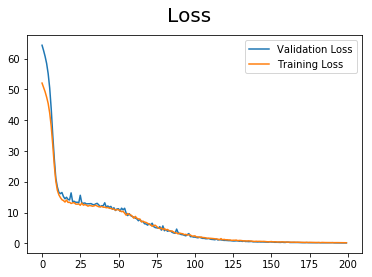

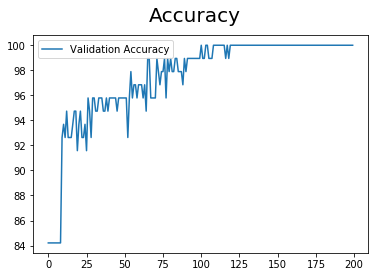

In [17]:


f1 = plt.figure()
f2 = plt.figure()
f1.suptitle('Loss', fontsize = 20)
f2.suptitle('Accuracy', fontsize = 20)
ax1 = f1.add_subplot(111)
ax1.plot(valloss, label='Validation Loss')
ax1.plot(total_loss, label='Training Loss')
ax1.legend()

ax2 = f2.add_subplot(111)
ax2.plot(total_accuracy, label= 'Validation Accuracy')
ax2.legend()
plt.show()

In [18]:


print(total_accuracy)

[84.21052631578947, 84.21052631578947, 84.21052631578947, 84.21052631578947, 84.21052631578947, 84.21052631578947, 84.21052631578947, 84.21052631578947, 84.21052631578947, 92.63157894736842, 93.6842105263158, 92.63157894736842, 94.73684210526315, 92.63157894736842, 92.63157894736842, 92.63157894736842, 93.6842105263158, 94.73684210526315, 94.73684210526315, 91.57894736842105, 93.6842105263158, 94.73684210526315, 92.63157894736842, 92.63157894736842, 93.6842105263158, 91.57894736842105, 95.78947368421052, 94.73684210526315, 92.63157894736842, 95.78947368421052, 95.78947368421052, 94.73684210526315, 94.73684210526315, 95.78947368421052, 95.78947368421052, 95.78947368421052, 94.73684210526315, 94.73684210526315, 95.78947368421052, 94.73684210526315, 95.78947368421052, 95.78947368421052, 95.78947368421052, 95.78947368421052, 95.78947368421052, 94.73684210526315, 95.78947368421052, 95.78947368421052, 95.78947368421052, 95.78947368421052, 95.78947368421052, 95.78947368421052, 92.631578947368

In [19]:
# 5. Save the model checkpoint
#torch.save(m1.state_dict(), 'm1.ckpt')
